In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from xgboost import XGBRegressor


In [ ]:
#Mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_list = os.listdir(folder_path)

In [ ]:
dataframes = {}
for file_name in file_list:
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path)
        dataframes[file_name] = df

## dailyActivity_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'dailyActivity_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for dailyActivity_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,4/12/2016,13162,8.50,8.50,0.0,1.88,0.55,6.06,0.0,25,13,328,728,1985
1,1503960366,4/13/2016,10735,6.97,6.97,0.0,1.57,0.69,4.71,0.0,21,19,217,776,1797
2,1503960366,4/14/2016,10460,6.74,6.74,0.0,2.44,0.40,3.91,0.0,30,11,181,1218,1776
3,1503960366,4/15/2016,9762,6.28,6.28,0.0,2.14,1.26,2.83,0.0,29,34,209,726,1745
4,1503960366,4/16/2016,12669,8.16,8.16,0.0,2.71,0.41,5.04,0.0,36,10,221,773,1863


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
count,9.400000e+02,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000
mean,4.855407e+09,7637.910638,5.489702,5.475351,0.108171,1.502681,0.567543,3.340819,0.001606,21.164894,13.564894,192.812766,991.210638,2303.609574
std,2.424805e+09,5087.150742,3.924606,3.907276,0.619897,2.658941,0.883580,2.040655,0.007346,32.844803,19.987404,109.174700,301.267437,718.166862
min,1.503960e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.320127e+09,3789.750000,2.620000,2.620000,0.000000,0.000000,0.000000,1.945000,0.000000,0.000000,0.000000,127.000000,729.750000,1828.500000
50%,4.445115e+09,7405.500000,5.245000,5.245000,0.000000,0.210000,0.240000,3.365000,0.000000,4.000000,6.000000,199.000000,1057.500000,2134.000000
75%,6.962181e+09,10727.000000,7.712500,7.710000,0.000000,2.052500,0.800000,4.782500,0.000000,32.000000,19.000000,264.000000,1229.500000,2793.250000
max,8.877689e+09,36019.000000,28.030001,28.030001,4.942142,21.920000,6.480000,10.710000,0.110000,210.000000,143.000000,518.000000,1440.000000,4900.000000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityDate,0
TotalSteps,0
TotalDistance,0
TrackerDistance,0
LoggedActivitiesDistance,0
VeryActiveDistance,0
ModeratelyActiveDistance,0
LightActiveDistance,0
SedentaryActiveDistance,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityDate,object
TotalSteps,int64
TotalDistance,float64
TrackerDistance,float64
LoggedActivitiesDistance,float64
VeryActiveDistance,float64
ModeratelyActiveDistance,float64
LightActiveDistance,float64
SedentaryActiveDistance,float64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityDate: 31 unique values
TotalSteps: 842 unique values
TotalDistance: 615 unique values
TrackerDistance: 613 unique values
LoggedActivitiesDistance: 19 unique values
VeryActiveDistance: 333 unique values
ModeratelyActiveDistance: 211 unique values
LightActiveDistance: 491 unique values
SedentaryActiveDistance: 9 unique values
VeryActiveMinutes: 122 unique values
FairlyActiveMinutes: 81 unique values
LightlyActiveMinutes: 335 unique values
SedentaryMinutes: 549 unique values
Calories: 734 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
Id,1.000000,0.185721,0.241000,0.238816,0.188015,0.308691,0.026665,0.019629,-0.015698,0.303608,0.051158,-0.098754,-0.043319,0.396671
TotalSteps,0.185721,1.000000,0.985369,0.984822,0.181849,0.740115,0.507105,0.692208,0.070505,0.667079,0.498693,0.569600,-0.327484,0.591568
TotalDistance,0.241000,0.985369,1.000000,0.999505,0.188332,0.794582,0.470758,0.662002,0.082389,0.681297,0.462899,0.516300,-0.288094,0.644962
TrackerDistance,0.238816,0.984822,0.999505,1.000000,0.162585,0.794338,0.470277,0.661365,0.074591,0.680816,0.463154,0.514713,-0.289343,0.645313
LoggedActivitiesDistance,0.188015,0.181849,0.188332,0.162585,1.000000,0.150852,0.076527,0.138302,0.154996,0.234443,0.053860,0.102135,-0.046999,0.207595
VeryActiveDistance,0.308691,0.740115,0.794582,0.794338,0.150852,1.000000,0.192986,0.157669,0.046117,0.826681,0.211730,0.059845,-0.061754,0.491959
ModeratelyActiveDistance,0.026665,0.507105,0.470758,0.470277,0.076527,0.192986,1.000000,0.237847,0.005793,0.225464,0.946934,0.162092,-0.221436,0.216790
LightActiveDistance,0.019629,0.692208,0.662002,0.661365,0.138302,0.157669,0.237847,1.000000,0.099503,0.154966,0.220129,0.885697,-0.413552,0.466917
SedentaryActiveDistance,-0.015698,0.070505,0.082389,0.074591,0.154996,0.046117,0.005793,0.099503,1.000000,0.008258,-0.022361,0.124185,0.035475,0.043652
VeryActiveMinutes,0.303608,0.667079,0.681297,0.680816,0.234443,0.826681,0.225464,0.154966,0.008258,1.000000,0.312420,0.051926,-0.164671,0.615838


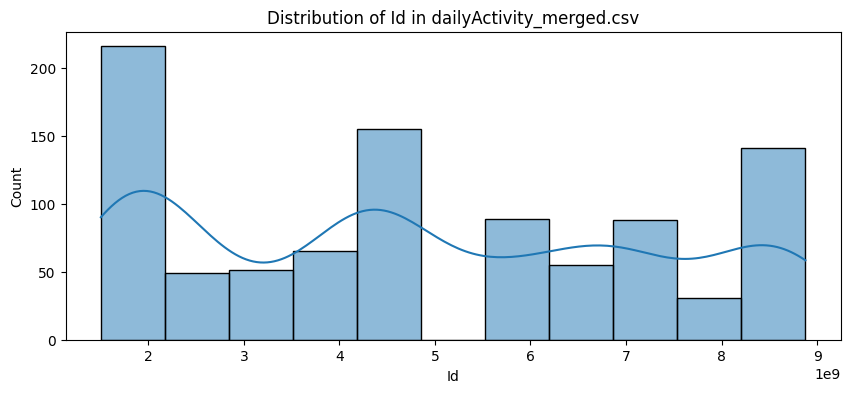

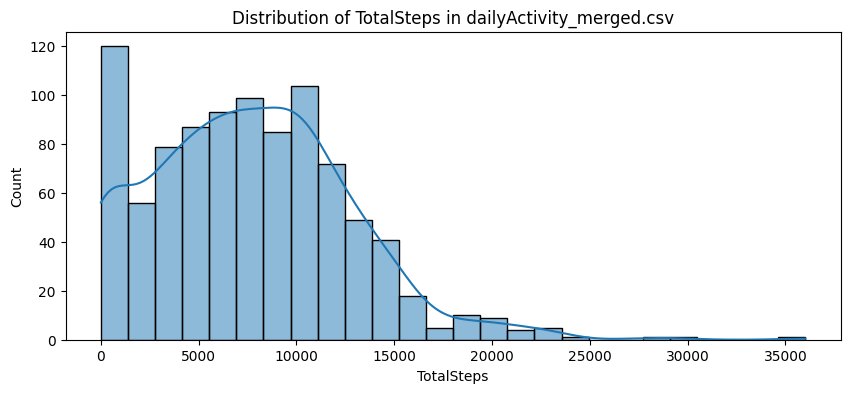

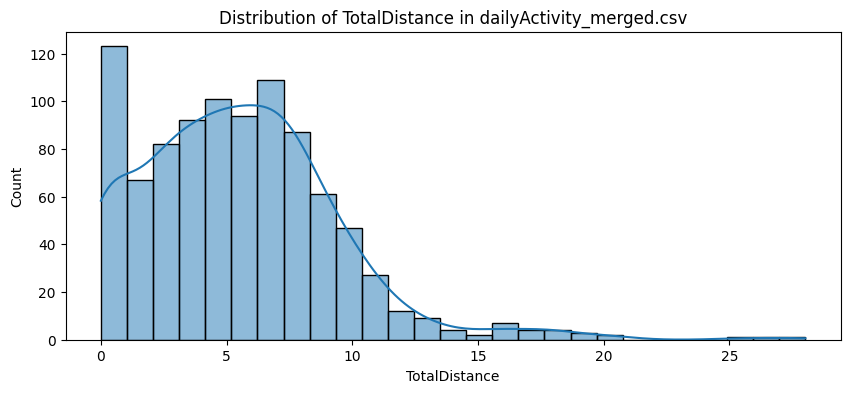

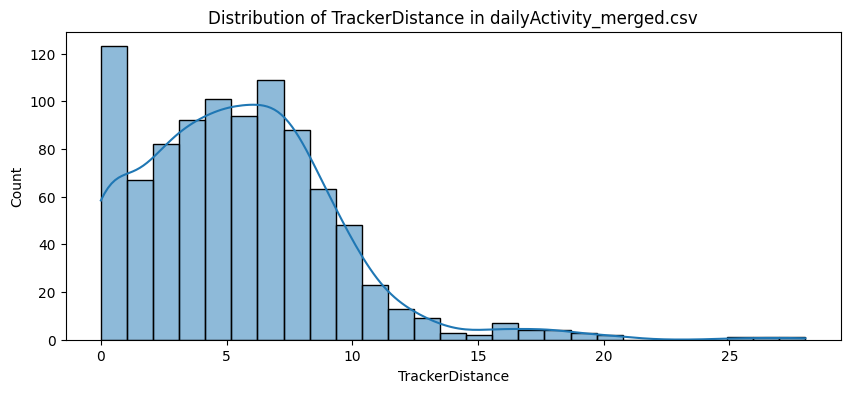

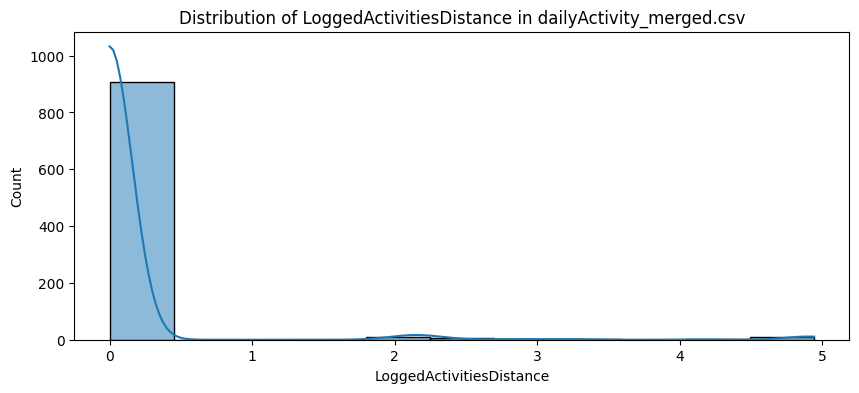

...

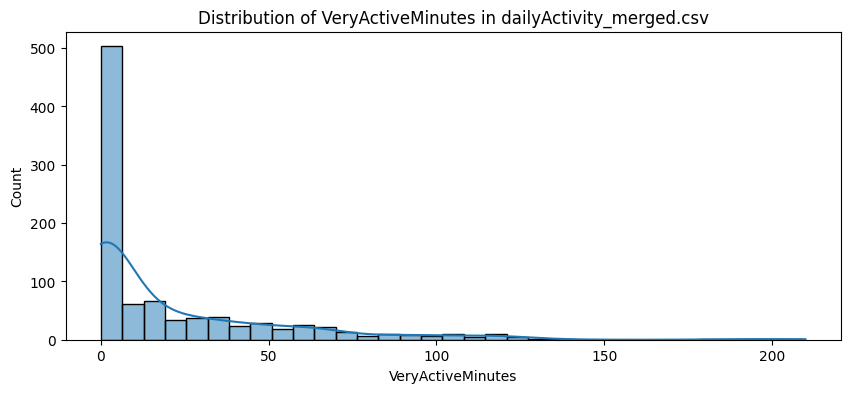

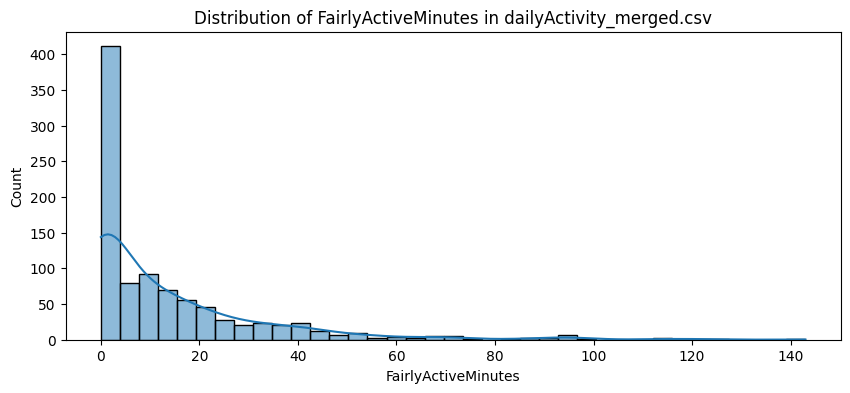

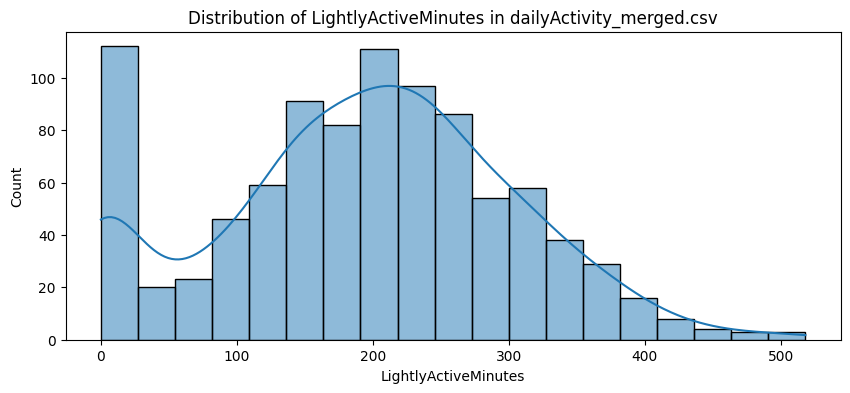

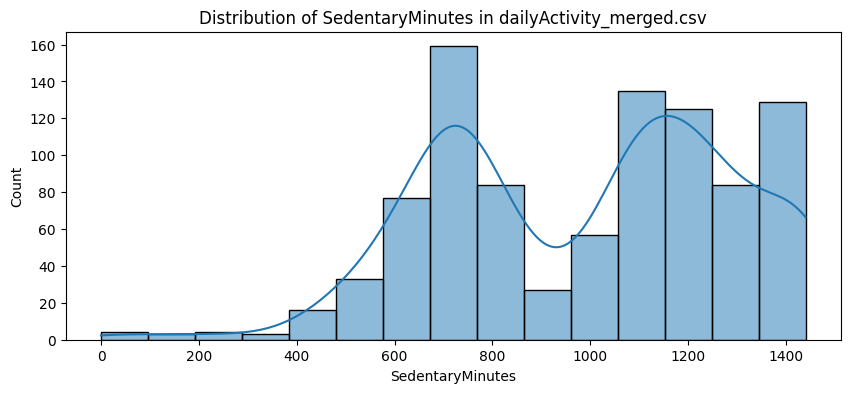

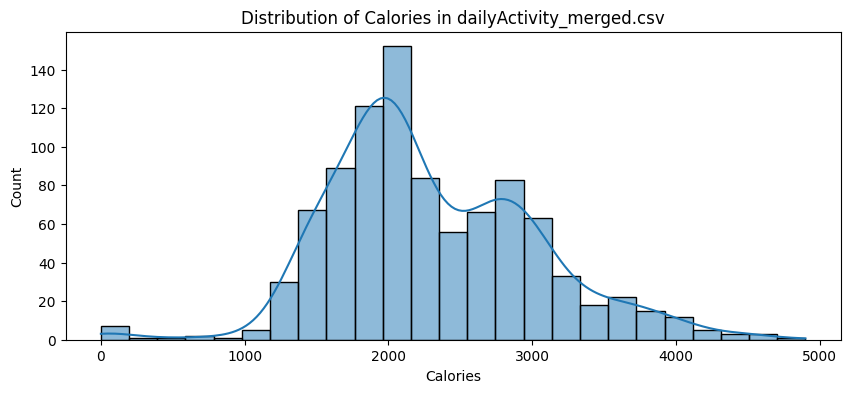

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

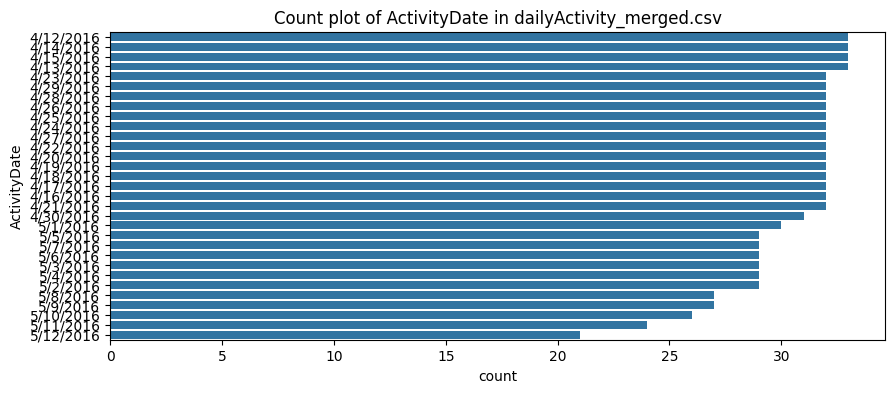

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

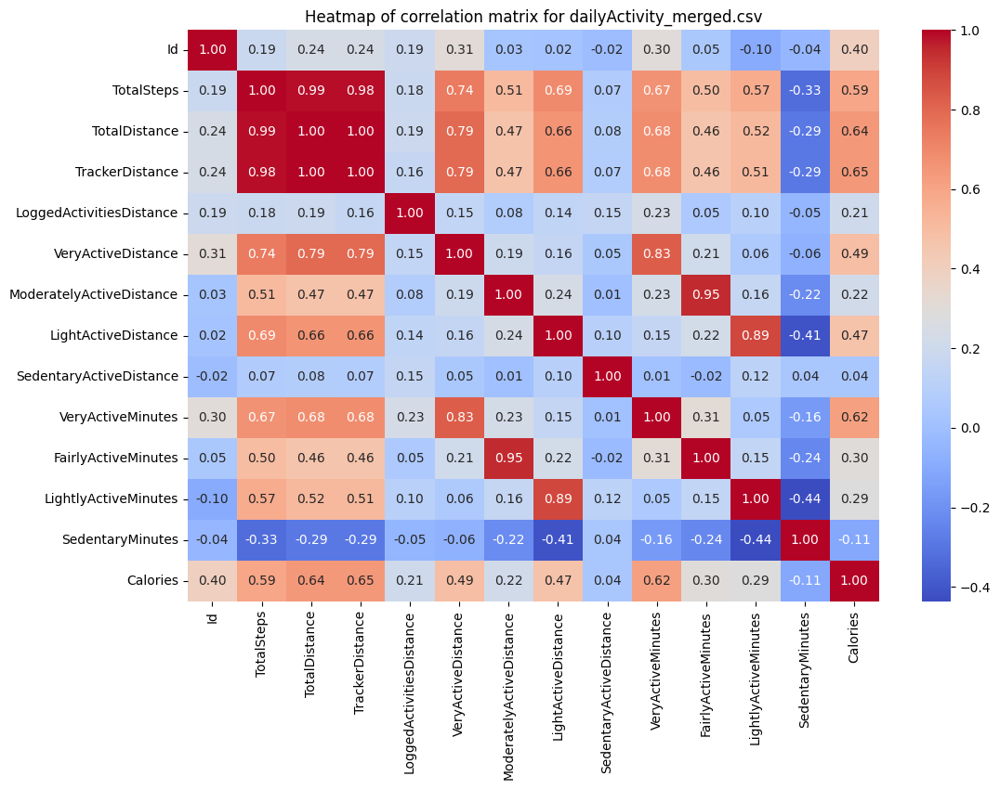

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

In [ ]:
import pandas as pd
from scipy.stats import pearsonr

# Calculate Pearson correlation coefficient and p-value
correlation_coefficient, p_value = pearsonr(df['VeryActiveMinutes'], df['Calories'])

print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

Pearson correlation coefficient: 0.6158382682703377
P-value: 3.1712210634580656e-99


## dailyCalories_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'dailyCalories_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for dailyCalories_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityDay,Calories
0,1503960366,4/12/2016,1985
1,1503960366,4/13/2016,1797
2,1503960366,4/14/2016,1776
3,1503960366,4/15/2016,1745
4,1503960366,4/16/2016,1863


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,Calories
count,9.400000e+02,940.000000
mean,4.855407e+09,2303.609574
std,2.424805e+09,718.166862
min,1.503960e+09,0.000000
25%,2.320127e+09,1828.500000
50%,4.445115e+09,2134.000000
75%,6.962181e+09,2793.250000
max,8.877689e+09,4900.000000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityDay,0
Calories,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityDay,object
Calories,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityDay: 31 unique values
Calories: 734 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,Calories
Id,1.000000,0.396671
Calories,0.396671,1.000000


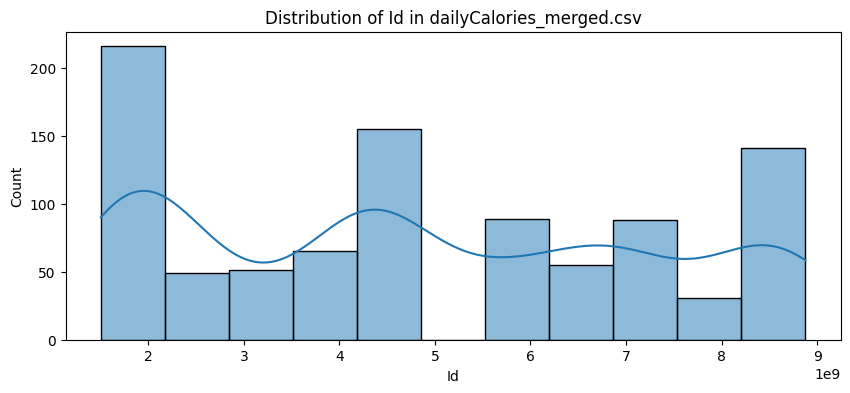

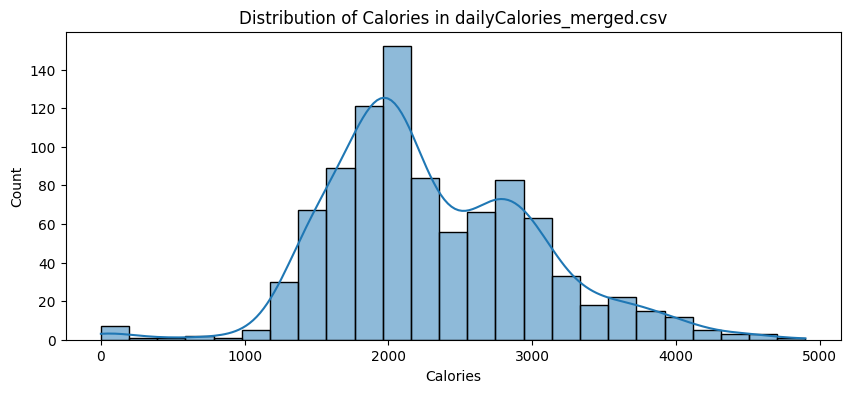

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

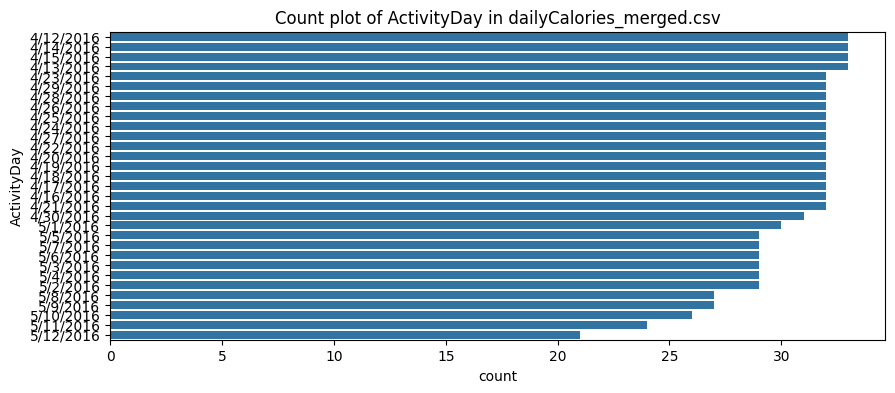

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

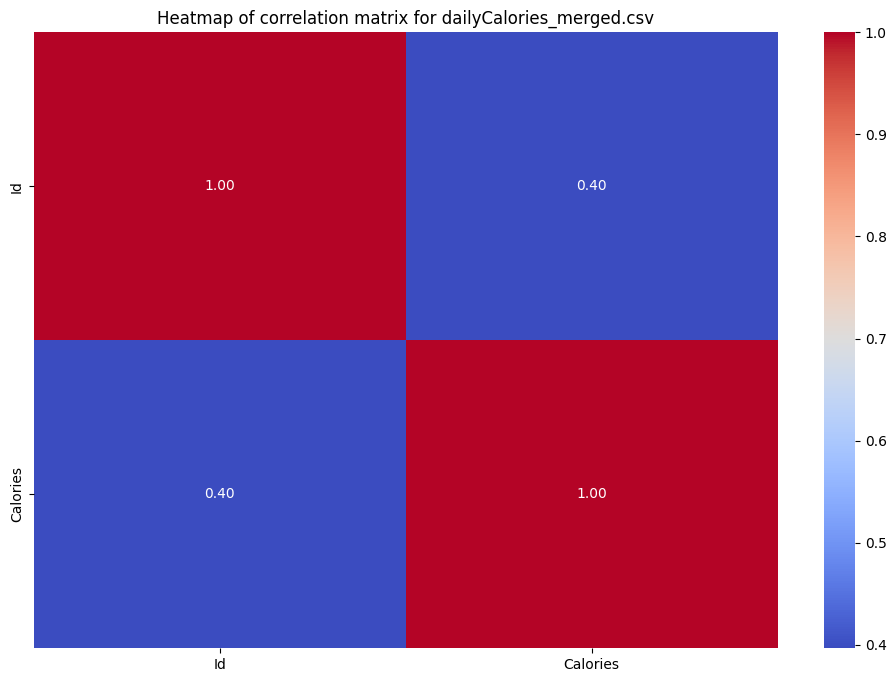

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

## dailyIntensities_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'dailyIntensities_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for dailyIntensities_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityDay,SedentaryMinutes,LightlyActiveMinutes,FairlyActiveMinutes,VeryActiveMinutes,SedentaryActiveDistance,LightActiveDistance,ModeratelyActiveDistance,VeryActiveDistance
0,1503960366,4/12/2016,728,328,13,25,0.0,6.06,0.55,1.88
1,1503960366,4/13/2016,776,217,19,21,0.0,4.71,0.69,1.57
2,1503960366,4/14/2016,1218,181,11,30,0.0,3.91,0.40,2.44
3,1503960366,4/15/2016,726,209,34,29,0.0,2.83,1.26,2.14
4,1503960366,4/16/2016,773,221,10,36,0.0,5.04,0.41,2.71


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,SedentaryMinutes,LightlyActiveMinutes,FairlyActiveMinutes,VeryActiveMinutes,SedentaryActiveDistance,LightActiveDistance,ModeratelyActiveDistance,VeryActiveDistance
count,9.400000e+02,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000
mean,4.855407e+09,991.210638,192.812766,13.564894,21.164894,0.001606,3.340819,0.567543,1.502681
std,2.424805e+09,301.267437,109.174700,19.987404,32.844803,0.007346,2.040655,0.883580,2.658941
min,1.503960e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.320127e+09,729.750000,127.000000,0.000000,0.000000,0.000000,1.945000,0.000000,0.000000
50%,4.445115e+09,1057.500000,199.000000,6.000000,4.000000,0.000000,3.365000,0.240000,0.210000
75%,6.962181e+09,1229.500000,264.000000,19.000000,32.000000,0.000000,4.782500,0.800000,2.052500
max,8.877689e+09,1440.000000,518.000000,143.000000,210.000000,0.110000,10.710000,6.480000,21.920000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityDay,0
SedentaryMinutes,0
LightlyActiveMinutes,0
FairlyActiveMinutes,0
VeryActiveMinutes,0
SedentaryActiveDistance,0
LightActiveDistance,0
ModeratelyActiveDistance,0
VeryActiveDistance,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityDay,object
SedentaryMinutes,int64
LightlyActiveMinutes,int64
FairlyActiveMinutes,int64
VeryActiveMinutes,int64
SedentaryActiveDistance,float64
LightActiveDistance,float64
ModeratelyActiveDistance,float64
VeryActiveDistance,float64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityDay: 31 unique values
SedentaryMinutes: 549 unique values
LightlyActiveMinutes: 335 unique values
FairlyActiveMinutes: 81 unique values
VeryActiveMinutes: 122 unique values
SedentaryActiveDistance: 9 unique values
LightActiveDistance: 491 unique values
ModeratelyActiveDistance: 211 unique values
VeryActiveDistance: 333 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,SedentaryMinutes,LightlyActiveMinutes,FairlyActiveMinutes,VeryActiveMinutes,SedentaryActiveDistance,LightActiveDistance,ModeratelyActiveDistance,VeryActiveDistance
Id,1.000000,-0.043319,-0.098754,0.051158,0.303608,-0.015698,0.019629,0.026665,0.308691
SedentaryMinutes,-0.043319,1.000000,-0.437104,-0.237446,-0.164671,0.035475,-0.413552,-0.221436,-0.061754
LightlyActiveMinutes,-0.098754,-0.437104,1.000000,0.148820,0.051926,0.124185,0.885697,0.162092,0.059845
FairlyActiveMinutes,0.051158,-0.237446,0.148820,1.000000,0.312420,-0.022361,0.220129,0.946934,0.211730
VeryActiveMinutes,0.303608,-0.164671,0.051926,0.312420,1.000000,0.008258,0.154966,0.225464,0.826681
SedentaryActiveDistance,-0.015698,0.035475,0.124185,-0.022361,0.008258,1.000000,0.099503,0.005793,0.046117
LightActiveDistance,0.019629,-0.413552,0.885697,0.220129,0.154966,0.099503,1.000000,0.237847,0.157669
ModeratelyActiveDistance,0.026665,-0.221436,0.162092,0.946934,0.225464,0.005793,0.237847,1.000000,0.192986
VeryActiveDistance,0.308691,-0.061754,0.059845,0.211730,0.826681,0.046117,0.157669,0.192986,1.000000


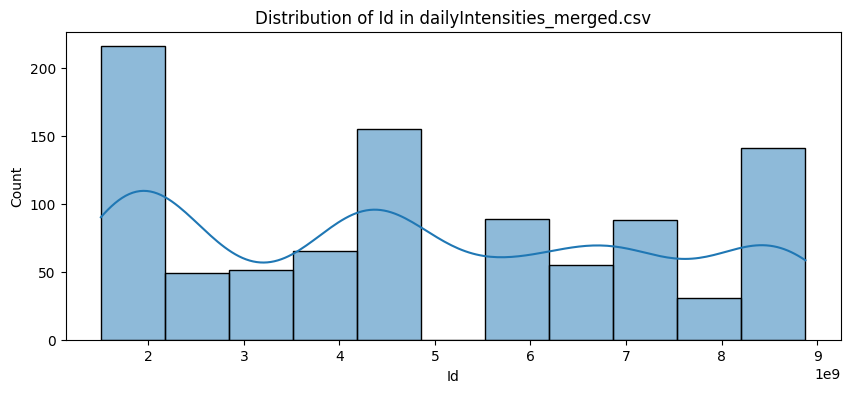

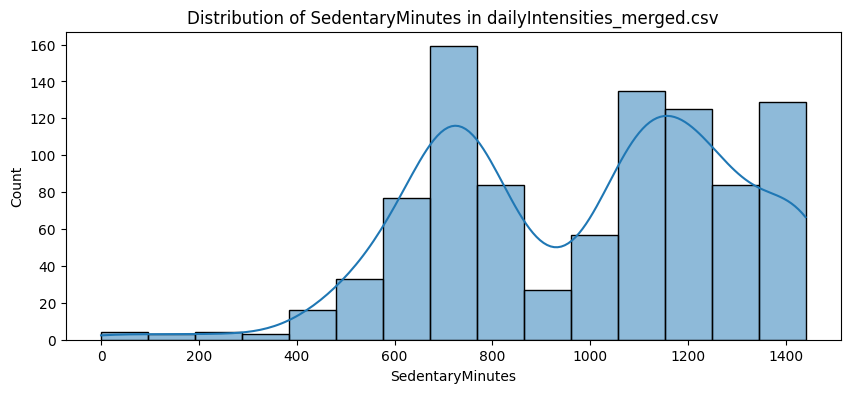

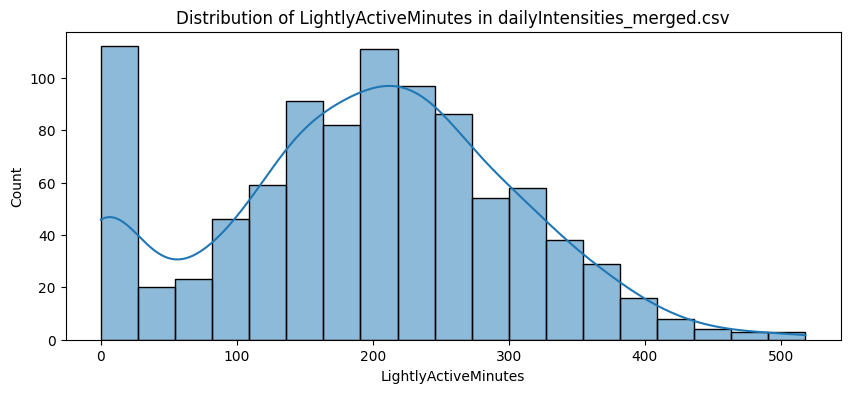

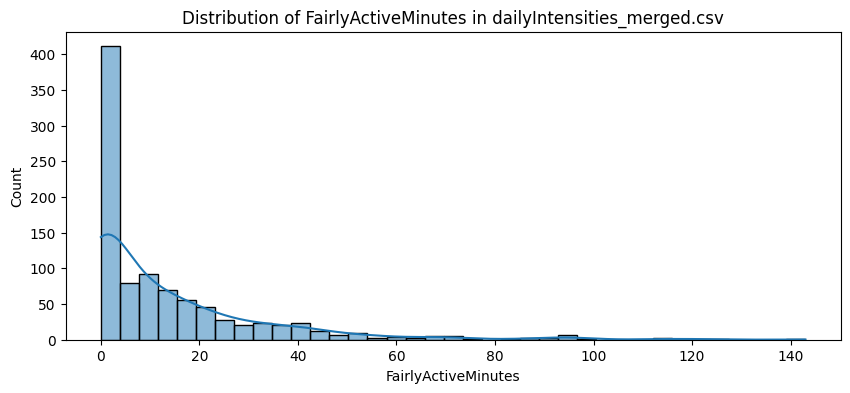

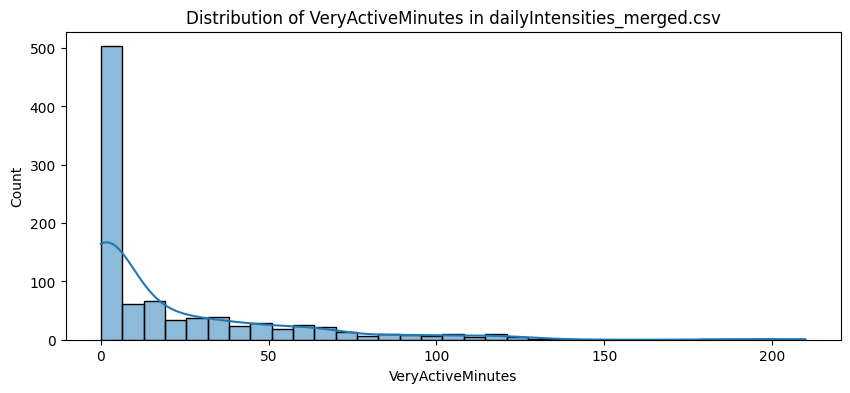

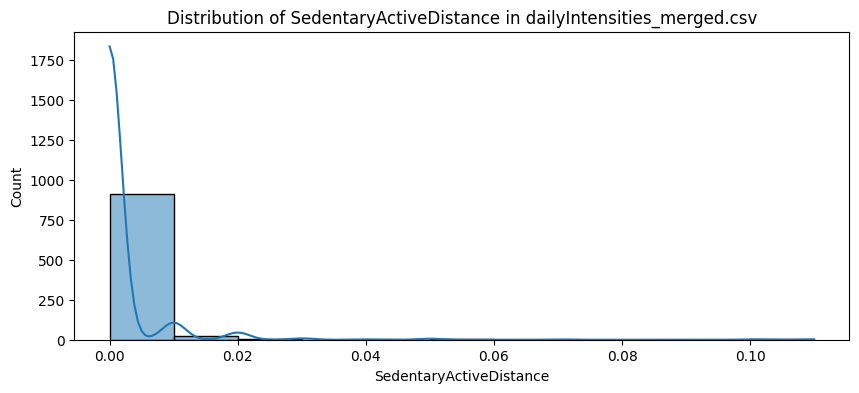

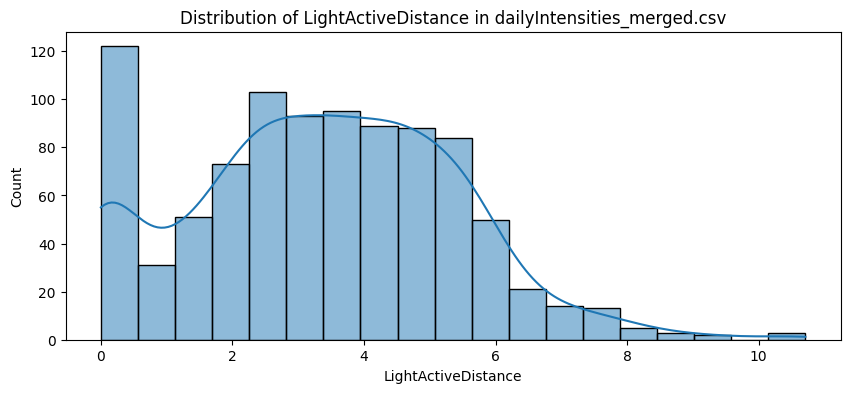

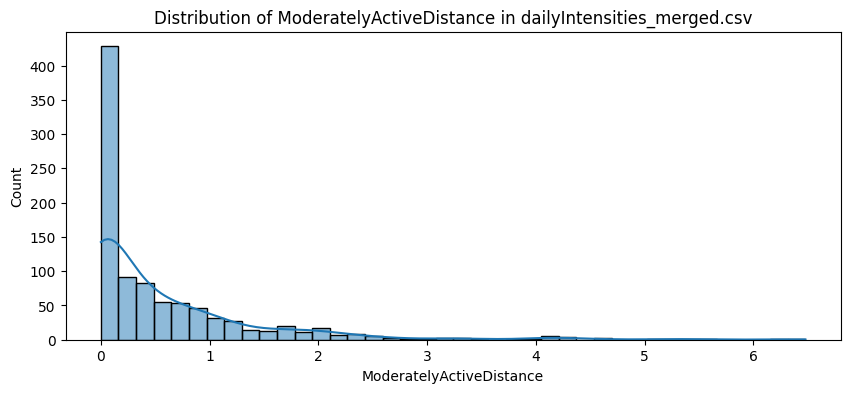

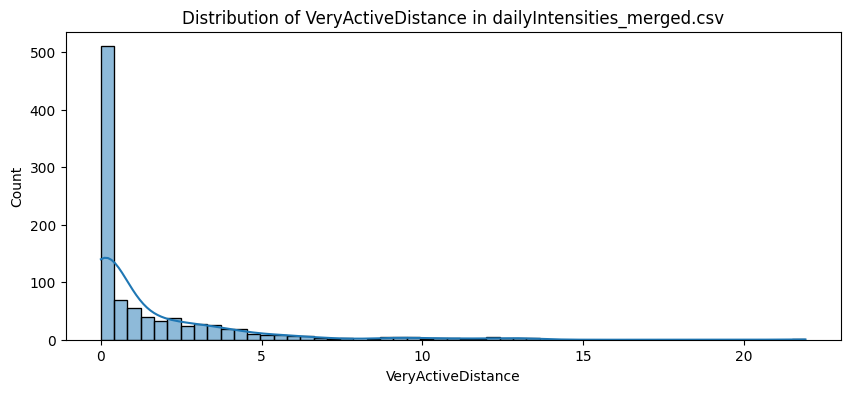

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

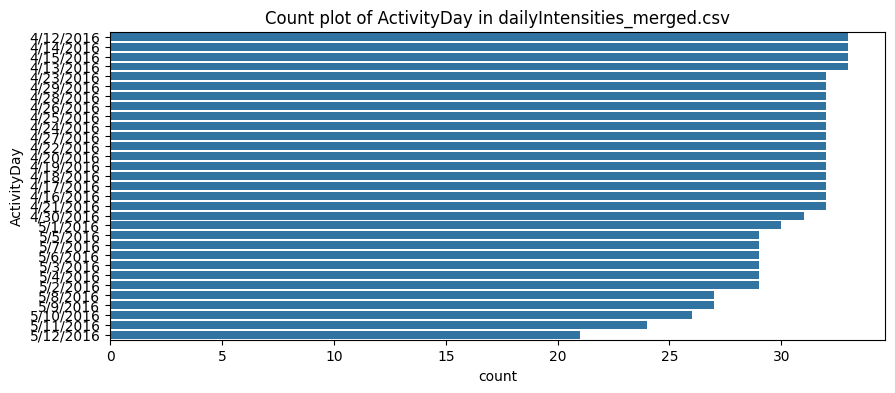

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

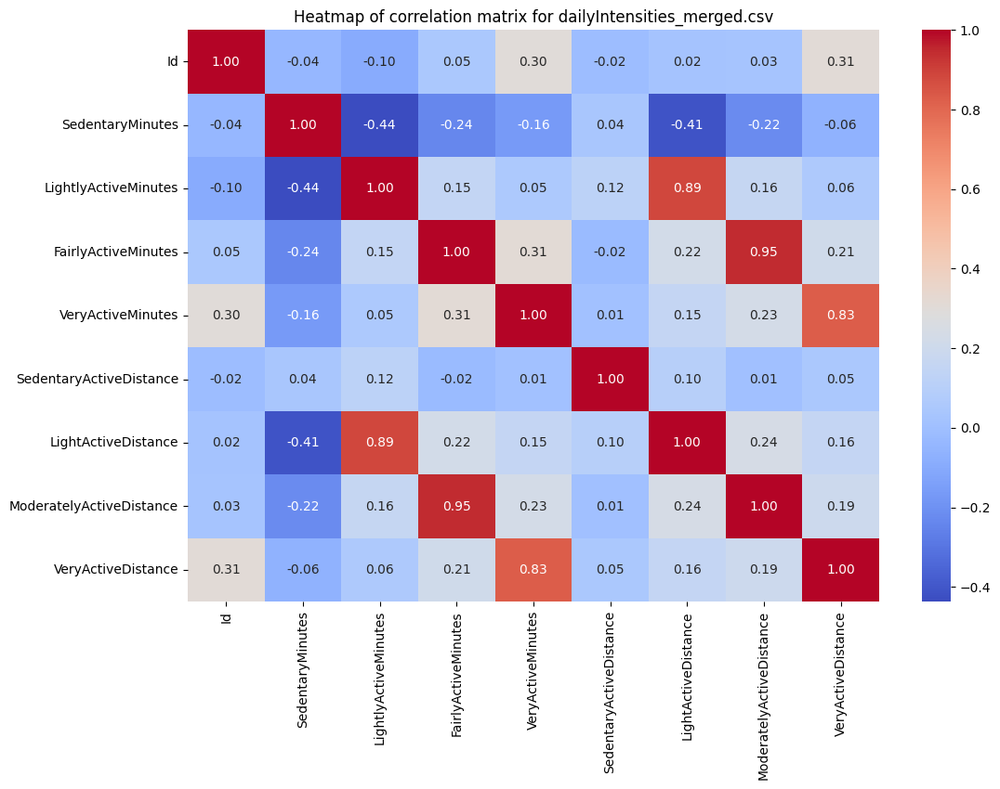

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

## dailySteps_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'dailySteps_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for dailySteps_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityDay,StepTotal
0,1503960366,4/12/2016,13162
1,1503960366,4/13/2016,10735
2,1503960366,4/14/2016,10460
3,1503960366,4/15/2016,9762
4,1503960366,4/16/2016,12669


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,StepTotal
count,9.400000e+02,940.000000
mean,4.855407e+09,7637.910638
std,2.424805e+09,5087.150742
min,1.503960e+09,0.000000
25%,2.320127e+09,3789.750000
50%,4.445115e+09,7405.500000
75%,6.962181e+09,10727.000000
max,8.877689e+09,36019.000000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityDay,0
StepTotal,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityDay,object
StepTotal,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityDay: 31 unique values
StepTotal: 842 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,StepTotal
Id,1.000000,0.185721
StepTotal,0.185721,1.000000


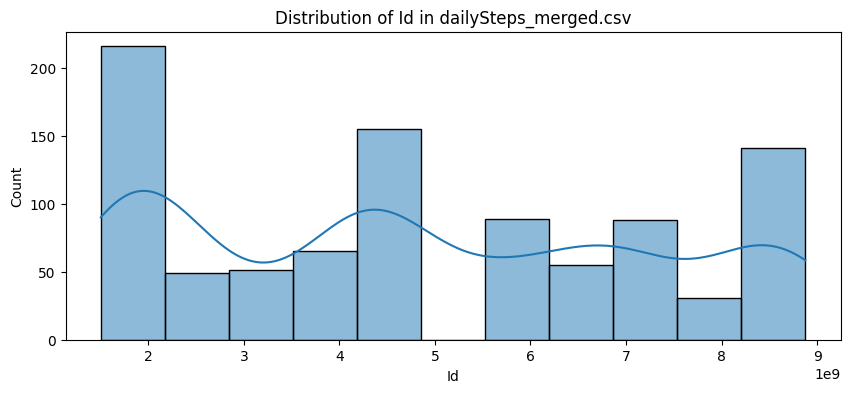

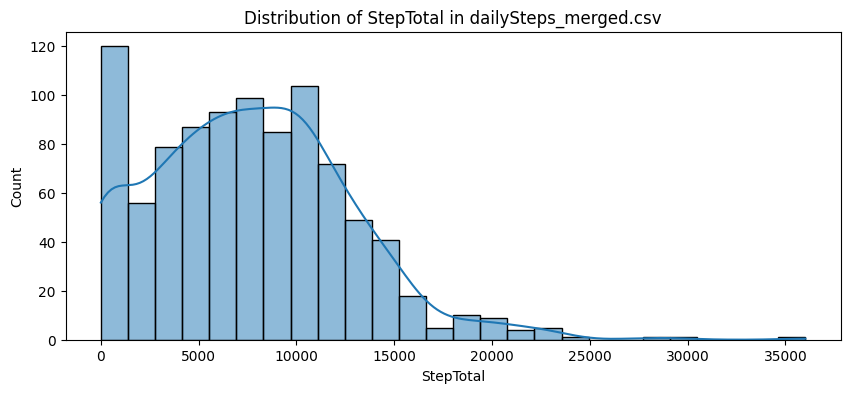

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

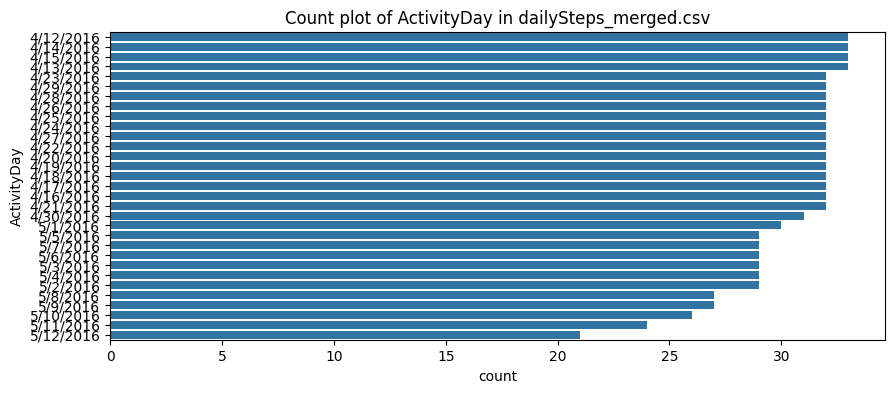

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

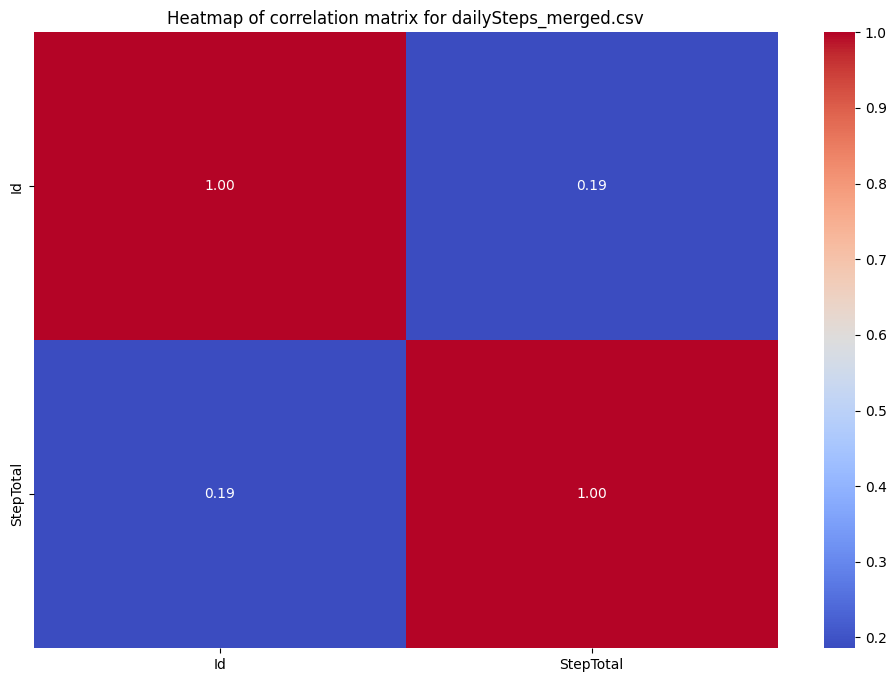

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

## heartrate_seconds_merged.csv

In [ ]:
# file name
file_name = 'heartrate_seconds_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for heartrate_seconds_merged.csv
----------------------------------------
First 5 rows:


,Id,Time,Value
0,2022484408,4/12/2016 7:21:00 AM,97
1,2022484408,4/12/2016 7:21:05 AM,102
2,2022484408,4/12/2016 7:21:10 AM,105
3,2022484408,4/12/2016 7:21:20 AM,103
4,2022484408,4/12/2016 7:21:25 AM,101


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,Value
count,2.483658e+06,2.483658e+06
mean,5.513765e+09,7.732842e+01
std,1.950224e+09,1.940450e+01
min,2.022484e+09,3.600000e+01
25%,4.388162e+09,6.300000e+01
50%,5.553957e+09,7.300000e+01
75%,6.962181e+09,8.800000e+01
max,8.877689e+09,2.030000e+02


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
Time,0
Value,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
Time,object
Value,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 14 unique values
Time: 961274 unique values
Value: 168 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,Value
Id,1.000000,0.059803
Value,0.059803,1.000000


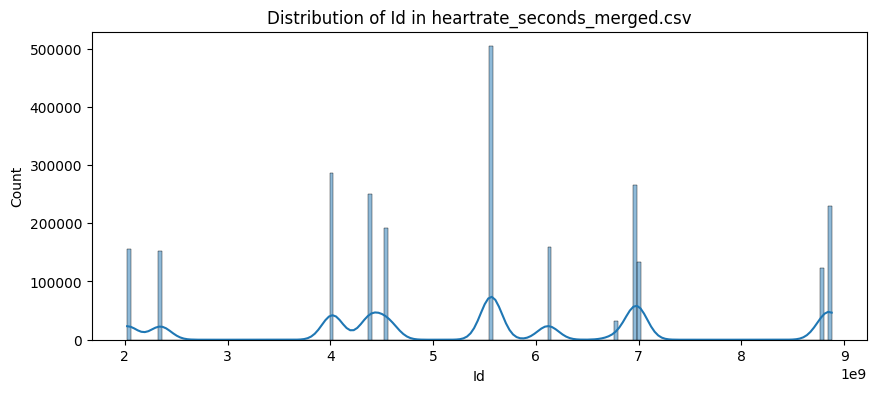

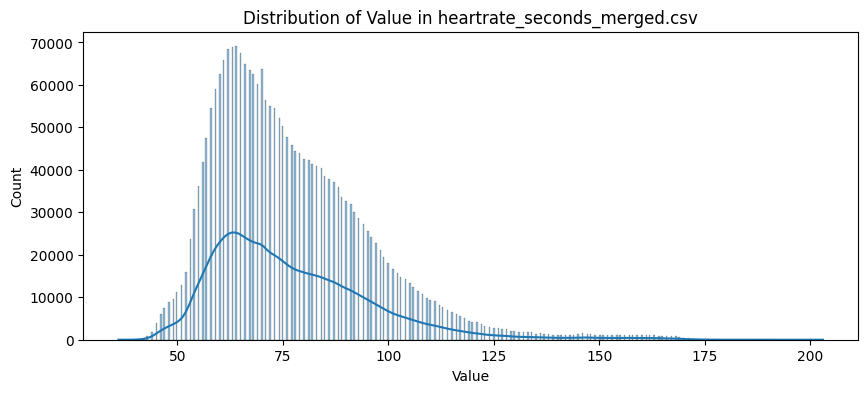

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

## hourlyCalories_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'hourlyCalories_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for hourlyCalories_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityHour,Calories
0,1503960366,4/12/2016 12:00:00 AM,81
1,1503960366,4/12/2016 1:00:00 AM,61
2,1503960366,4/12/2016 2:00:00 AM,59
3,1503960366,4/12/2016 3:00:00 AM,47
4,1503960366,4/12/2016 4:00:00 AM,48


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,Calories
count,2.209900e+04,22099.000000
mean,4.848235e+09,97.386760
std,2.422500e+09,60.702622
min,1.503960e+09,42.000000
25%,2.320127e+09,63.000000
50%,4.445115e+09,83.000000
75%,6.962181e+09,108.000000
max,8.877689e+09,948.000000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityHour,0
Calories,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityHour,object
Calories,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityHour: 736 unique values
Calories: 442 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,Calories
Id,1.00000,0.19768
Calories,0.19768,1.00000


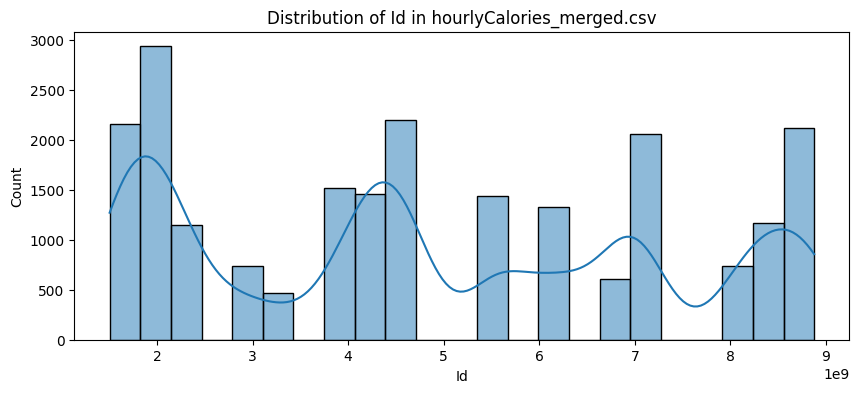

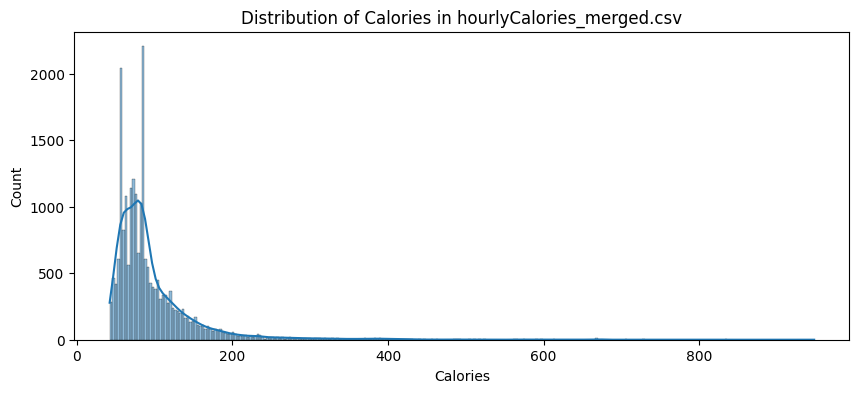

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

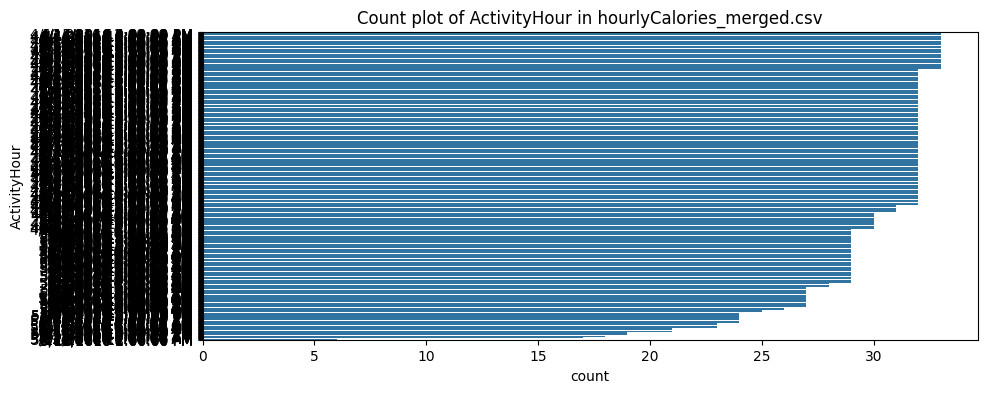

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

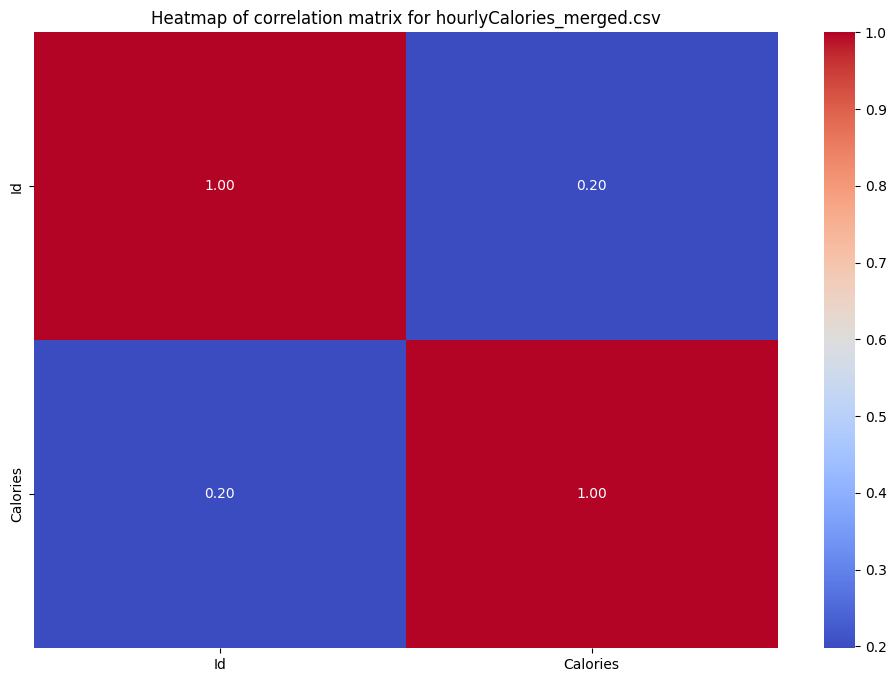

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

## hourlyIntensities_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'hourlyIntensities_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for hourlyIntensities_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityHour,TotalIntensity,AverageIntensity
0,1503960366,4/12/2016 12:00:00 AM,20,0.333333
1,1503960366,4/12/2016 1:00:00 AM,8,0.133333
2,1503960366,4/12/2016 2:00:00 AM,7,0.116667
3,1503960366,4/12/2016 3:00:00 AM,0,0.000000
4,1503960366,4/12/2016 4:00:00 AM,0,0.000000


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,TotalIntensity,AverageIntensity
count,2.209900e+04,22099.000000,22099.000000
mean,4.848235e+09,12.035341,0.200589
std,2.422500e+09,21.133110,0.352219
min,1.503960e+09,0.000000,0.000000
25%,2.320127e+09,0.000000,0.000000
50%,4.445115e+09,3.000000,0.050000
75%,6.962181e+09,16.000000,0.266667
max,8.877689e+09,180.000000,3.000000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityHour,0
TotalIntensity,0
AverageIntensity,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityHour,object
TotalIntensity,int64
AverageIntensity,float64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityHour: 736 unique values
TotalIntensity: 175 unique values
AverageIntensity: 175 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,TotalIntensity,AverageIntensity
Id,1.00000,0.04461,0.04461
TotalIntensity,0.04461,1.00000,1.00000
AverageIntensity,0.04461,1.00000,1.00000


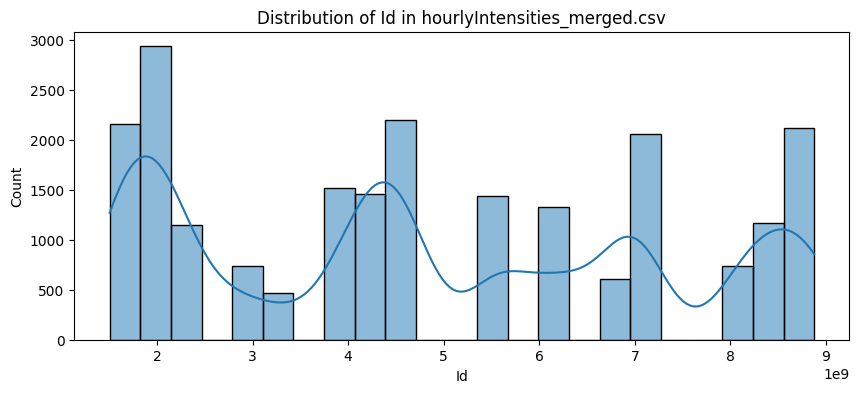

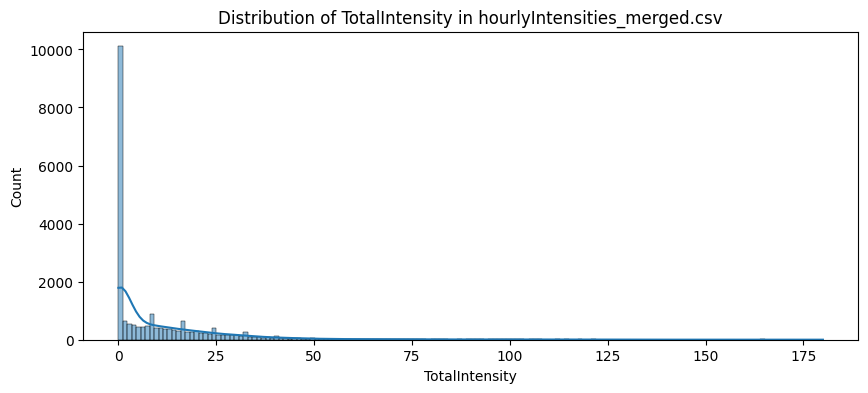

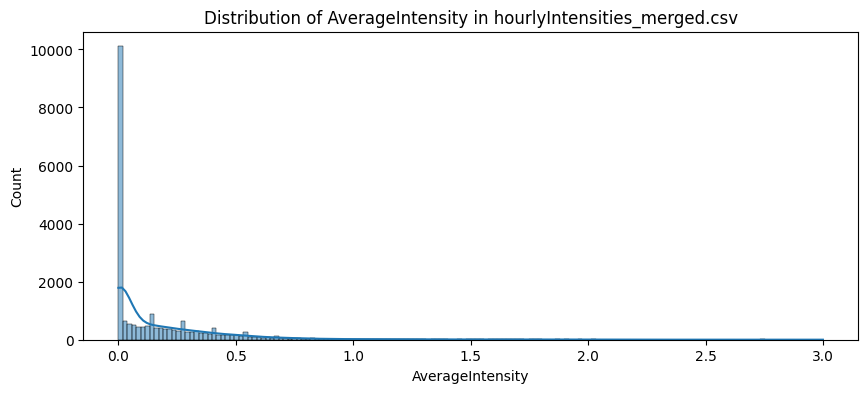

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

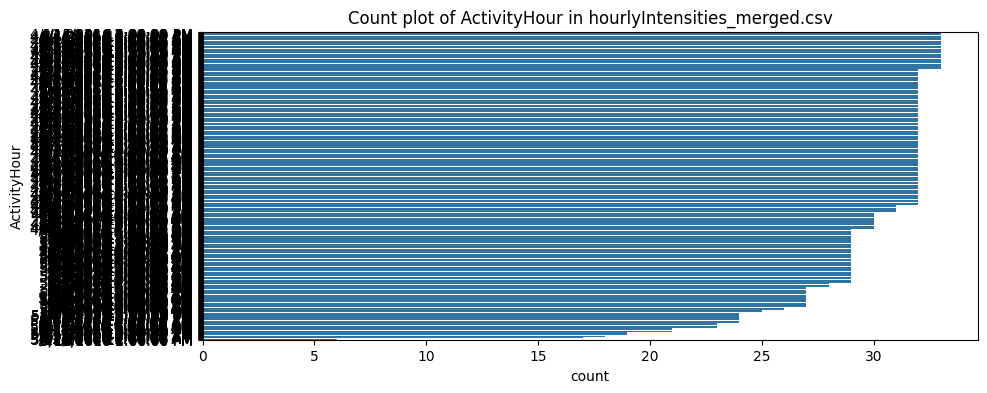

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

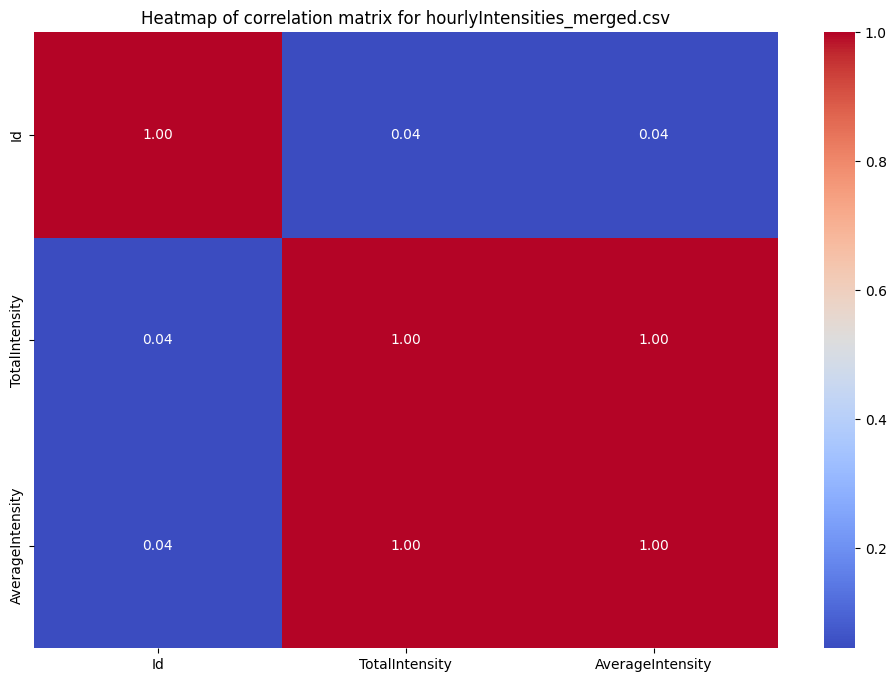

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

##hourlySteps_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'hourlySteps_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for hourlySteps_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityHour,StepTotal
0,1503960366,4/12/2016 12:00:00 AM,373
1,1503960366,4/12/2016 1:00:00 AM,160
2,1503960366,4/12/2016 2:00:00 AM,151
3,1503960366,4/12/2016 3:00:00 AM,0
4,1503960366,4/12/2016 4:00:00 AM,0


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,StepTotal
count,2.209900e+04,22099.000000
mean,4.848235e+09,320.166342
std,2.422500e+09,690.384228
min,1.503960e+09,0.000000
25%,2.320127e+09,0.000000
50%,4.445115e+09,40.000000
75%,6.962181e+09,357.000000
max,8.877689e+09,10554.000000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityHour,0
StepTotal,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityHour,object
StepTotal,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityHour: 736 unique values
StepTotal: 2222 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,StepTotal
Id,1.000000,0.054765
StepTotal,0.054765,1.000000


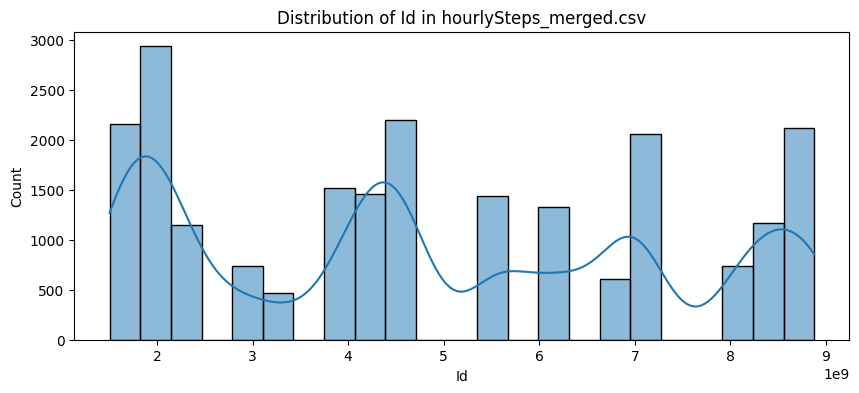

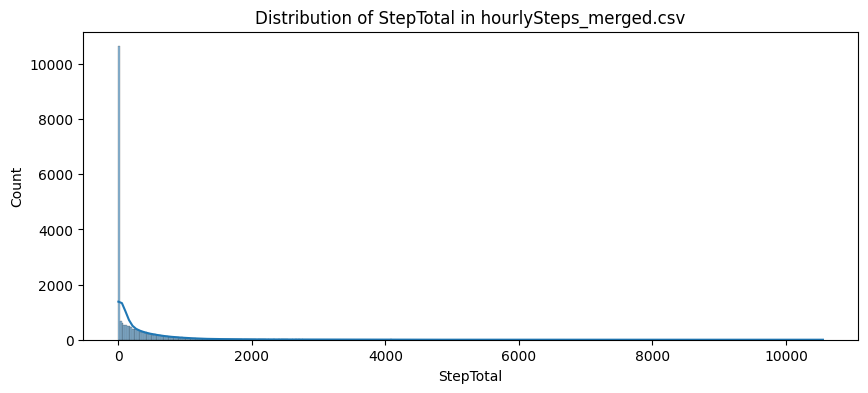

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

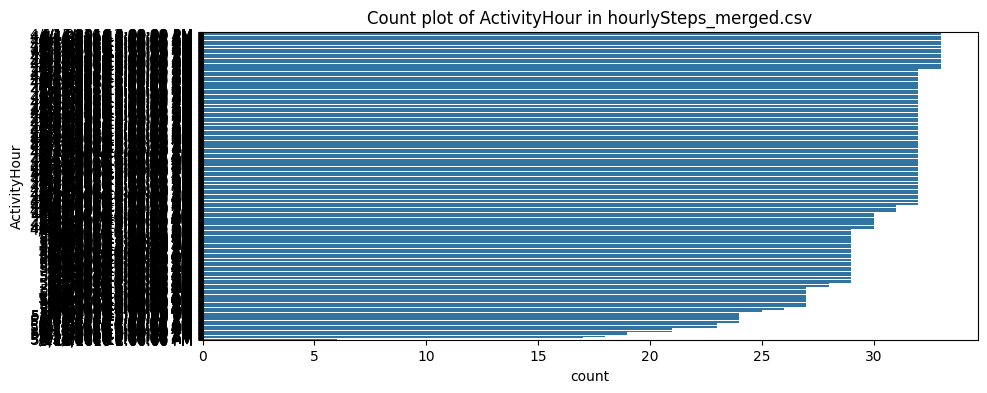

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

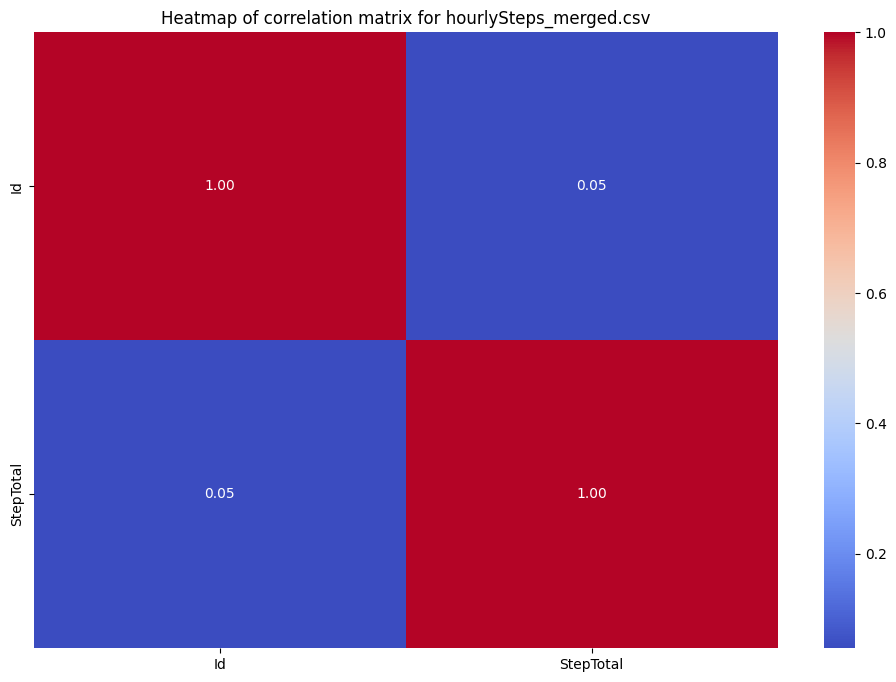

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

## minuteCaloriesNarrow_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'minuteCaloriesNarrow_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for minuteCaloriesNarrow_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityMinute,Calories
0,1503960366,4/12/2016 12:00:00 AM,0.7865
1,1503960366,4/12/2016 12:01:00 AM,0.7865
2,1503960366,4/12/2016 12:02:00 AM,0.7865
3,1503960366,4/12/2016 12:03:00 AM,0.7865
4,1503960366,4/12/2016 12:04:00 AM,0.7865


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,Calories
count,1.325580e+06,1.325580e+06
mean,4.847898e+09,1.623130e+00
std,2.422313e+09,1.410447e+00
min,1.503960e+09,0.000000e+00
25%,2.320127e+09,9.357000e-01
50%,4.445115e+09,1.217600e+00
75%,6.962181e+09,1.432700e+00
max,8.877689e+09,1.974995e+01


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityMinute,0
Calories,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityMinute,object
Calories,float64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityMinute: 44160 unique values
Calories: 3945 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,Calories
Id,1.00000,0.14187
Calories,0.14187,1.00000


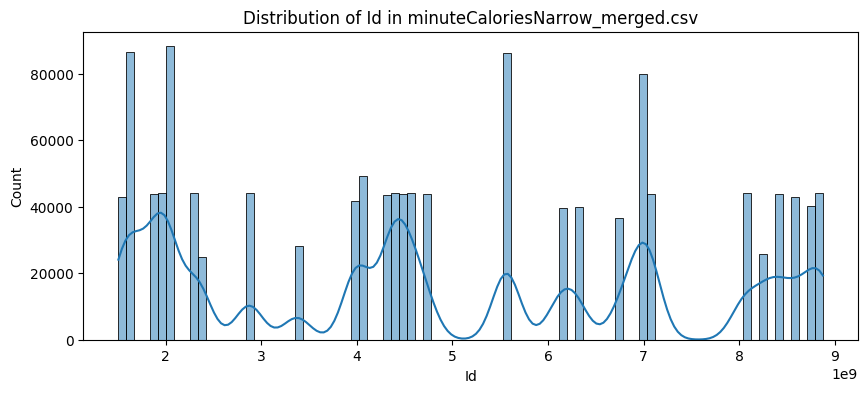

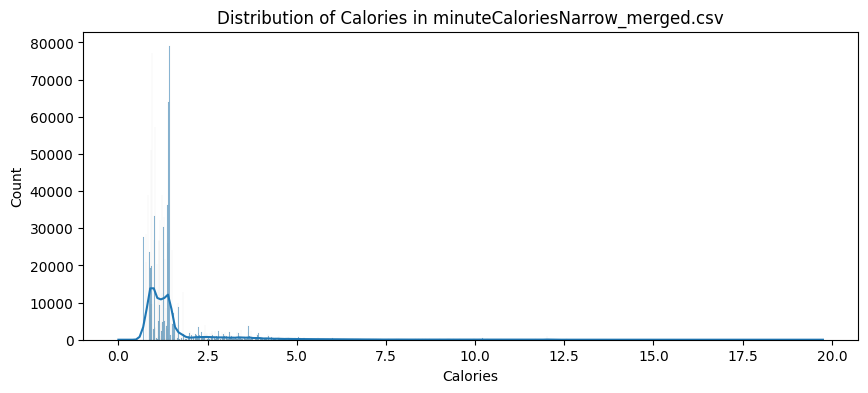

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

##minuteCaloriesWide_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'minuteCaloriesWide_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for minuteCaloriesWide_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityHour,Calories00,Calories01,Calories02,Calories03,Calories04,Calories05,Calories06,Calories07,...,Calories50,Calories51,Calories52,Calories53,Calories54,Calories55,Calories56,Calories57,Calories58,Calories59
0,1503960366,4/13/2016 12:00:00 AM,1.8876,2.2022,0.9438,0.9438,0.9438,2.0449,0.9438,2.2022,...,0.9438,2.0449,2.0449,0.9438,2.3595,1.8876,0.9438,0.9438,0.9438,0.9438
1,1503960366,4/13/2016 1:00:00 AM,0.7865,0.7865,0.7865,0.7865,0.9438,0.9438,0.9438,0.7865,...,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865
2,1503960366,4/13/2016 2:00:00 AM,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,...,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865
3,1503960366,4/13/2016 3:00:00 AM,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,...,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865
4,1503960366,4/13/2016 4:00:00 AM,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,...,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865,0.7865


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,Calories00,Calories01,Calories02,Calories03,Calories04,Calories05,Calories06,Calories07,Calories08,...,Calories50,Calories51,Calories52,Calories53,Calories54,Calories55,Calories56,Calories57,Calories58,Calories59
count,2.164500e+04,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,...,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000
mean,4.836965e+09,1.622629,1.626377,1.637824,1.635515,1.637997,1.638306,1.639910,1.629520,1.623686,...,1.623665,1.613643,1.620958,1.618227,1.621229,1.615972,1.608714,1.612657,1.611715,1.612110
std,2.424088e+09,1.398418,1.395083,1.408828,1.419590,1.433532,1.438253,1.435465,1.424092,1.411596,...,1.407171,1.395206,1.407914,1.400498,1.408974,1.392530,1.376827,1.369097,1.374954,1.373888
min,1.503960e+09,0.702700,0.702700,0.702700,0.702700,0.702700,0.702700,0.702700,0.702700,0.702700,...,0.702700,0.702700,0.702700,0.702700,0.702700,0.702700,0.702700,0.702700,0.702700,0.000000
25%,2.320127e+09,0.935700,0.935700,0.937680,0.935700,0.935700,0.935700,0.935700,0.935700,0.935700,...,0.935700,0.935700,0.935700,0.935700,0.935700,0.935700,0.935700,0.935700,0.935700,0.935700
50%,4.445115e+09,1.217600,1.217600,1.220400,1.218500,1.218500,1.218500,1.218500,1.217600,1.217600,...,1.217600,1.217600,1.217600,1.217600,1.217600,1.217600,1.217600,1.217600,1.217600,1.217600
75%,6.962181e+09,1.432700,1.432700,1.432700,1.432700,1.432700,1.432700,1.432700,1.432700,1.432700,...,1.432700,1.432700,1.432700,1.432700,1.432700,1.432700,1.432700,1.432700,1.432700,1.432700
max,8.877689e+09,19.727337,19.727337,19.727337,19.727337,19.727337,19.727337,19.727337,19.727337,19.727337,...,19.749947,19.749947,19.749947,19.749947,19.749947,19.749947,19.727337,19.727337,19.727337,19.727337


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityHour,0
Calories00,0
Calories01,0
Calories02,0
...,...
Calories55,0
Calories56,0
Calories57,0
Calories58,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityHour,object
Calories00,float64
Calories01,float64
Calories02,float64
...,...
Calories55,float64
Calories56,float64
Calories57,float64
Calories58,float64


## minuteIntensitiesNarrow_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'minuteIntensitiesNarrow_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for minuteIntensitiesNarrow_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityMinute,Intensity
0,1503960366,4/12/2016 12:00:00 AM,0
1,1503960366,4/12/2016 12:01:00 AM,0
2,1503960366,4/12/2016 12:02:00 AM,0
3,1503960366,4/12/2016 12:03:00 AM,0
4,1503960366,4/12/2016 12:04:00 AM,0


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,Intensity
count,1.325580e+06,1.325580e+06
mean,4.847898e+09,2.005937e-01
std,2.422313e+09,5.190227e-01
min,1.503960e+09,0.000000e+00
25%,2.320127e+09,0.000000e+00
50%,4.445115e+09,0.000000e+00
75%,6.962181e+09,0.000000e+00
max,8.877689e+09,3.000000e+00


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityMinute,0
Intensity,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityMinute,object
Intensity,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityMinute: 44160 unique values
Intensity: 4 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,Intensity
Id,1.000000,0.030334
Intensity,0.030334,1.000000


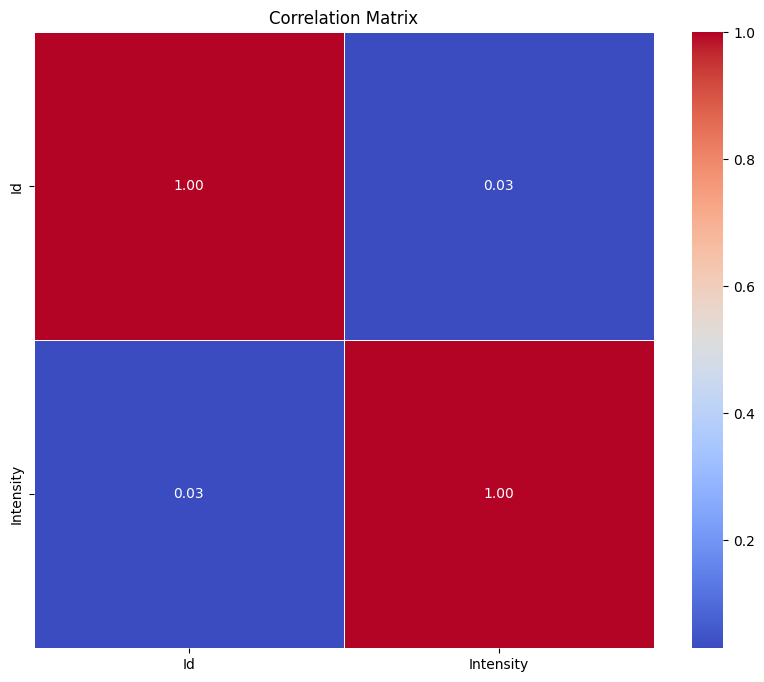

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select numeric columns for the correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# Create a heatmap plot for the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

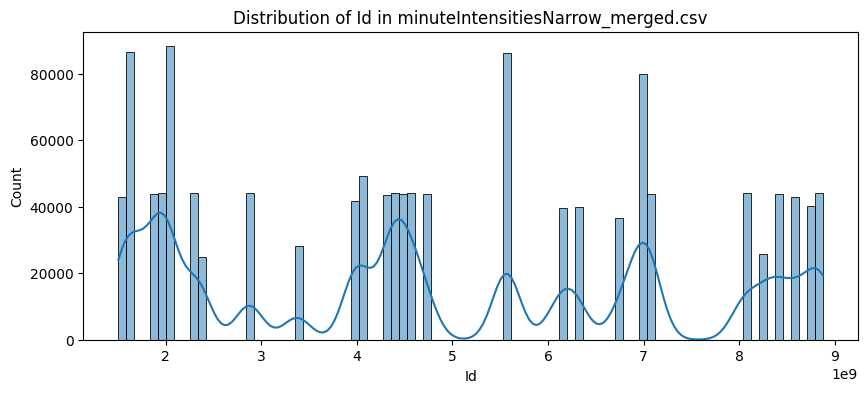

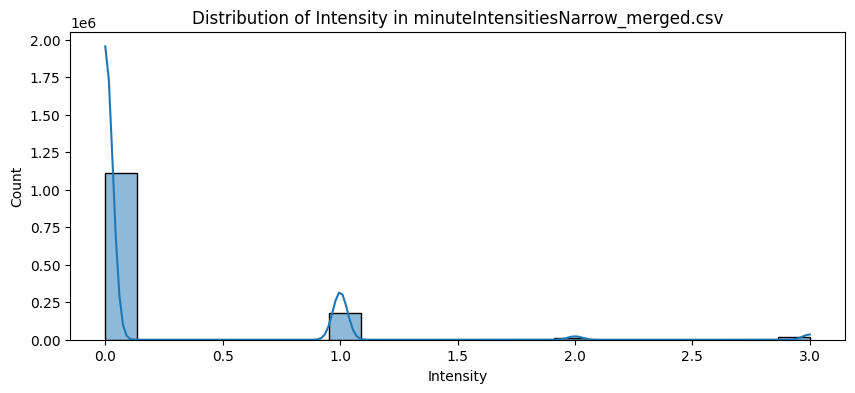

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

##minuteIntensitiesWide_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'minuteIntensitiesWide_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for minuteIntensitiesWide_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityHour,Intensity00,Intensity01,Intensity02,Intensity03,Intensity04,Intensity05,Intensity06,Intensity07,...,Intensity50,Intensity51,Intensity52,Intensity53,Intensity54,Intensity55,Intensity56,Intensity57,Intensity58,Intensity59
0,1503960366,4/13/2016 12:00:00 AM,1,1,0,0,0,1,0,1,...,0,1,1,0,1,1,0,0,0,0
1,1503960366,4/13/2016 1:00:00 AM,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1503960366,4/13/2016 2:00:00 AM,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1503960366,4/13/2016 3:00:00 AM,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1503960366,4/13/2016 4:00:00 AM,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,Intensity00,Intensity01,Intensity02,Intensity03,Intensity04,Intensity05,Intensity06,Intensity07,Intensity08,...,Intensity50,Intensity51,Intensity52,Intensity53,Intensity54,Intensity55,Intensity56,Intensity57,Intensity58,Intensity59
count,2.164500e+04,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,...,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000
mean,4.836965e+09,0.199723,0.203326,0.208177,0.203835,0.205082,0.204897,0.206560,0.201894,0.202310,...,0.201016,0.195796,0.198337,0.199399,0.200139,0.198753,0.195565,0.199122,0.198244,0.195426
std,2.424088e+09,0.509819,0.515432,0.521394,0.518137,0.521956,0.521054,0.523053,0.519074,0.522594,...,0.514814,0.510299,0.511264,0.513331,0.512142,0.511238,0.506435,0.511907,0.510124,0.503423
min,1.503960e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.320127e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.445115e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6.962181e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,8.877689e+09,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,...,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityHour,0
Intensity00,0
Intensity01,0
Intensity02,0
...,...
Intensity55,0
Intensity56,0
Intensity57,0
Intensity58,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityHour,object
Intensity00,int64
Intensity01,int64
Intensity02,int64
...,...
Intensity55,int64
Intensity56,int64
Intensity57,int64
Intensity58,int64


##minuteMETsNarrow_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'minuteMETsNarrow_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for minuteMETsNarrow_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityMinute,METs
0,1503960366,4/12/2016 12:00:00 AM,10
1,1503960366,4/12/2016 12:01:00 AM,10
2,1503960366,4/12/2016 12:02:00 AM,10
3,1503960366,4/12/2016 12:03:00 AM,10
4,1503960366,4/12/2016 12:04:00 AM,10


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,METs
count,1.325580e+06,1.325580e+06
mean,4.847898e+09,1.469001e+01
std,2.422313e+09,1.205541e+01
min,1.503960e+09,0.000000e+00
25%,2.320127e+09,1.000000e+01
50%,4.445115e+09,1.000000e+01
75%,6.962181e+09,1.100000e+01
max,8.877689e+09,1.570000e+02


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityMinute,0
METs,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityMinute,object
METs,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityMinute: 44160 unique values
METs: 136 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,METs
Id,1.000000,0.045925
METs,0.045925,1.000000


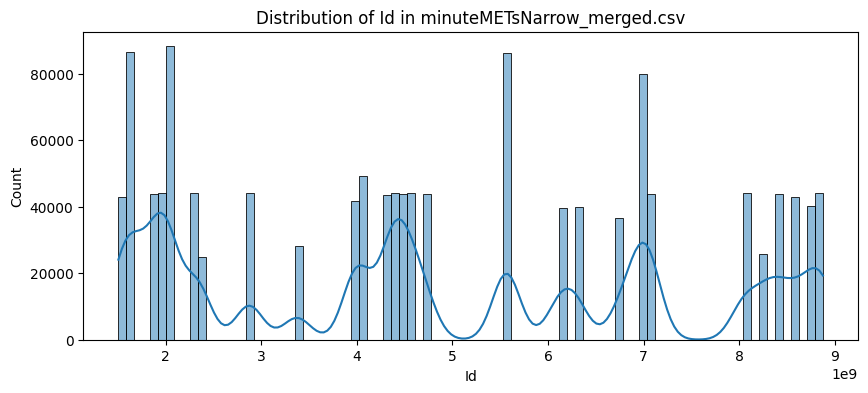

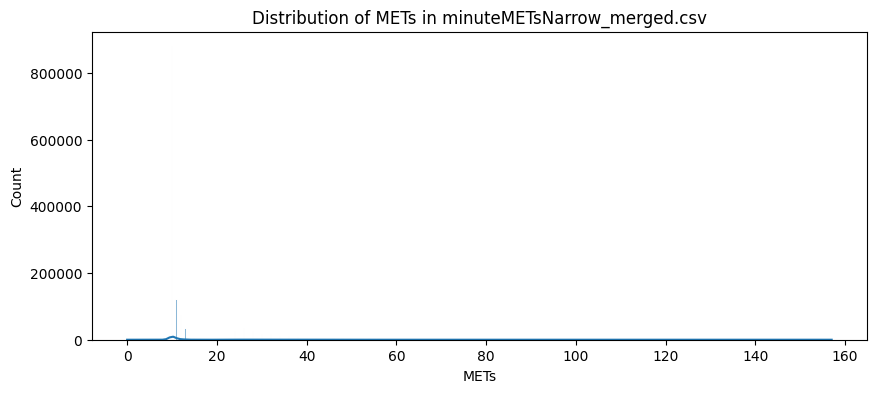

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

##minuteSleep_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'minuteSleep_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for minuteSleep_merged.csv
----------------------------------------
First 5 rows:


,Id,date,value,logId
0,1503960366,4/12/2016 2:47:30 AM,3,11380564589
1,1503960366,4/12/2016 2:48:30 AM,2,11380564589
2,1503960366,4/12/2016 2:49:30 AM,1,11380564589
3,1503960366,4/12/2016 2:50:30 AM,1,11380564589
4,1503960366,4/12/2016 2:51:30 AM,1,11380564589


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,value,logId
count,1.885210e+05,188521.000000,1.885210e+05
mean,4.996595e+09,1.095793,1.149611e+10
std,2.066950e+09,0.328673,6.822863e+07
min,1.503960e+09,1.000000,1.137223e+10
25%,3.977334e+09,1.000000,1.143931e+10
50%,4.702922e+09,1.000000,1.150114e+10
75%,6.962181e+09,1.000000,1.155253e+10
max,8.792010e+09,3.000000,1.161625e+10


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
date,0
value,0
logId,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
date,object
value,int64
logId,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 24 unique values
date: 49773 unique values
value: 3 unique values
logId: 459 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,value,logId
Id,1.000000,-0.070629,0.007422
value,-0.070629,1.000000,-0.003246
logId,0.007422,-0.003246,1.000000


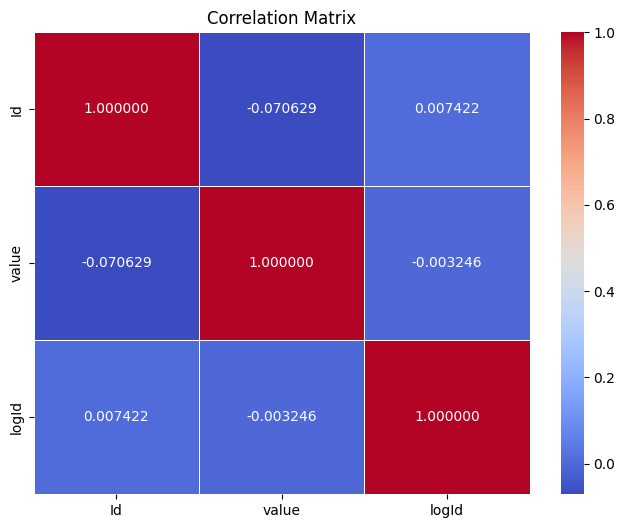

In [ ]:
# Assuming you have already selected the numeric columns and computed the correlation matrix:
corr_matrix = numeric_df.corr()

# Create a heatmap plot for the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, fmt='.6f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

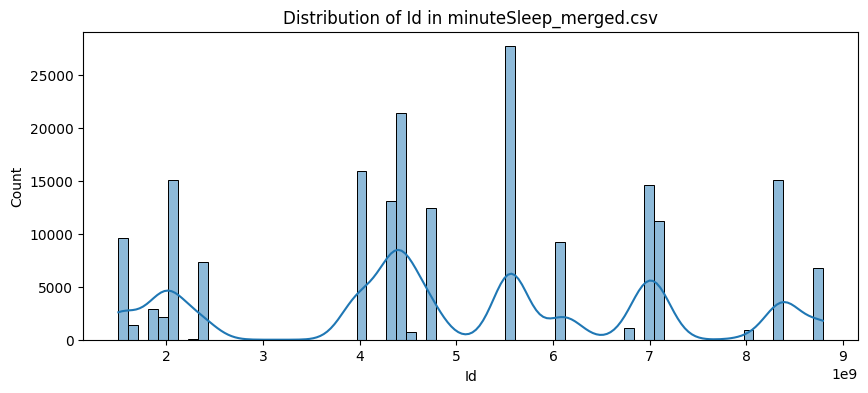

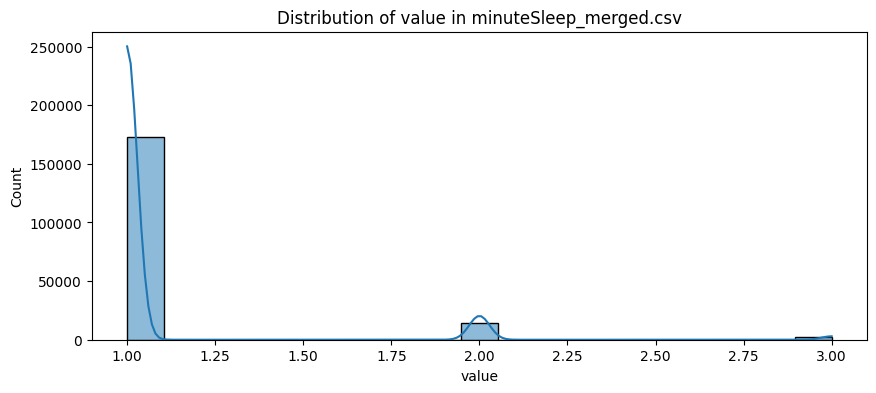

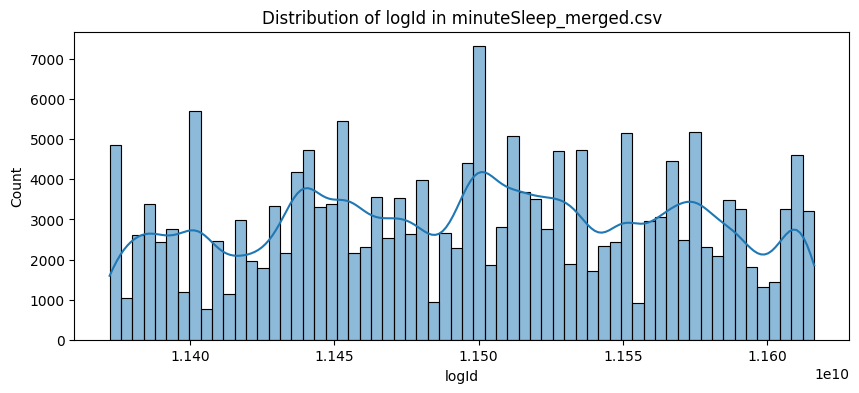

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

## minuteStepsNarrow_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'minuteStepsNarrow_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for minuteStepsNarrow_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityMinute,Steps
0,1503960366,4/12/2016 12:00:00 AM,0
1,1503960366,4/12/2016 12:01:00 AM,0
2,1503960366,4/12/2016 12:02:00 AM,0
3,1503960366,4/12/2016 12:03:00 AM,0
4,1503960366,4/12/2016 12:04:00 AM,0


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,Steps
count,1.325580e+06,1.325580e+06
mean,4.847898e+09,5.336192e+00
std,2.422313e+09,1.812830e+01
min,1.503960e+09,0.000000e+00
25%,2.320127e+09,0.000000e+00
50%,4.445115e+09,0.000000e+00
75%,6.962181e+09,0.000000e+00
max,8.877689e+09,2.200000e+02


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityMinute,0
Steps,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityMinute,object
Steps,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityMinute: 44160 unique values
Steps: 193 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,Steps
Id,1.000000,0.034785
Steps,0.034785,1.000000


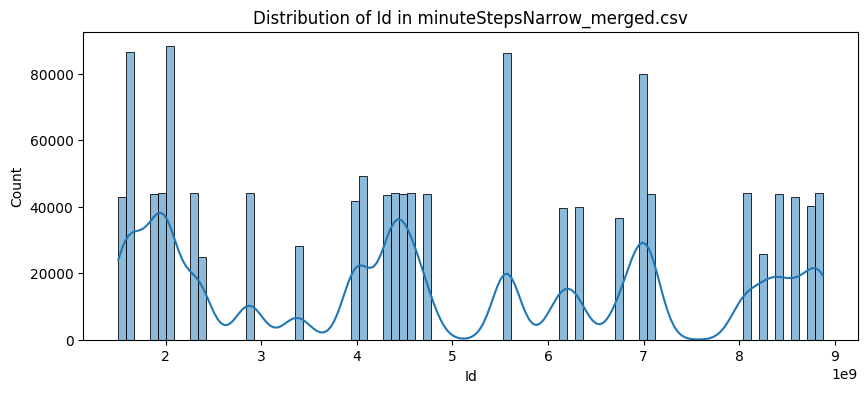

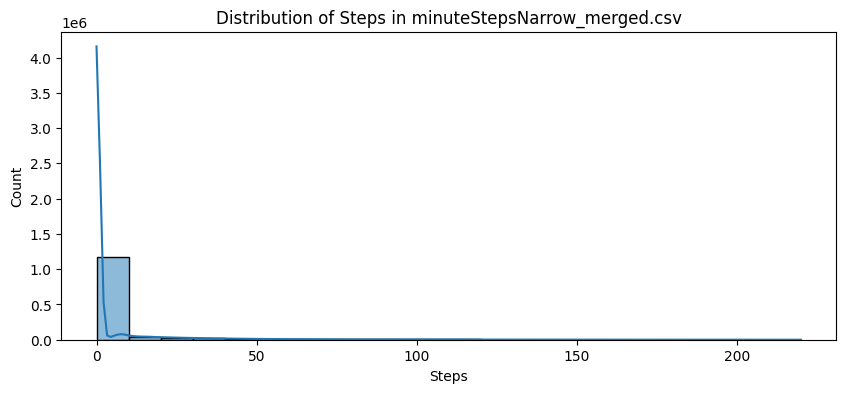

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

## minuteStepsWide_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'minuteStepsWide_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for minuteStepsWide_merged.csv
----------------------------------------
First 5 rows:


,Id,ActivityHour,Steps00,Steps01,Steps02,Steps03,Steps04,Steps05,Steps06,Steps07,...,Steps50,Steps51,Steps52,Steps53,Steps54,Steps55,Steps56,Steps57,Steps58,Steps59
0,1503960366,4/13/2016 12:00:00 AM,4,16,0,0,0,9,0,17,...,0,9,8,0,20,1,0,0,0,0
1,1503960366,4/13/2016 1:00:00 AM,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1503960366,4/13/2016 2:00:00 AM,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1503960366,4/13/2016 3:00:00 AM,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1503960366,4/13/2016 4:00:00 AM,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,Steps00,Steps01,Steps02,Steps03,Steps04,Steps05,Steps06,Steps07,Steps08,...,Steps50,Steps51,Steps52,Steps53,Steps54,Steps55,Steps56,Steps57,Steps58,Steps59
count,2.164500e+04,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.00000,...,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000,21645.000000
mean,4.836965e+09,5.304366,5.335412,5.531439,5.469439,5.461862,5.590252,5.559483,5.412474,5.35879,...,5.329175,5.194456,5.225595,5.145484,5.223654,5.281220,5.179533,5.251836,5.143636,5.288935
std,2.424088e+09,17.783331,17.678358,18.079791,18.106414,18.288469,18.565165,18.484912,18.335665,18.20523,...,17.870527,17.601857,17.618497,17.570195,17.684634,17.828413,17.569268,17.686583,17.427494,17.721454
min,1.503960e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.320127e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.445115e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6.962181e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,8.877689e+09,186.000000,180.000000,182.000000,182.000000,181.000000,180.000000,181.000000,183.000000,180.00000,...,182.000000,181.000000,181.000000,181.000000,184.000000,181.000000,182.000000,182.000000,180.000000,189.000000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
ActivityHour,0
Steps00,0
Steps01,0
Steps02,0
...,...
Steps55,0
Steps56,0
Steps57,0
Steps58,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
ActivityHour,object
Steps00,int64
Steps01,int64
Steps02,int64
...,...
Steps55,int64
Steps56,int64
Steps57,int64
Steps58,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 33 unique values
ActivityHour: 729 unique values
Steps00: 158 unique values
Steps01: 153 unique values
Steps02: 156 unique values
Steps03: 154 unique values
Steps04: 159 unique values
Steps05: 161 unique values
Steps06: 158 unique values
Steps07: 164 unique values
Steps08: 160 unique values
Steps09: 157 unique values
Steps10: 162 unique values
Steps11: 158 unique values
Steps12: 158 unique values
Steps13: 162 unique values
Steps14: 161 unique values
Steps15: 155 unique values
Steps16: 156 unique values
Steps17: 159 unique values
Steps18: 160 unique values
Steps19: 159 unique values
Steps20: 161 unique values
Steps21: 161 unique values
Steps22: 160 unique values
Steps23: 163 unique values
Steps24: 160 unique values
Steps25: 163 unique values
Steps26: 161 unique values
Steps27: 160 unique values
Steps28: 153 unique values
Steps29: 164 unique values
Steps30: 159 unique values
Steps31: 161 unique values
Steps32: 160 unique values
Steps33: 157 unique v

In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,Steps00,Steps01,Steps02,Steps03,Steps04,Steps05,Steps06,Steps07,Steps08,...,Steps50,Steps51,Steps52,Steps53,Steps54,Steps55,Steps56,Steps57,Steps58,Steps59
Id,1.000000,0.037548,0.038173,0.027173,0.031989,0.037830,0.036477,0.042016,0.035658,0.039169,...,0.032592,0.031548,0.033031,0.040347,0.039103,0.034149,0.033327,0.032954,0.032769,0.032797
Steps00,0.037548,1.000000,0.788962,0.682868,0.617513,0.565245,0.530064,0.503413,0.475895,0.457192,...,0.155178,0.151029,0.137804,0.144381,0.143083,0.133702,0.137880,0.123971,0.124973,0.130031
Steps01,0.038173,0.788962,1.000000,0.794999,0.688082,0.623146,0.573974,0.540747,0.510275,0.484242,...,0.154790,0.143287,0.135806,0.143110,0.143410,0.133323,0.131669,0.120141,0.121170,0.122892
Steps02,0.027173,0.682868,0.794999,1.000000,0.801577,0.699412,0.627068,0.579189,0.548575,0.513637,...,0.164075,0.164195,0.156287,0.157528,0.150133,0.147040,0.147823,0.132213,0.128224,0.129103
Steps03,0.031989,0.617513,0.688082,0.801577,1.000000,0.805768,0.708238,0.633375,0.590461,0.548104,...,0.170509,0.171796,0.161155,0.159563,0.153744,0.151145,0.154253,0.137221,0.132482,0.126476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Steps55,0.034149,0.133702,0.133323,0.147040,0.151145,0.161003,0.175945,0.181370,0.184210,0.175817,...,0.560184,0.577697,0.632508,0.702295,0.802001,1.000000,0.813193,0.701641,0.637348,0.577653
Steps56,0.033327,0.137880,0.131669,0.147823,0.154253,0.164566,0.174242,0.179016,0.184407,0.179088,...,0.534830,0.546900,0.595358,0.647220,0.709156,0.813193,1.000000,0.797381,0.693607,0.620231
Steps57,0.032954,0.123971,0.120141,0.132213,0.137221,0.150153,0.161543,0.168234,0.170648,0.162029,...,0.509868,0.525549,0.557389,0.594057,0.633629,0.701641,0.797381,1.000000,0.802354,0.689300
Steps58,0.032769,0.124973,0.121170,0.128224,0.132482,0.148280,0.158860,0.160293,0.167183,0.162177,...,0.495050,0.513027,0.531003,0.561256,0.590754,0.637348,0.693607,0.802354,1.000000,0.787653


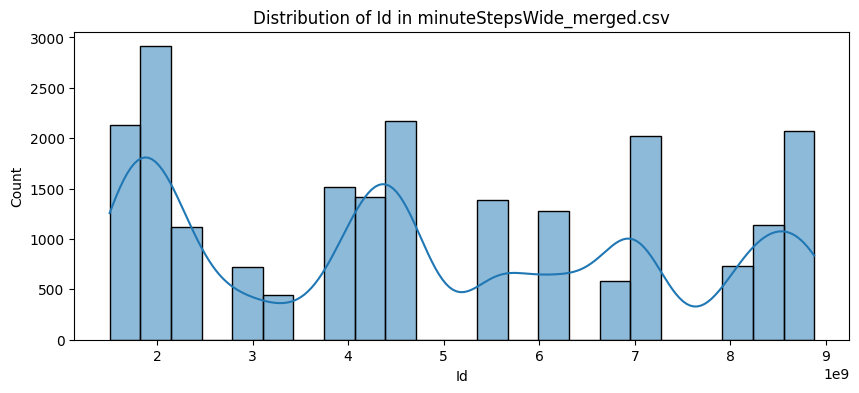

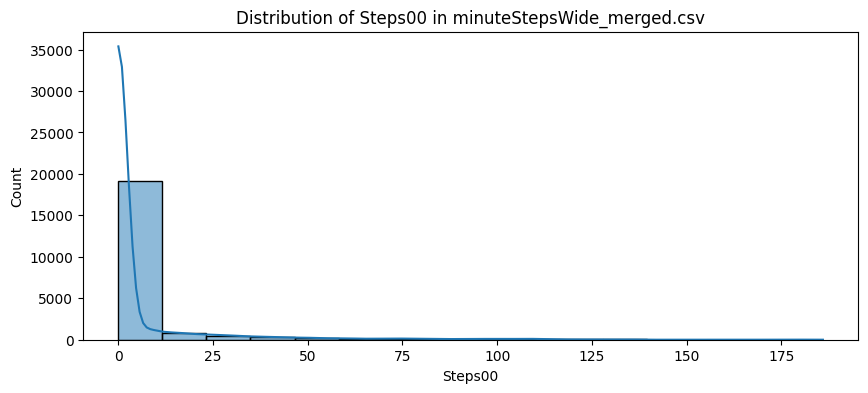

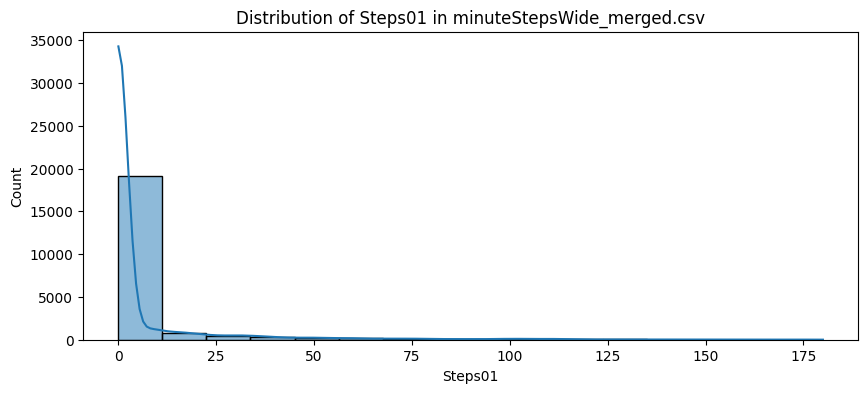

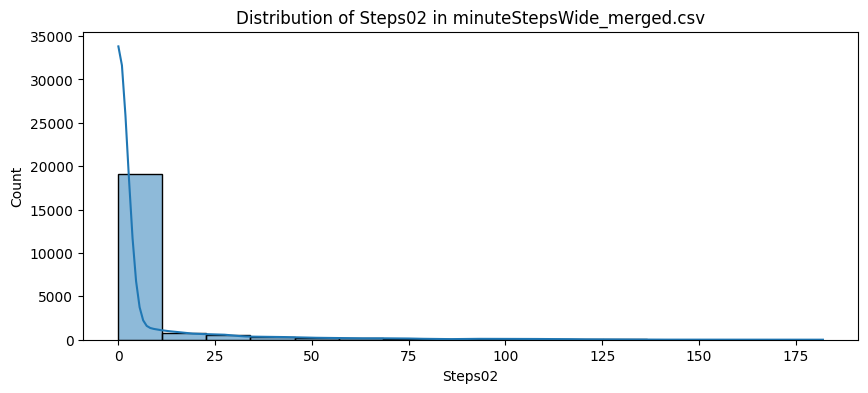

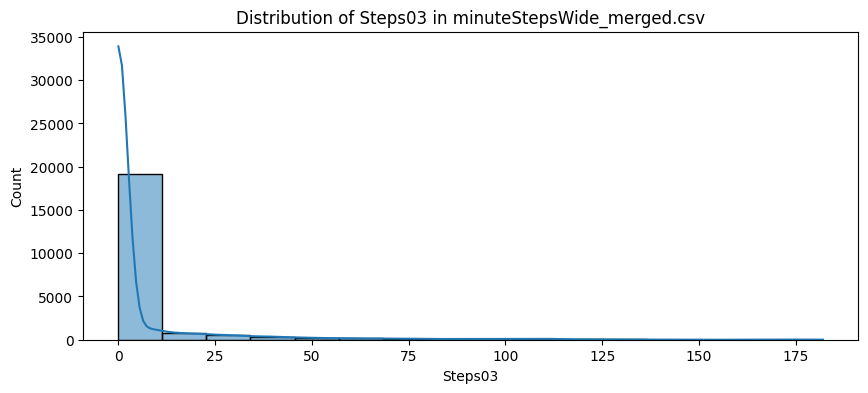

...

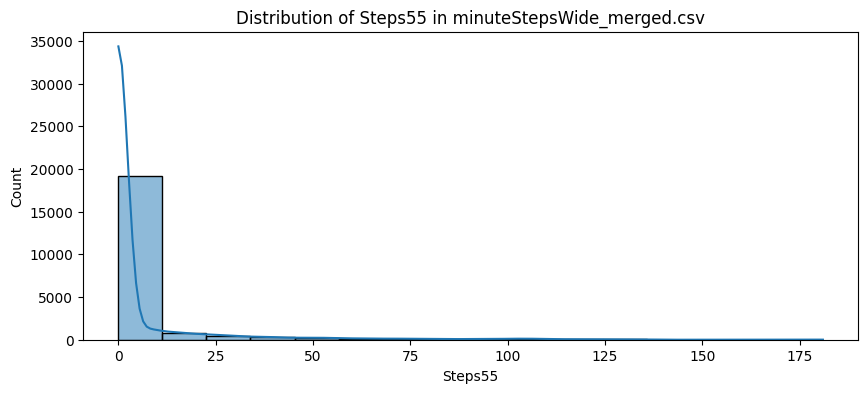

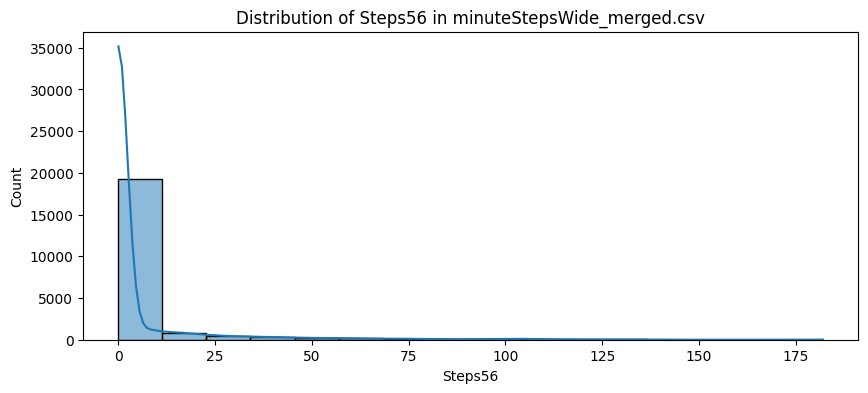

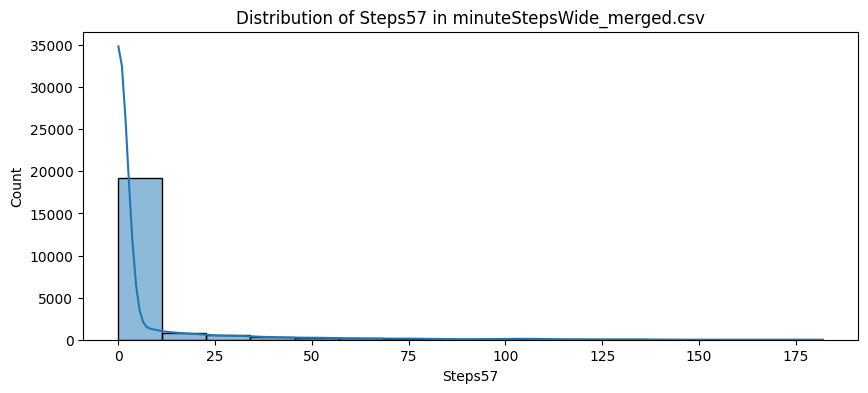

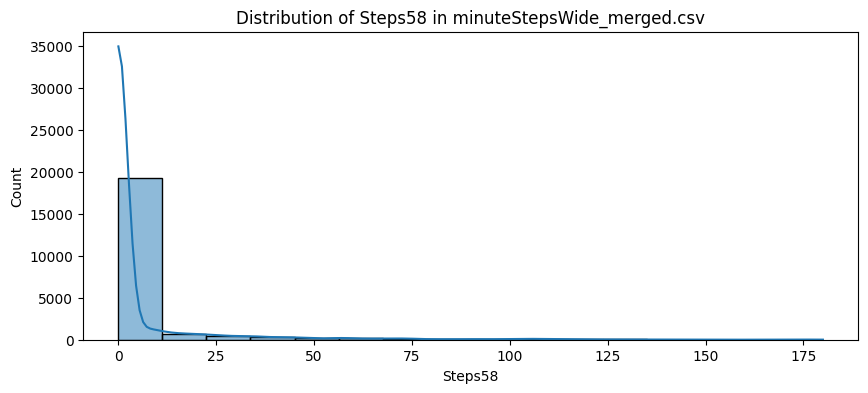

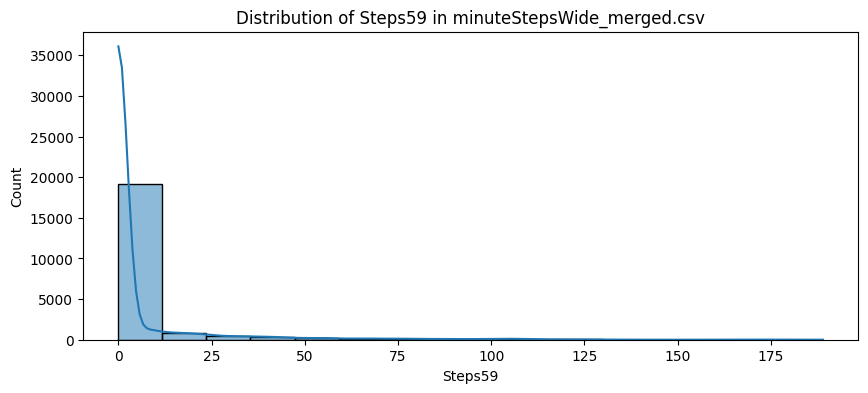

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

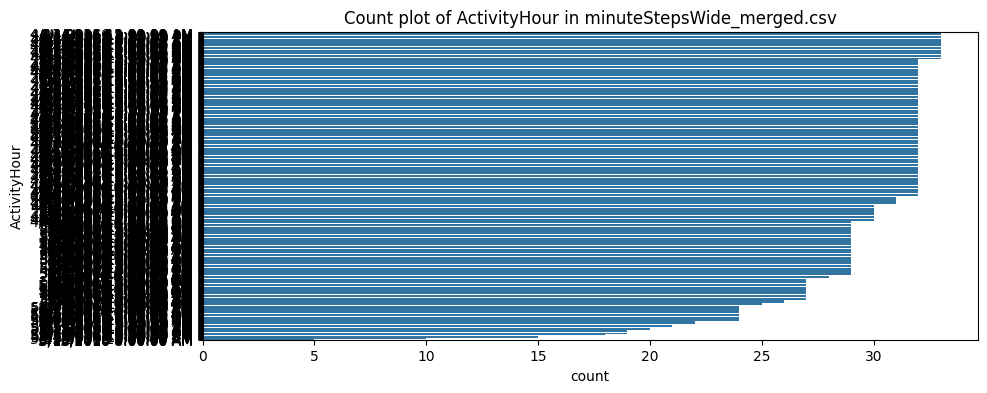

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

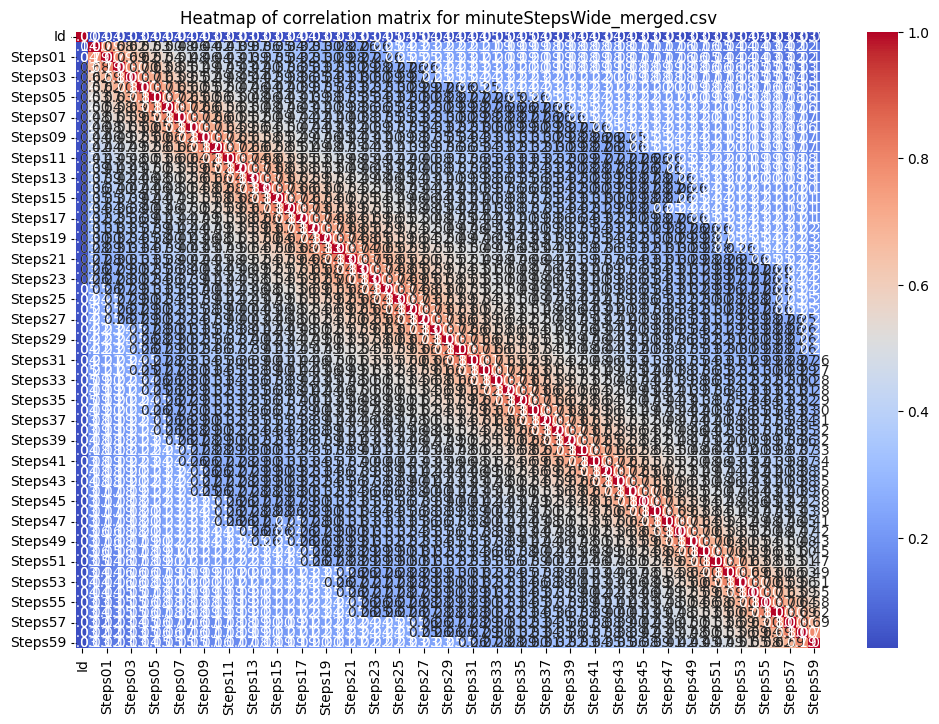

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

## sleepDay_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'sleepDay_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for sleepDay_merged.csv
----------------------------------------
First 5 rows:


,Id,SleepDay,TotalSleepRecords,TotalMinutesAsleep,TotalTimeInBed
0,1503960366,4/12/2016 12:00:00 AM,1,327,346
1,1503960366,4/13/2016 12:00:00 AM,2,384,407
2,1503960366,4/15/2016 12:00:00 AM,1,412,442
3,1503960366,4/16/2016 12:00:00 AM,2,340,367
4,1503960366,4/17/2016 12:00:00 AM,1,700,712


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,TotalSleepRecords,TotalMinutesAsleep,TotalTimeInBed
count,4.130000e+02,413.000000,413.000000,413.000000
mean,5.000979e+09,1.118644,419.467312,458.639225
std,2.060360e+09,0.345521,118.344679,127.101607
min,1.503960e+09,1.000000,58.000000,61.000000
25%,3.977334e+09,1.000000,361.000000,403.000000
50%,4.702922e+09,1.000000,433.000000,463.000000
75%,6.962181e+09,1.000000,490.000000,526.000000
max,8.792010e+09,3.000000,796.000000,961.000000


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
SleepDay,0
TotalSleepRecords,0
TotalMinutesAsleep,0
TotalTimeInBed,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
SleepDay,object
TotalSleepRecords,int64
TotalMinutesAsleep,int64
TotalTimeInBed,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 24 unique values
SleepDay: 31 unique values
TotalSleepRecords: 3 unique values
TotalMinutesAsleep: 256 unique values
TotalTimeInBed: 242 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,TotalSleepRecords,TotalMinutesAsleep,TotalTimeInBed
Id,1.000000,-0.012552,0.080117,0.002112
TotalSleepRecords,-0.012552,1.000000,0.165912,0.172917
TotalMinutesAsleep,0.080117,0.165912,1.000000,0.930457
TotalTimeInBed,0.002112,0.172917,0.930457,1.000000


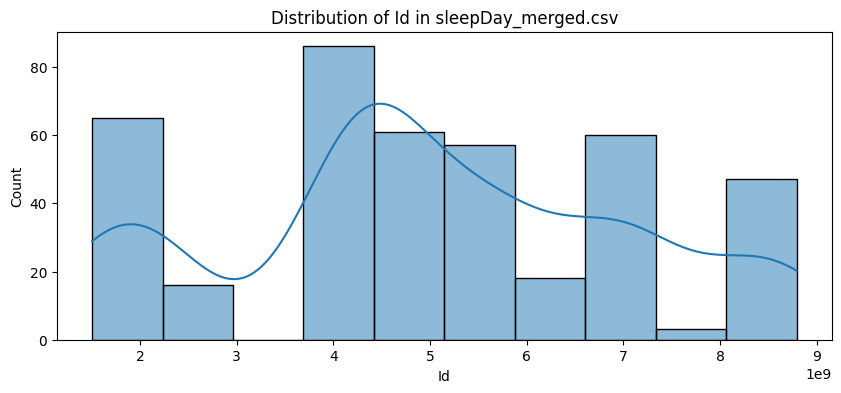

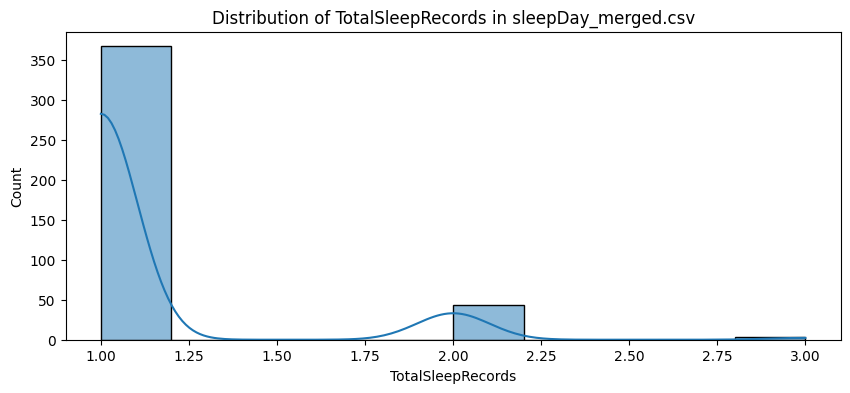

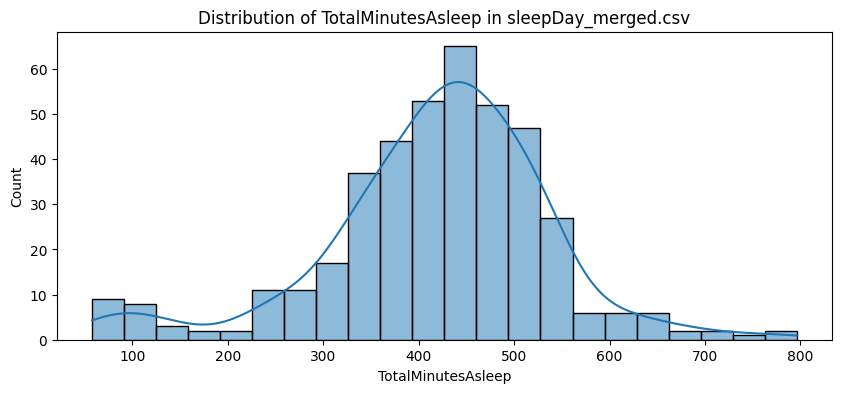

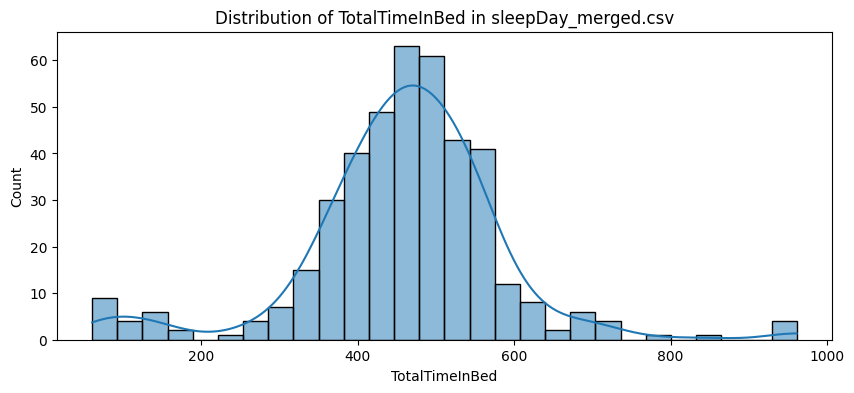

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

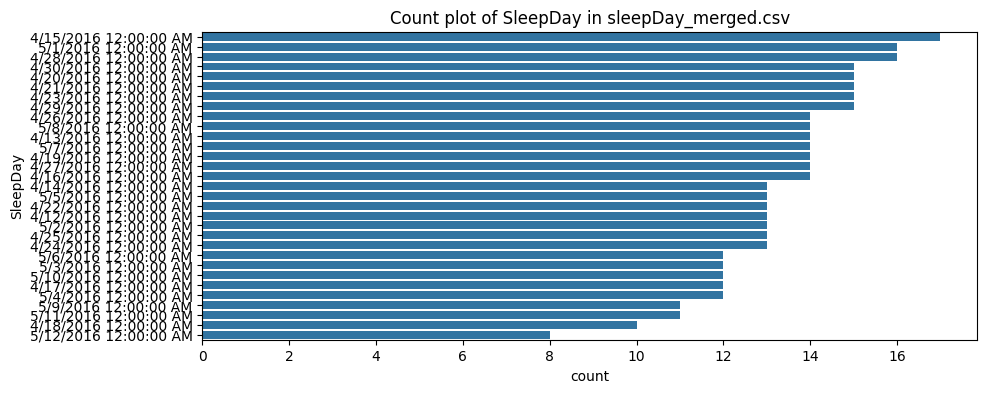

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

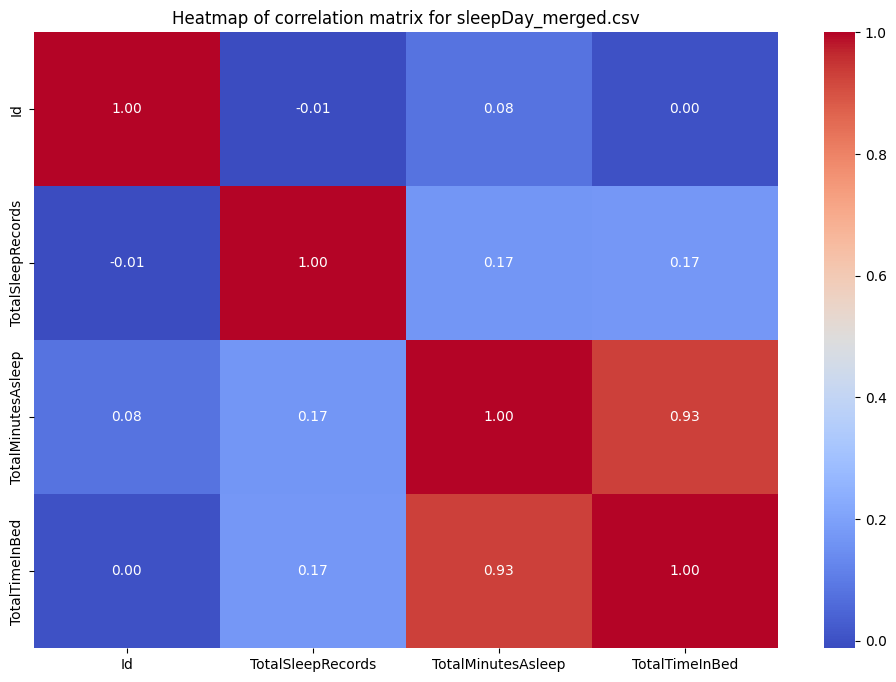

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

## weightLogInfo_merged.csv

In [ ]:
# Define the folder path and file name
folder_path = '/content/drive/MyDrive/Fithelth/Fitbit'
file_name = 'weightLogInfo_merged.csv'
file_path = os.path.join(folder_path, file_name)

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Perform EDA
print(f"\nEDA for {file_name}")
print("-" * 40)
print("First 5 rows:")
df.head()


EDA for weightLogInfo_merged.csv
----------------------------------------
First 5 rows:


,Id,Date,WeightKg,WeightPounds,Fat,BMI,IsManualReport,LogId
0,1503960366,5/2/2016 11:59:59 PM,52.599998,115.963147,22.0,22.650000,True,1462233599000
1,1503960366,5/3/2016 11:59:59 PM,52.599998,115.963147,NaN,22.650000,True,1462319999000
2,1927972279,4/13/2016 1:08:52 AM,133.500000,294.317120,NaN,47.540001,False,1460509732000
3,2873212765,4/21/2016 11:59:59 PM,56.700001,125.002104,NaN,21.450001,True,1461283199000
4,2873212765,5/12/2016 11:59:59 PM,57.299999,126.324875,NaN,21.690001,True,1463097599000


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,Id,WeightKg,WeightPounds,Fat,BMI,LogId
count,6.700000e+01,67.000000,67.000000,2.00000,67.000000,6.700000e+01
mean,7.009282e+09,72.035821,158.811801,23.50000,25.185224,1.461772e+12
std,1.950322e+09,13.923206,30.695415,2.12132,3.066963,7.829948e+08
min,1.503960e+09,52.599998,115.963147,22.00000,21.450001,1.460444e+12
25%,6.962181e+09,61.400002,135.363832,22.75000,23.959999,1.461079e+12
50%,6.962181e+09,62.500000,137.788914,23.50000,24.389999,1.461802e+12
75%,8.877689e+09,85.049999,187.503152,24.25000,25.559999,1.462375e+12
max,8.877689e+09,133.500000,294.317120,25.00000,47.540001,1.463098e+12


In [ ]:
print("\nMissing values:")
df.isnull().sum()



Missing values:


,0
Id,0
Date,0
WeightKg,0
WeightPounds,0
Fat,65
BMI,0
IsManualReport,0
LogId,0


In [ ]:
print("\nData types:")
df.dtypes


Data types:


,0
Id,int64
Date,object
WeightKg,float64
WeightPounds,float64
Fat,float64
BMI,float64
IsManualReport,bool
LogId,int64


In [ ]:
print("\nColumns with unique values count:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")


Columns with unique values count:
Id: 8 unique values
Date: 56 unique values
WeightKg: 34 unique values
WeightPounds: 34 unique values
Fat: 2 unique values
BMI: 36 unique values
IsManualReport: 2 unique values
LogId: 56 unique values


In [ ]:
# Exclude non-numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
print("\nCorrelation matrix:")
numeric_df.corr()


Correlation matrix:


,Id,WeightKg,WeightPounds,Fat,BMI,LogId
Id,1.000000,0.351346,0.351346,1.0,-0.206405,-0.060964
WeightKg,0.351346,1.000000,1.000000,1.0,0.735684,-0.225114
WeightPounds,0.351346,1.000000,1.000000,1.0,0.735684,-0.225114
Fat,1.000000,1.000000,1.000000,1.0,1.000000,-1.000000
BMI,-0.206405,0.735684,0.735684,1.0,1.000000,-0.235677
LogId,-0.060964,-0.225114,-0.225114,-1.0,-0.235677,1.000000


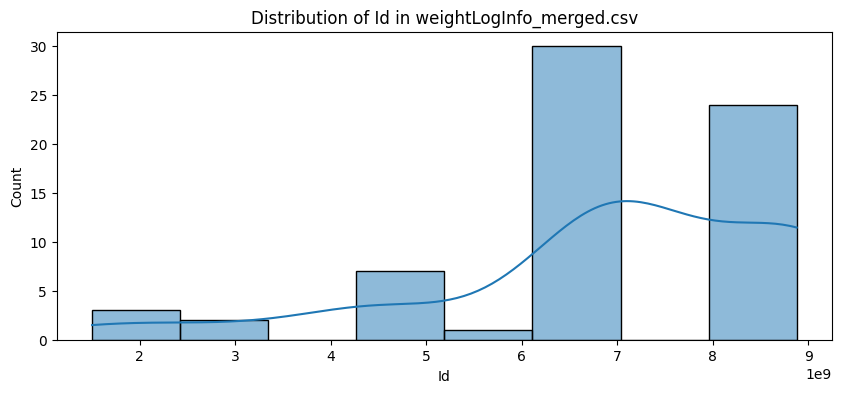

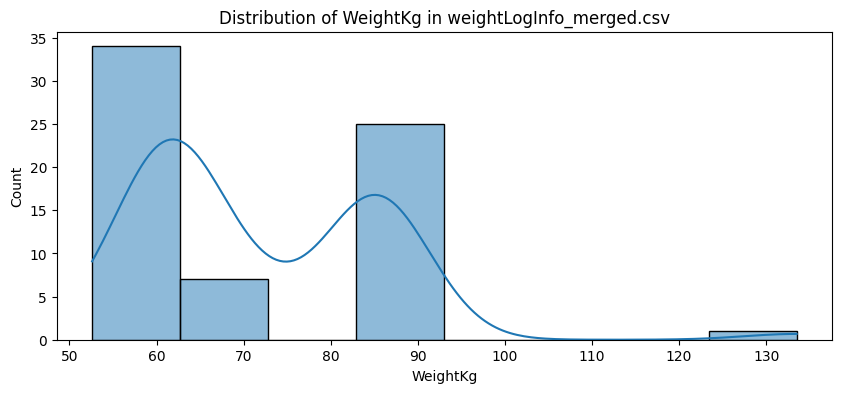

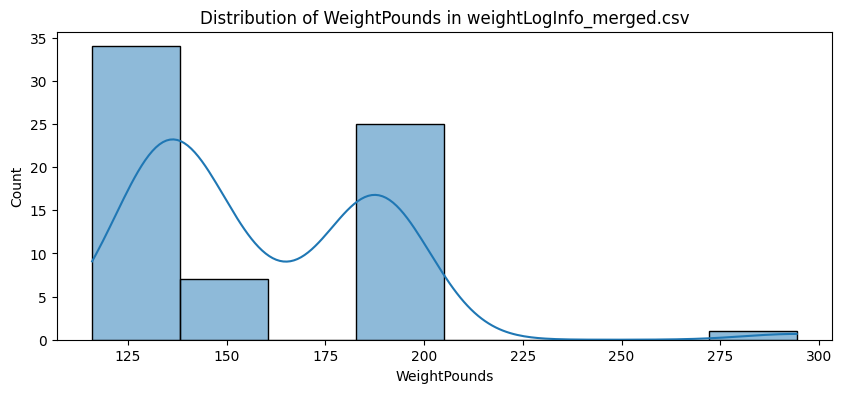

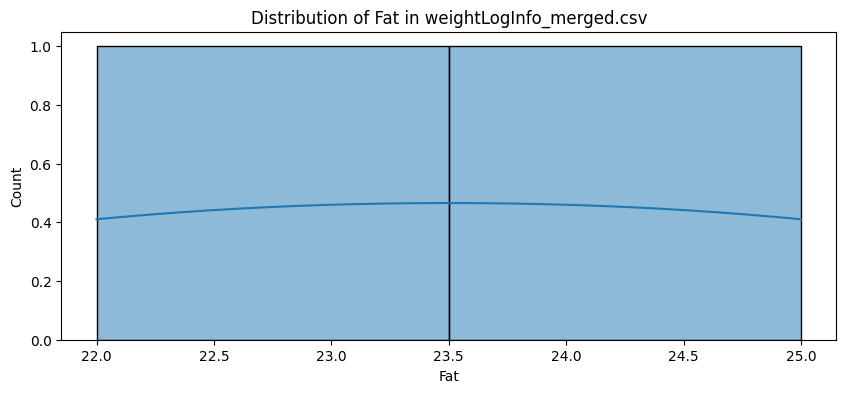

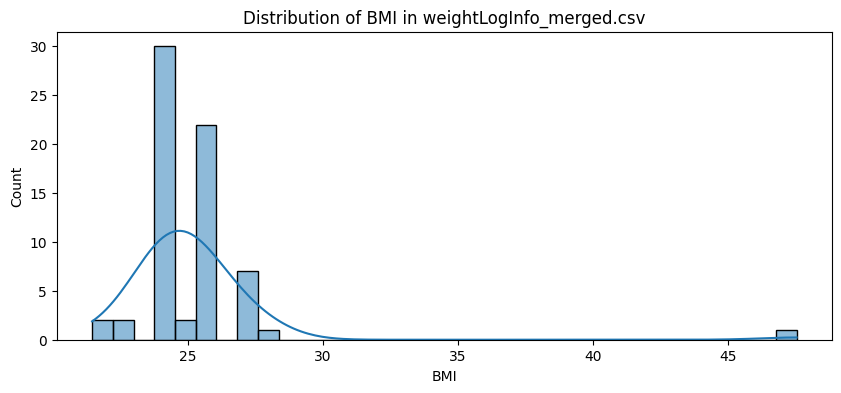

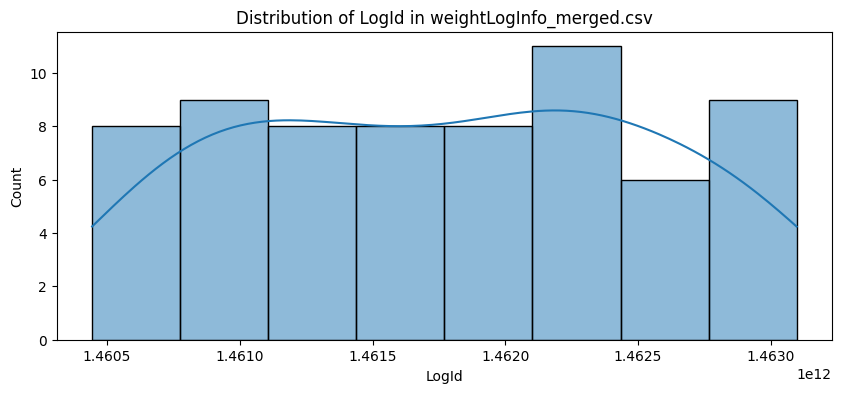

In [ ]:
# Visualize distributions of numerical columns
numerical_cols = numeric_df.columns
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col} in {file_name}")
    plt.show()

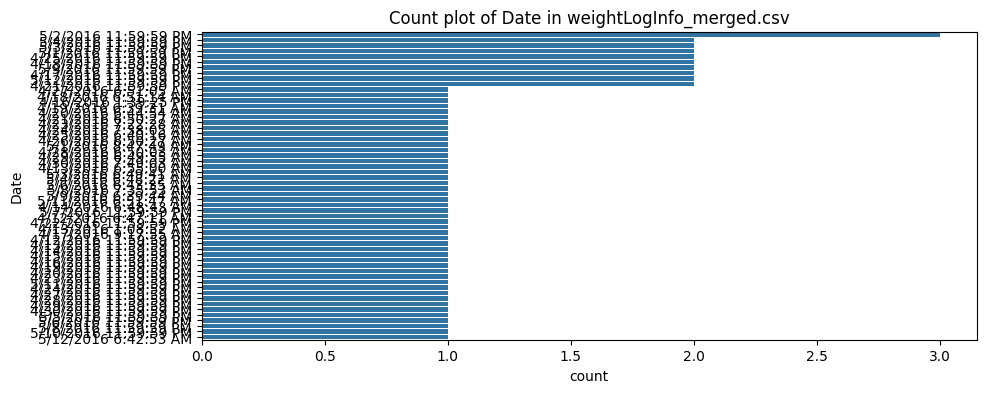

In [ ]:
# Visualize counts of categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index)
    plt.title(f"Count plot of {col} in {file_name}")
    plt.show()

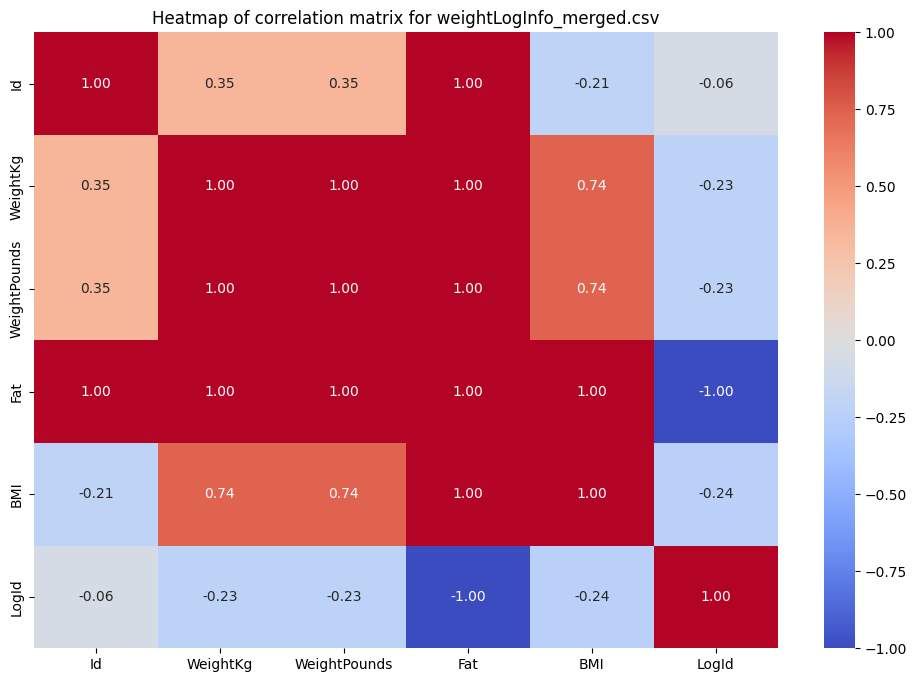

In [ ]:
# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Heatmap of correlation matrix for {file_name}')
plt.show()

#Futher

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# Load datasets
intensity_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/minuteIntensitiesNarrow_merged.csv')
steps_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/minuteStepsNarrow_merged.csv')

In [ ]:
# Convert ActivityMinute to datetime
intensity_df['ActivityMinute'] = pd.to_datetime(intensity_df['ActivityMinute'])
steps_df['ActivityMinute'] = pd.to_datetime(steps_df['ActivityMinute'])

<ipython-input-185-96361ee39497>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  intensity_df['ActivityMinute'] = pd.to_datetime(intensity_df['ActivityMinute'])
<ipython-input-185-96361ee39497>:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  steps_df['ActivityMinute'] = pd.to_datetime(steps_df['ActivityMinute'])


In [ ]:
# Merge datasets on Id and ActivityMinute
merged_df = pd.merge(intensity_df, steps_df, on=['Id', 'ActivityMinute'], how='inner')

In [ ]:
# Display merged data
print(merged_df.head())

           Id      ActivityMinute  Intensity  Steps
0  1503960366 2016-04-12 00:00:00          0      0
1  1503960366 2016-04-12 00:01:00          0      0
2  1503960366 2016-04-12 00:02:00          0      0
3  1503960366 2016-04-12 00:03:00          0      0
4  1503960366 2016-04-12 00:04:00          0      0


In [ ]:
# Calculate correlation matrix
correlation_matrix = merged_df[['Intensity', 'Steps']].corr()
print("\nCorrelation matrix:")
print(correlation_matrix)


Correlation matrix:
           Intensity     Steps
Intensity   1.000000  0.809397
Steps       0.809397  1.000000


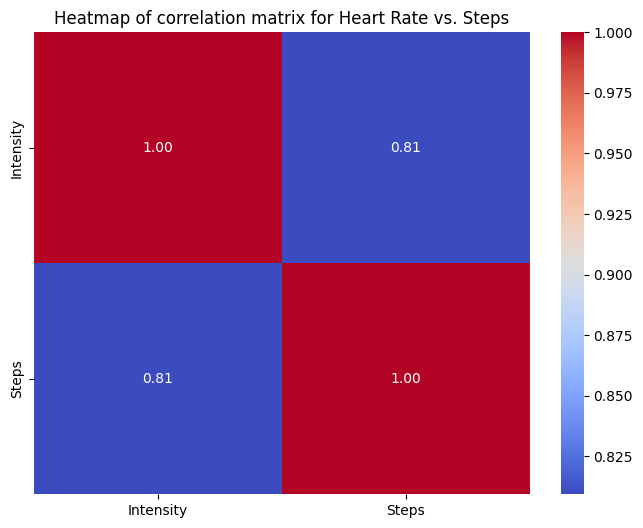

In [ ]:
# Plotting the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of correlation matrix for Heart Rate vs. Steps')
plt.show()


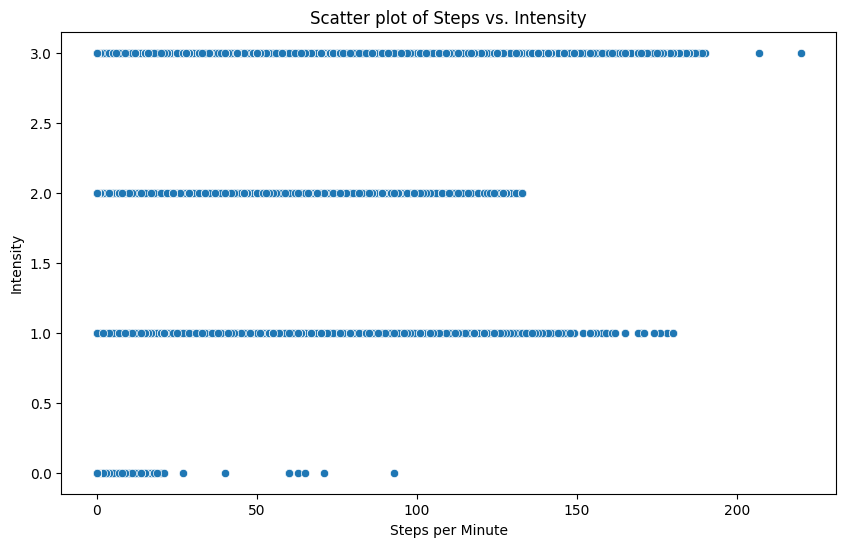

In [ ]:

# Scatter plot to visualize relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_df, x='Steps', y='Intensity')
plt.title('Scatter plot of Steps vs. Intensity')
plt.xlabel('Steps per Minute')
plt.ylabel('Intensity')
plt.show()

In [ ]:
# Load datasets
intensity_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/minuteIntensitiesNarrow_merged.csv')
calories_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/minuteCaloriesNarrow_merged.csv')

In [ ]:
# Convert ActivityMinute to datetime
intensity_df['ActivityMinute'] = pd.to_datetime(intensity_df['ActivityMinute'])
calories_df['ActivityMinute'] = pd.to_datetime(calories_df['ActivityMinute'])

<ipython-input-192-83705b3e281f>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  intensity_df['ActivityMinute'] = pd.to_datetime(intensity_df['ActivityMinute'])
<ipython-input-192-83705b3e281f>:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  calories_df['ActivityMinute'] = pd.to_datetime(calories_df['ActivityMinute'])


In [ ]:

# Merge datasets on Id and ActivityMinute
merged_df = pd.merge(intensity_df, calories_df, on=['Id', 'ActivityMinute'], how='inner')

# Display merged data
print(merged_df.head())

           Id      ActivityMinute  Intensity  Calories
0  1503960366 2016-04-12 00:00:00          0    0.7865
1  1503960366 2016-04-12 00:01:00          0    0.7865
2  1503960366 2016-04-12 00:02:00          0    0.7865
3  1503960366 2016-04-12 00:03:00          0    0.7865
4  1503960366 2016-04-12 00:04:00          0    0.7865


In [ ]:
# Calculate correlation matrix
correlation_matrix = merged_df[['Intensity', 'Calories']].corr()
print("\nCorrelation matrix:")
print(correlation_matrix)


Correlation matrix:
           Intensity  Calories
Intensity   1.000000  0.890341
Calories    0.890341  1.000000


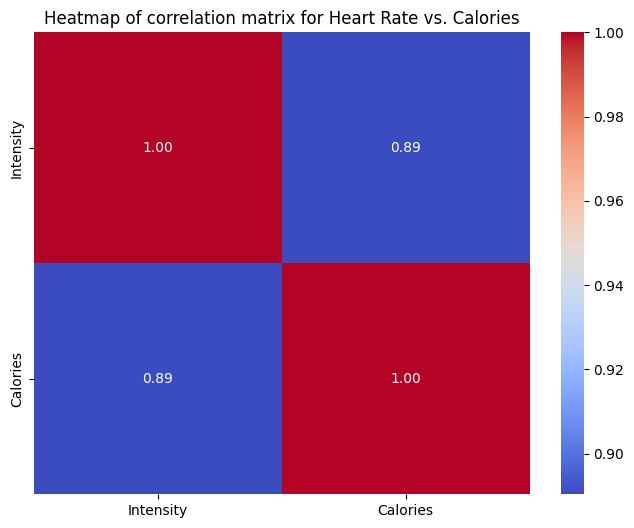

In [ ]:
# Plotting the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of correlation matrix for Heart Rate vs. Calories')
plt.show()

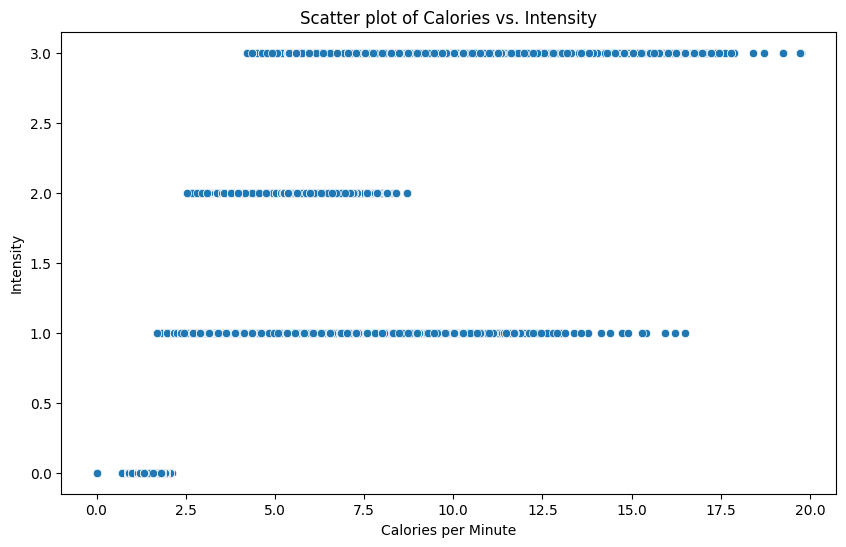

In [ ]:
# Scatter plot to visualize relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_df, x='Calories', y='Intensity')
plt.title('Scatter plot of Calories vs. Intensity')
plt.xlabel('Calories per Minute')
plt.ylabel('Intensity')
plt.show()

In [ ]:
# Load datasets
heartrate_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/heartrate_seconds_merged.csv')
daily_steps_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/dailySteps_merged.csv')

In [ ]:

# Convert Time column to datetime in heartrate_df and ActivityDay column in daily_steps_df
heartrate_df['Time'] = pd.to_datetime(heartrate_df['Time'])
daily_steps_df['ActivityDay'] = pd.to_datetime(daily_steps_df['ActivityDay'])

In [ ]:
# Extract the date part from Time for merging
heartrate_df['Date'] = heartrate_df['Time'].dt.date
daily_steps_df['Date'] = daily_steps_df['ActivityDay'].dt.date

In [ ]:
# Group heartrate_df by Date and Id to get average heart rate per day
daily_heartrate_df = heartrate_df.groupby(['Id', 'Date']).mean().reset_index()

In [ ]:

# Merge datasets on Id and Date
merged_df = pd.merge(daily_heartrate_df, daily_steps_df, on=['Id', 'Date'], how='inner')


In [ ]:
# Display merged data
print(merged_df.head())

           Id        Date                          Time      Value  \
0  2022484408  2016-04-12 2016-04-12 13:31:35.415632640  75.804177   
1  2022484408  2016-04-13 2016-04-13 13:28:56.803263488  80.337584   
2  2022484408  2016-04-14 2016-04-14 14:17:42.081834752  72.628597   
3  2022484408  2016-04-15 2016-04-15 13:39:00.708223488  80.437382   
4  2022484408  2016-04-16 2016-04-16 12:09:23.916640000  75.960547   

  ActivityDay  StepTotal  
0  2016-04-12      11875  
1  2016-04-13      12024  
2  2016-04-14      10690  
3  2016-04-15      11034  
4  2016-04-16      10100  


In [ ]:
# Calculate correlation matrix
correlation_matrix = merged_df[['Value', 'StepTotal']].corr()
print("\nCorrelation matrix:")
print(correlation_matrix)



Correlation matrix:
              Value  StepTotal
Value      1.000000   0.168822
StepTotal  0.168822   1.000000


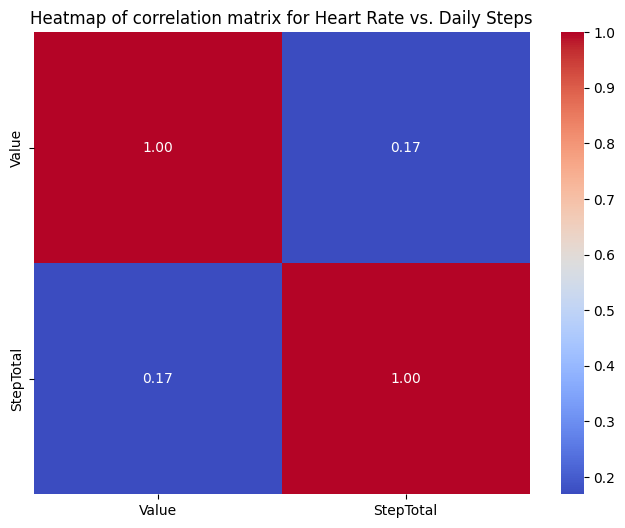

In [ ]:
# Plotting the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of correlation matrix for Heart Rate vs. Daily Steps')
plt.show()


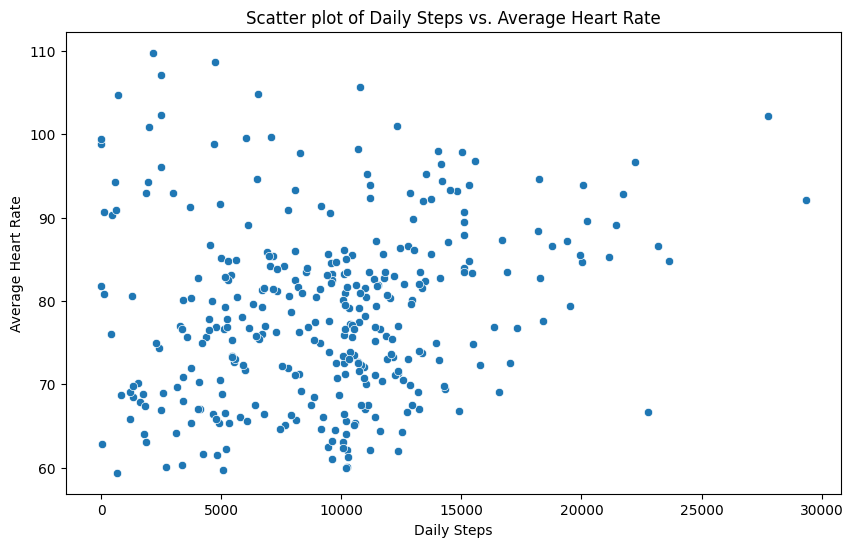

In [ ]:
# Scatter plot to visualize relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_df, x='StepTotal', y='Value')
plt.title('Scatter plot of Daily Steps vs. Average Heart Rate')
plt.xlabel('Daily Steps')
plt.ylabel('Average Heart Rate')
plt.show()

###Identifying Outliers

In [ ]:
# Determine thresholds for abnormal heart rate and steps
q1_heart_rate = merged_df['Value'].quantile(0.25)
q3_heart_rate = merged_df['Value'].quantile(0.75)
iqr_heart_rate = q3_heart_rate - q1_heart_rate
lower_bound_heart_rate = q1_heart_rate - 1.5 * iqr_heart_rate
upper_bound_heart_rate = q3_heart_rate + 1.5 * iqr_heart_rate

In [ ]:
q1_steps = merged_df['StepTotal'].quantile(0.25)
q3_steps = merged_df['StepTotal'].quantile(0.75)
iqr_steps = q3_steps - q1_steps
lower_bound_steps = q1_steps - 1.5 * iqr_steps
upper_bound_steps = q3_steps + 1.5 * iqr_steps


In [ ]:
# Identify outliers
outliers_heart_rate = merged_df[(merged_df['Value'] < lower_bound_heart_rate) | (merged_df['Value'] > upper_bound_heart_rate)]
outliers_steps = merged_df[(merged_df['StepTotal'] < lower_bound_steps) | (merged_df['StepTotal'] > upper_bound_steps)]


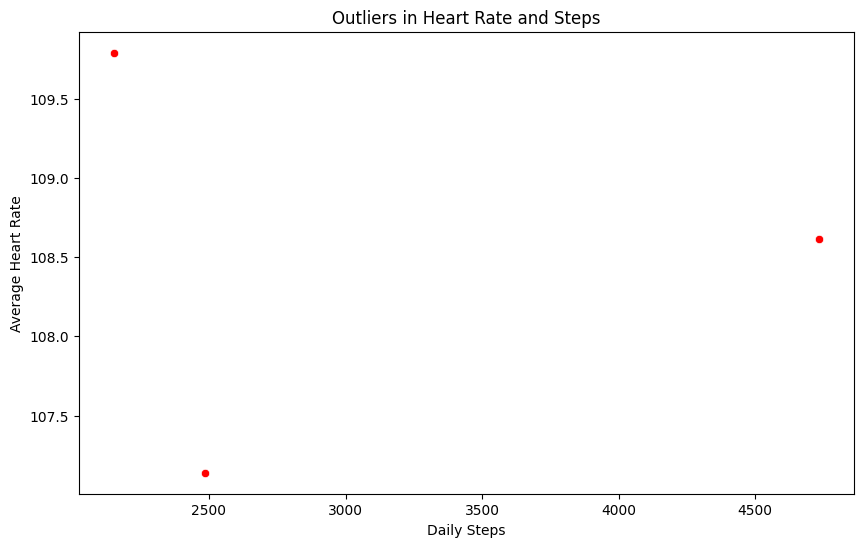

In [ ]:
# Plot the outliers
plt.figure(figsize=(10, 6))
sns.scatterplot(data=outliers_heart_rate, x='StepTotal', y='Value', color='red')
plt.title('Outliers in Heart Rate and Steps')
plt.xlabel('Daily Steps')
plt.ylabel('Average Heart Rate')
plt.show()

###Time-Series Analysis

In [ ]:
# Convert Date to datetime format for time-series analysis
merged_df['Date'] = pd.to_datetime(merged_df['Date'])

In [ ]:

# Calculate rolling averages
merged_df['Rolling_Avg_HeartRate'] = merged_df['Value'].rolling(window=7).mean()
merged_df['Rolling_Avg_Steps'] = merged_df['StepTotal'].rolling(window=7).mean()

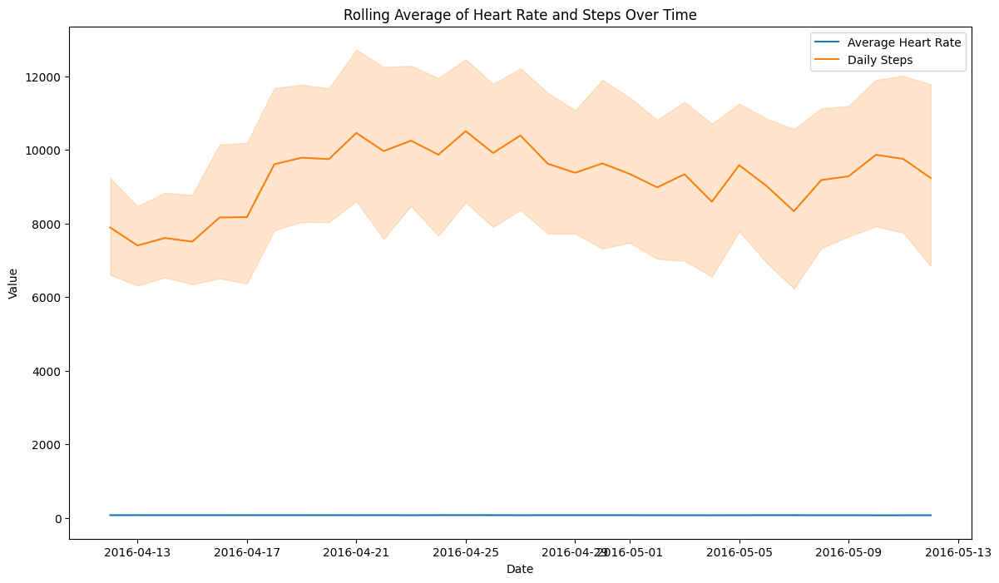

In [ ]:
# Plot the rolling averages
plt.figure(figsize=(14, 8))
sns.lineplot(data=merged_df, x='Date', y='Rolling_Avg_HeartRate', label='Average Heart Rate')
sns.lineplot(data=merged_df, x='Date', y='Rolling_Avg_Steps', label='Daily Steps')
plt.title('Rolling Average of Heart Rate and Steps Over Time')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

###Categorical Analysis

In [ ]:
# Extract day of the week from Date
merged_df['DayOfWeek'] = merged_df['Date'].dt.day_name()

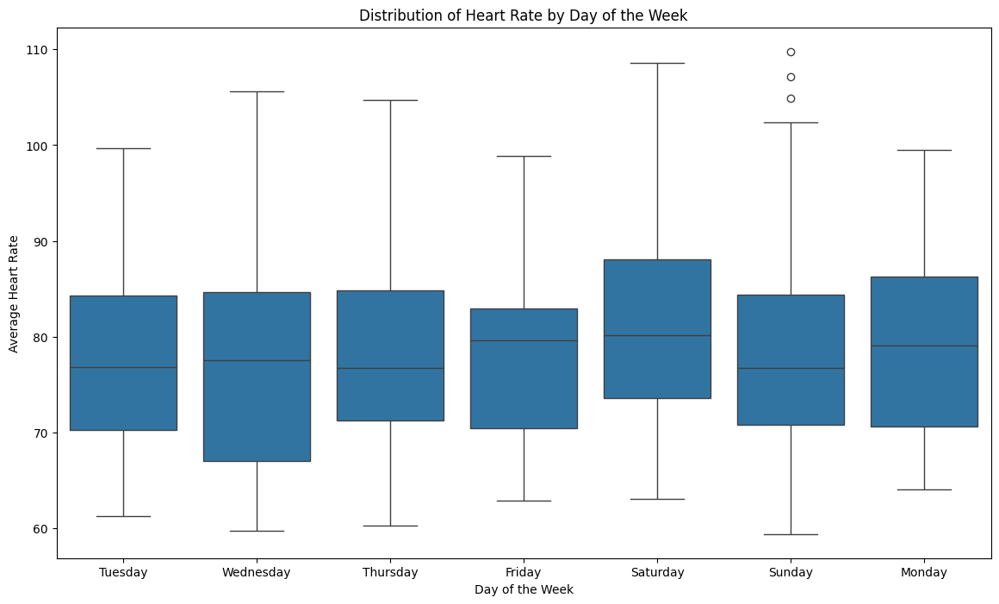

In [ ]:

# Plot boxplots for heart rate and steps by day of the week
plt.figure(figsize=(14, 8))
sns.boxplot(data=merged_df, x='DayOfWeek', y='Value')
plt.title('Distribution of Heart Rate by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Heart Rate')
plt.show()

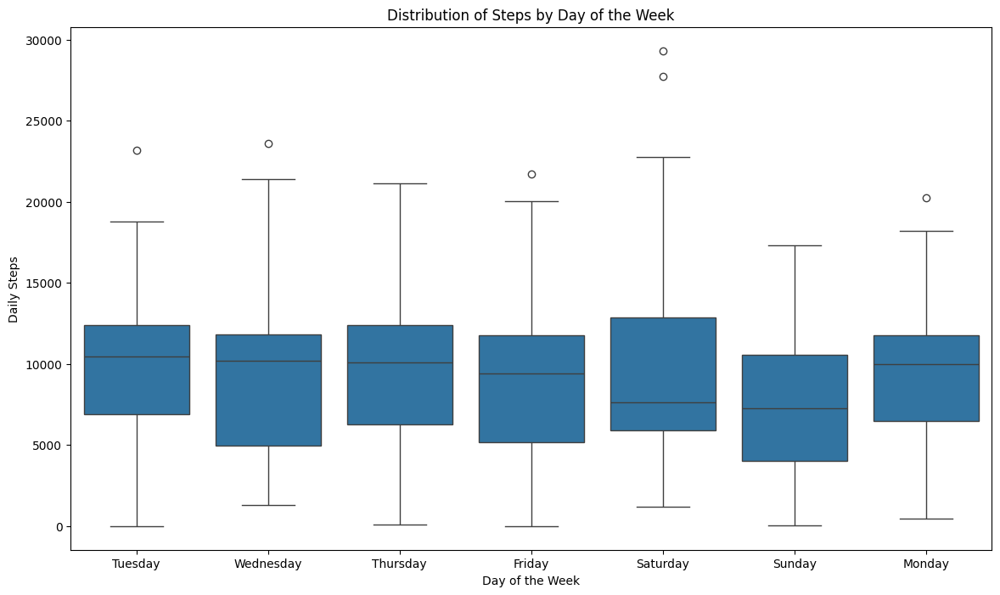

In [ ]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=merged_df, x='DayOfWeek', y='StepTotal')
plt.title('Distribution of Steps by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Daily Steps')
plt.show()

###Combining with Other Datasets

In [ ]:
# Load the sleep dataset
sleep_data_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/sleepDay_merged.csv')

# Convert SleepDay to datetime format and extract the date part for merging
sleep_data_df['SleepDay'] = pd.to_datetime(sleep_data_df['SleepDay'])
sleep_data_df['Date'] = sleep_data_df['SleepDay'].dt.date


<ipython-input-216-10b012534259>:5: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  sleep_data_df['SleepDay'] = pd.to_datetime(sleep_data_df['SleepDay'])


In [ ]:
# Convert Date columns to datetime64[ns] format in both dataframes
merged_df['Date'] = pd.to_datetime(merged_df['Date'])
sleep_data_df['Date'] = pd.to_datetime(sleep_data_df['Date'])


In [ ]:
# Merge the datasets on Id and Date
merged_with_sleep_df = pd.merge(merged_df, sleep_data_df, on=['Id', 'Date'], how='inner')


In [ ]:
# Display the merged data
print(merged_with_sleep_df.head())


           Id       Date                          Time      Value ActivityDay  \
0  2026352035 2016-04-17 2016-04-17 05:50:57.734375168  68.656250  2016-04-17   
1  2026352035 2016-04-25 2016-04-25 10:22:56.501937920  99.505814  2016-04-25   
2  2026352035 2016-05-02 2016-05-02 19:21:41.948955904  84.134571  2016-05-02   
3  2026352035 2016-05-09 2016-05-09 17:50:01.928201216  98.233901  2016-05-09   
4  2347167796 2016-04-13 2016-04-13 12:24:47.282045696  73.812905  2016-04-13   

   StepTotal  Rolling_Avg_HeartRate  Rolling_Avg_Steps  DayOfWeek   SleepDay  \
0        838              79.245546        8486.285714     Sunday 2016-04-17   
1       6017              82.593779        8387.571429     Monday 2016-04-25   
2       7018              83.618900        8919.857143     Monday 2016-05-02   
3      10685              86.007389        8535.000000     Monday 2016-05-09   
4      10352              84.548491        7734.285714  Wednesday 2016-04-13   

   TotalSleepRecords  TotalMinut

In [ ]:
# Calculate correlation matrix for the combined data
combined_correlation_matrix = merged_with_sleep_df[['Value', 'StepTotal', 'TotalMinutesAsleep']].corr()
print("\nCombined Correlation matrix:")
print(combined_correlation_matrix)



Combined Correlation matrix:
                       Value  StepTotal  TotalMinutesAsleep
Value               1.000000   0.151018           -0.253834
StepTotal           0.151018   1.000000           -0.081816
TotalMinutesAsleep -0.253834  -0.081816            1.000000


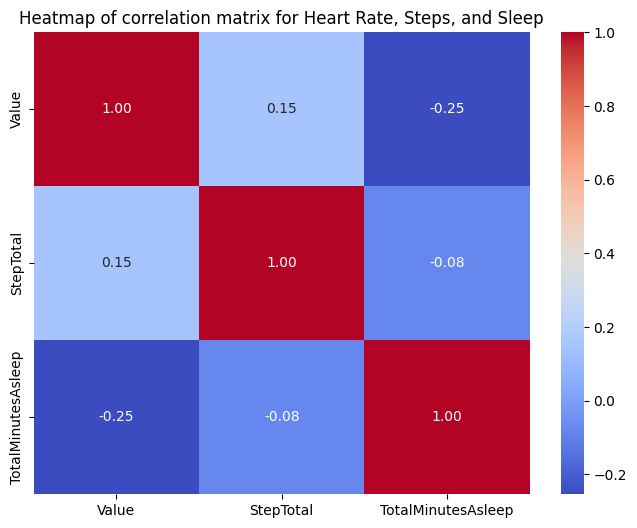

In [ ]:
# Plotting the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(combined_correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of correlation matrix for Heart Rate, Steps, and Sleep')
plt.show()

In [ ]:
# Determine thresholds for abnormal heart rate, steps, and sleep
q1_heart_rate = merged_with_sleep_df['Value'].quantile(0.25)
q3_heart_rate = merged_with_sleep_df['Value'].quantile(0.75)
iqr_heart_rate = q3_heart_rate - q1_heart_rate
lower_bound_heart_rate = q1_heart_rate - 1.5 * iqr_heart_rate
upper_bound_heart_rate = q3_heart_rate + 1.5 * iqr_heart_rate


In [ ]:
q1_steps = merged_with_sleep_df['StepTotal'].quantile(0.25)
q3_steps = merged_with_sleep_df['StepTotal'].quantile(0.75)
iqr_steps = q3_steps - q1_steps
lower_bound_steps = q1_steps - 1.5 * iqr_steps
upper_bound_steps = q3_steps + 1.5 * iqr_steps

In [ ]:
q1_sleep = merged_with_sleep_df['TotalMinutesAsleep'].quantile(0.25)
q3_sleep = merged_with_sleep_df['TotalMinutesAsleep'].quantile(0.75)
iqr_sleep = q3_sleep - q1_sleep
lower_bound_sleep = q1_sleep - 1.5 * iqr_sleep
upper_bound_sleep = q3_sleep + 1.5 * iqr_sleep

In [ ]:

# Identify outliers
outliers_combined = merged_with_sleep_df[
    (merged_with_sleep_df['Value'] < lower_bound_heart_rate) | (merged_with_sleep_df['Value'] > upper_bound_heart_rate) |
    (merged_with_sleep_df['StepTotal'] < lower_bound_steps) | (merged_with_sleep_df['StepTotal'] > upper_bound_steps) |
    (merged_with_sleep_df['TotalMinutesAsleep'] < lower_bound_sleep) | (merged_with_sleep_df['TotalMinutesAsleep'] > upper_bound_sleep)
]

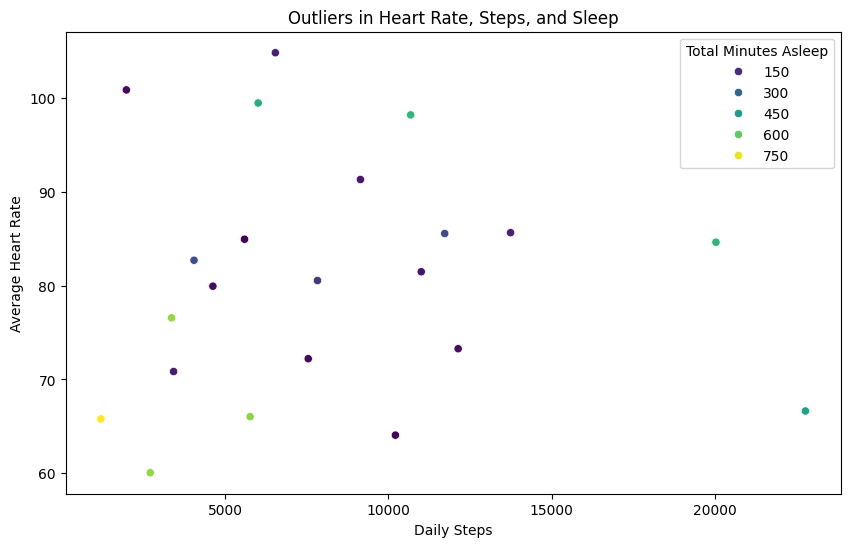

In [ ]:
# Plot the outliers
plt.figure(figsize=(10, 6))
sns.scatterplot(data=outliers_combined, x='StepTotal', y='Value', hue='TotalMinutesAsleep', palette='viridis')
plt.title('Outliers in Heart Rate, Steps, and Sleep')
plt.xlabel('Daily Steps')
plt.ylabel('Average Heart Rate')
plt.legend(title='Total Minutes Asleep')
plt.show()

In [ ]:
# Calculate rolling averages for the combined data
merged_with_sleep_df['Rolling_Avg_HeartRate'] = merged_with_sleep_df['Value'].rolling(window=7).mean()
merged_with_sleep_df['Rolling_Avg_Steps'] = merged_with_sleep_df['StepTotal'].rolling(window=7).mean()
merged_with_sleep_df['Rolling_Avg_Sleep'] = merged_with_sleep_df['TotalMinutesAsleep'].rolling(window=7).mean()


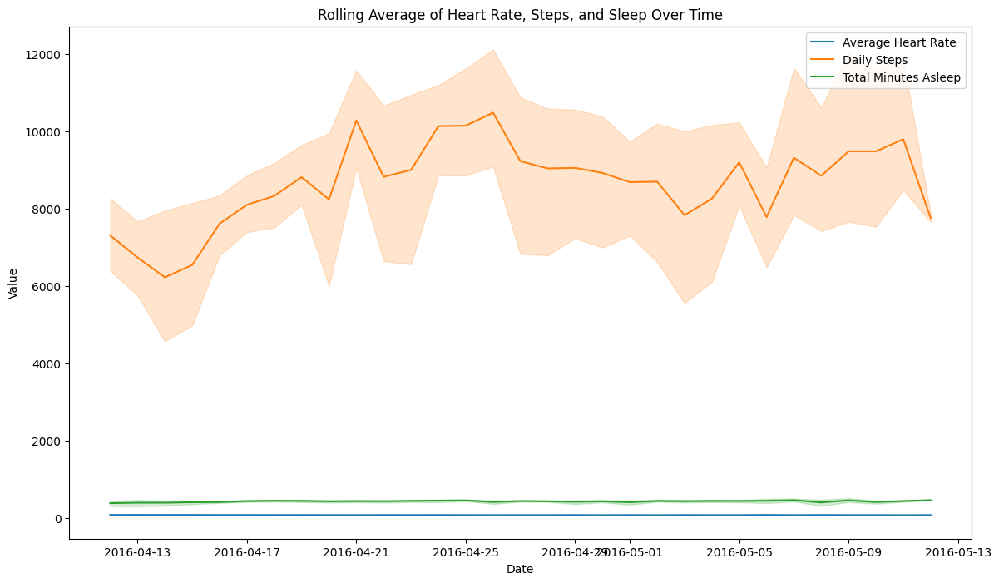

In [ ]:
# Plot the rolling averages
plt.figure(figsize=(14, 8))
sns.lineplot(data=merged_with_sleep_df, x='Date', y='Rolling_Avg_HeartRate', label='Average Heart Rate')
sns.lineplot(data=merged_with_sleep_df, x='Date', y='Rolling_Avg_Steps', label='Daily Steps')
sns.lineplot(data=merged_with_sleep_df, x='Date', y='Rolling_Avg_Sleep', label='Total Minutes Asleep')
plt.title('Rolling Average of Heart Rate, Steps, and Sleep Over Time')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [ ]:

# Extract day of the week from Date
merged_with_sleep_df['DayOfWeek'] = merged_with_sleep_df['Date'].dt.day_name()


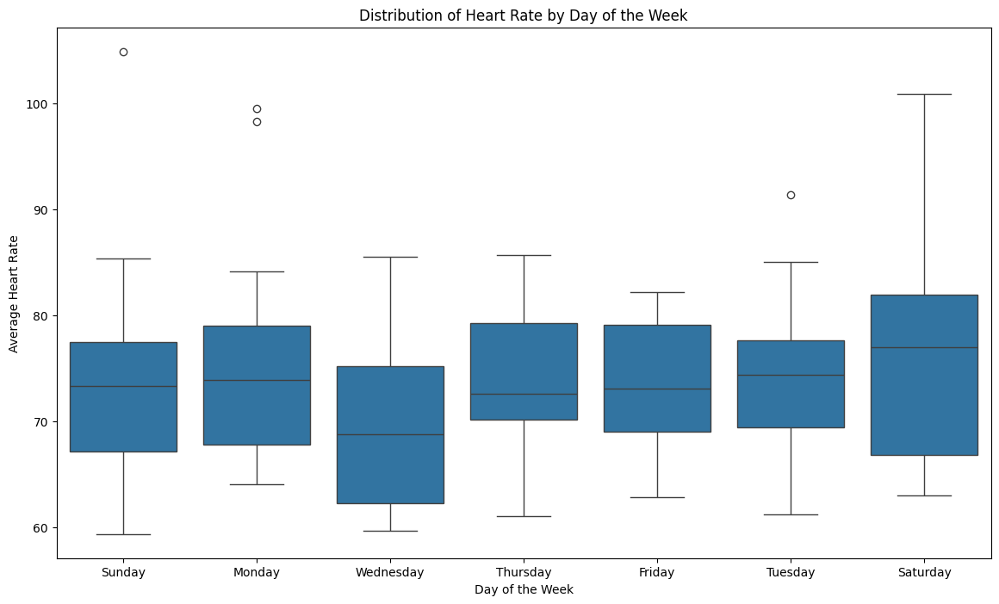

In [ ]:
# Plot boxplots for heart rate, steps, and sleep by day of the week
plt.figure(figsize=(14, 8))
sns.boxplot(data=merged_with_sleep_df, x='DayOfWeek', y='Value')
plt.title('Distribution of Heart Rate by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Heart Rate')
plt.show()

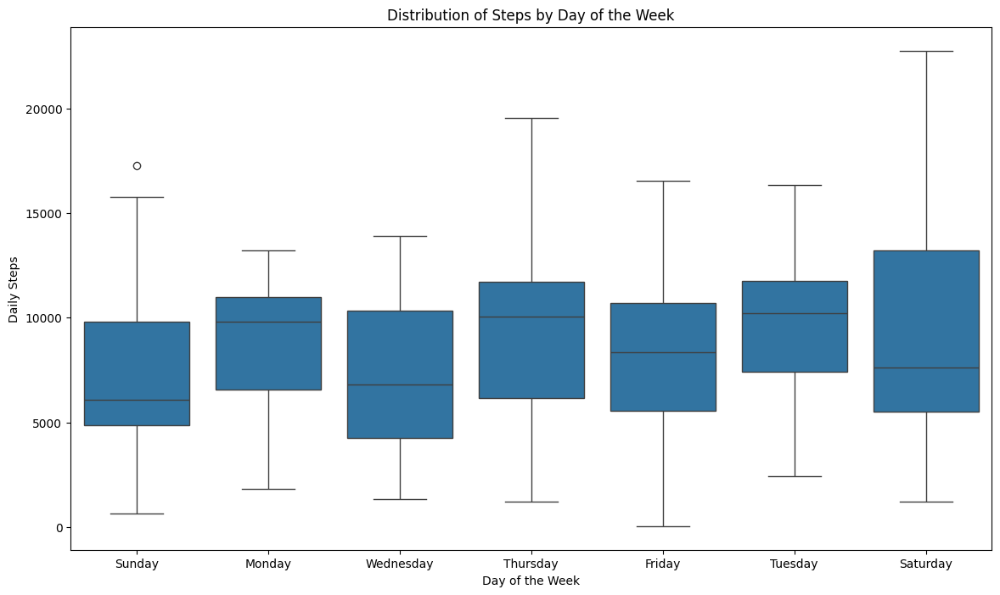

In [ ]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=merged_with_sleep_df, x='DayOfWeek', y='StepTotal')
plt.title('Distribution of Steps by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Daily Steps')
plt.show()

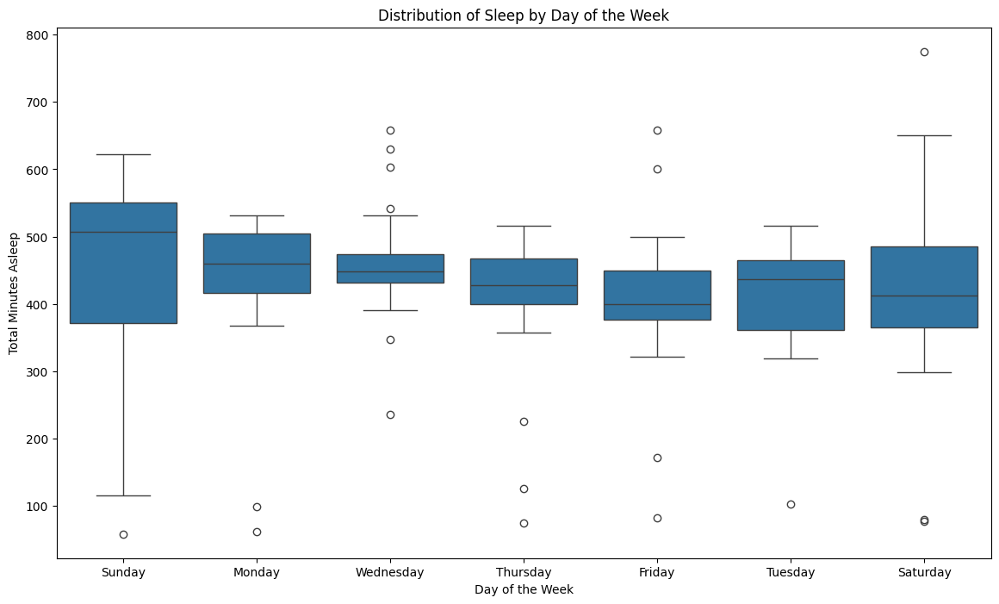

In [ ]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=merged_with_sleep_df, x='DayOfWeek', y='TotalMinutesAsleep')
plt.title('Distribution of Sleep by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Total Minutes Asleep')
plt.show()

In [ ]:

# Load datasets
heartrate_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/heartrate_seconds_merged.csv')
daily_steps_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/dailySteps_merged.csv')
sleep_data_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/sleepDay_merged.csv')

In [ ]:
# Convert Time column to datetime in heartrate_df and ActivityDay column in daily_steps_df
heartrate_df['Time'] = pd.to_datetime(heartrate_df['Time'])
daily_steps_df['ActivityDay'] = pd.to_datetime(daily_steps_df['ActivityDay'])
sleep_data_df['SleepDay'] = pd.to_datetime(sleep_data_df['SleepDay'])

# Extract the date part for merging
heartrate_df['Date'] = heartrate_df['Time'].dt.date
daily_steps_df['Date'] = daily_steps_df['ActivityDay'].dt.date
sleep_data_df['Date'] = sleep_data_df['SleepDay'].dt.date

# Group heartrate_df by Date and Id to get average heart rate per day
daily_heartrate_df = heartrate_df.groupby(['Id', 'Date']).mean().reset_index()

# Merge datasets on Id and Date
merged_df = pd.merge(daily_heartrate_df, daily_steps_df, on=['Id', 'Date'], how='inner')
merged_with_sleep_df = pd.merge(merged_df, sleep_data_df, on=['Id', 'Date'], how='inner')

<ipython-input-234-084ac8229282>:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  sleep_data_df['SleepDay'] = pd.to_datetime(sleep_data_df['SleepDay'])


In [ ]:
# Rolling average of heart rate and steps
merged_with_sleep_df['Rolling_Avg_HeartRate'] = merged_with_sleep_df.groupby('Id')['Value'].transform(lambda x: x.rolling(window=7, min_periods=1).mean())
merged_with_sleep_df['Rolling_Avg_Steps'] = merged_with_sleep_df.groupby('Id')['StepTotal'].transform(lambda x: x.rolling(window=7, min_periods=1).mean())

# Extract day of the week
merged_with_sleep_df['DayOfWeek'] = merged_with_sleep_df['Date'].apply(lambda x: x.strftime('%A'))

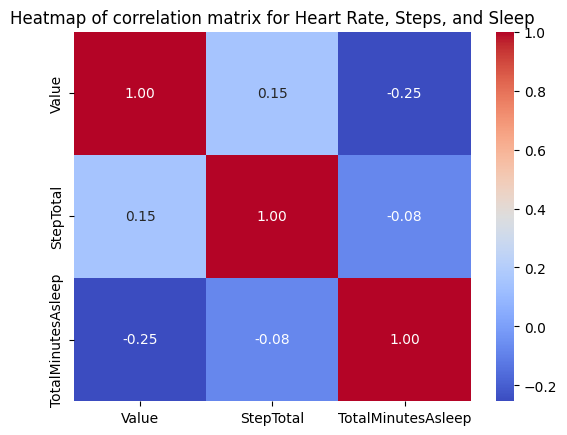

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

correlation_matrix = merged_with_sleep_df[['Value', 'StepTotal', 'TotalMinutesAsleep']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of correlation matrix for Heart Rate, Steps, and Sleep')
plt.show()

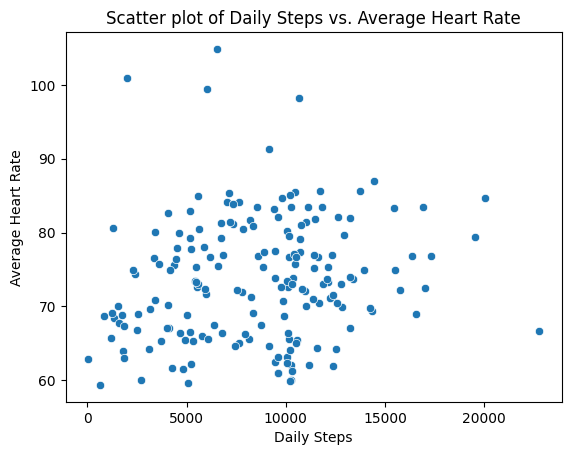

In [ ]:
# Scatter plot for steps vs heart rate
sns.scatterplot(data=merged_with_sleep_df, x='StepTotal', y='Value')
plt.title('Scatter plot of Daily Steps vs. Average Heart Rate')
plt.xlabel('Daily Steps')
plt.ylabel('Average Heart Rate')
plt.show()

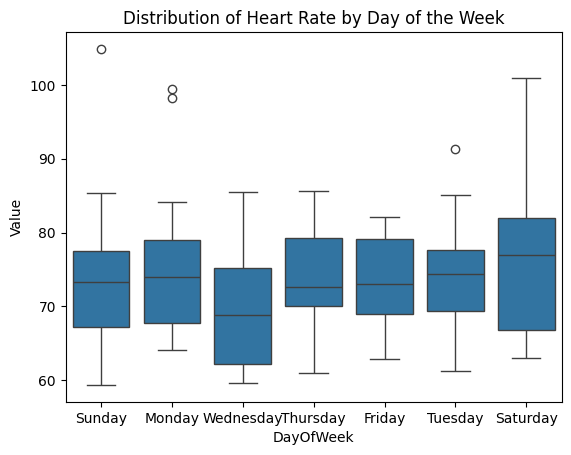

In [ ]:
# Boxplot for heart rate by day of the week
sns.boxplot(data=merged_with_sleep_df, x='DayOfWeek', y='Value')
plt.title('Distribution of Heart Rate by Day of the Week')
plt.show()

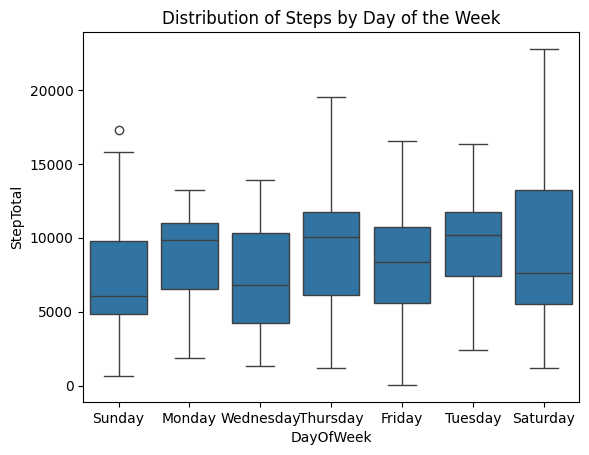

In [ ]:
# Boxplot for steps by day of the week
sns.boxplot(data=merged_with_sleep_df, x='DayOfWeek', y='StepTotal')
plt.title('Distribution of Steps by Day of the Week')
plt.show()

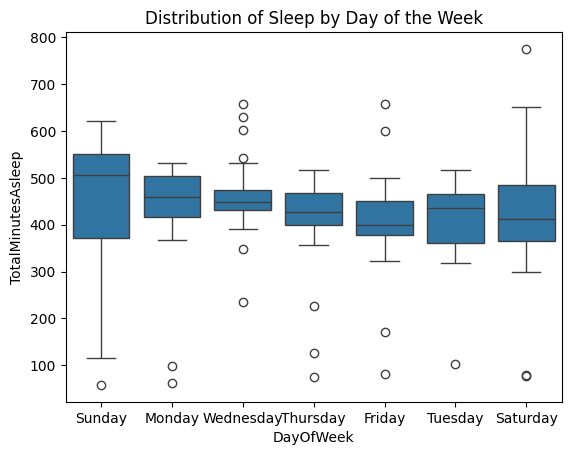

In [ ]:
# Boxplot for sleep by day of the week
sns.boxplot(data=merged_with_sleep_df, x='DayOfWeek', y='TotalMinutesAsleep')
plt.title('Distribution of Sleep by Day of the Week')
plt.show()

#Sleep quality check


In [ ]:
heartrate_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/heartrate_seconds_merged.csv')
daily_activity_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/dailyActivity_merged.csv')  # Assuming this is the file for daily activity
sleep_data_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/sleepDay_merged.csv')

In [ ]:
heartrate_df['Time'] = pd.to_datetime(heartrate_df['Time'])
daily_activity_df['ActivityDate'] = pd.to_datetime(daily_activity_df['ActivityDate'])
sleep_data_df['SleepDay'] = pd.to_datetime(sleep_data_df['SleepDay'])

<ipython-input-18-543af672f51f>:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  sleep_data_df['SleepDay'] = pd.to_datetime(sleep_data_df['SleepDay'])


In [ ]:
heartrate_df['Date'] = heartrate_df['Time'].dt.date
daily_activity_df['Date'] = daily_activity_df['ActivityDate'].dt.date
sleep_data_df['Date'] = sleep_data_df['SleepDay'].dt.date

In [ ]:
daily_heartrate_df = heartrate_df.groupby(['Id', 'Date']).mean().reset_index()

In [ ]:
merged_df = pd.merge(daily_heartrate_df, daily_activity_df, on=['Id', 'Date'], how='inner')
merged_with_sleep_df = pd.merge(merged_df, sleep_data_df, on=['Id', 'Date'], how='inner')

In [ ]:
correlation_matrix = merged_with_sleep_df[['VeryActiveMinutes', 'TotalMinutesAsleep']].corr()
print("Correlation matrix:")
print(correlation_matrix)

Correlation matrix:
                    VeryActiveMinutes  TotalMinutesAsleep
VeryActiveMinutes            1.000000           -0.050421
TotalMinutesAsleep          -0.050421            1.000000


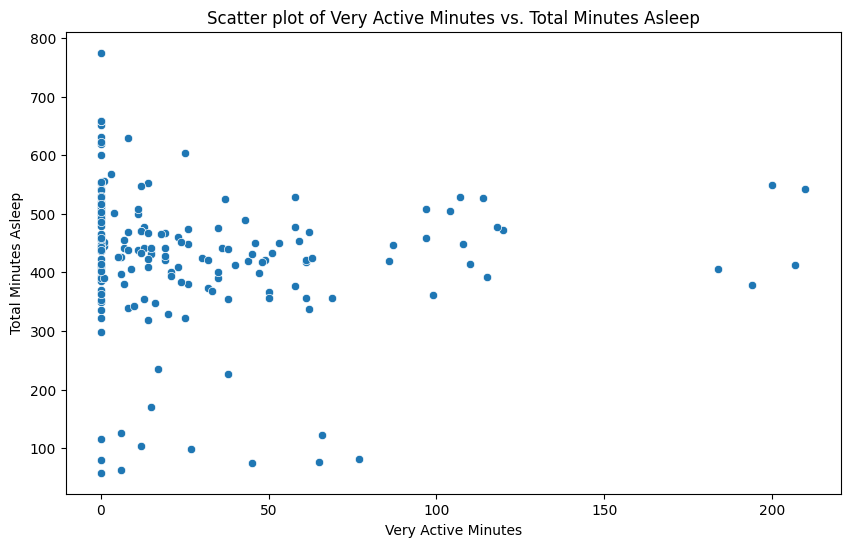

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_with_sleep_df, x='VeryActiveMinutes', y='TotalMinutesAsleep')
plt.title('Scatter plot of Very Active Minutes vs. Total Minutes Asleep')
plt.xlabel('Very Active Minutes')
plt.ylabel('Total Minutes Asleep')
plt.show()


Correlation matrix for FairlyActiveMinutes:
                     FairlyActiveMinutes  TotalMinutesAsleep
FairlyActiveMinutes             1.000000           -0.153613
TotalMinutesAsleep             -0.153613            1.000000


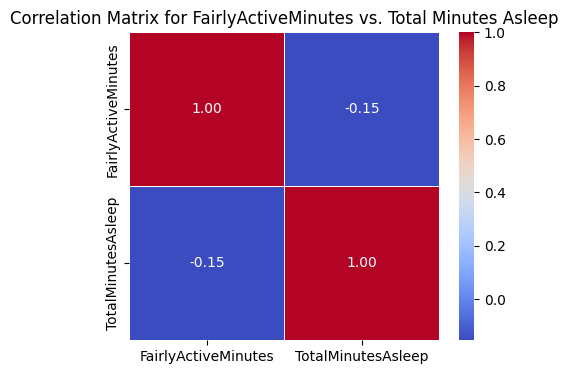


Correlation matrix for LightlyActiveMinutes:
                      LightlyActiveMinutes  TotalMinutesAsleep
LightlyActiveMinutes              1.000000            0.000961
TotalMinutesAsleep                0.000961            1.000000


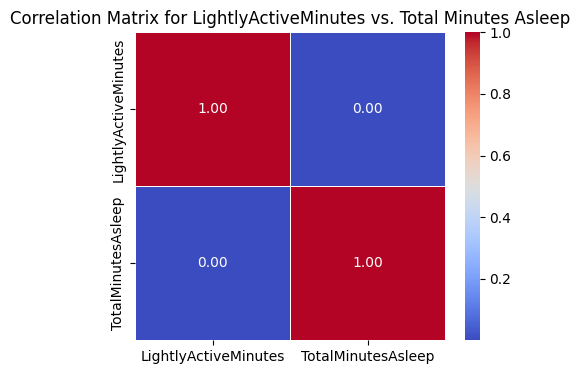


Correlation matrix for SedentaryMinutes:
                    SedentaryMinutes  TotalMinutesAsleep
SedentaryMinutes            1.000000           -0.617399
TotalMinutesAsleep         -0.617399            1.000000


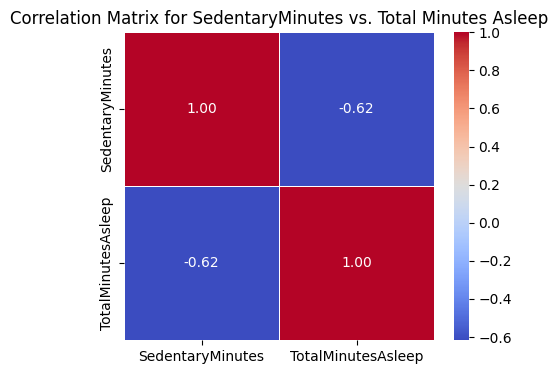


Correlation matrix for Calories:
                    Calories  TotalMinutesAsleep
Calories            1.000000           -0.125342
TotalMinutesAsleep -0.125342            1.000000


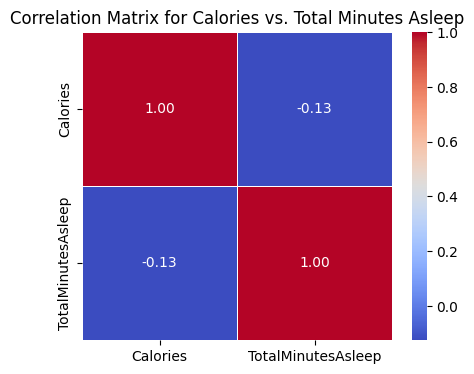

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of activity metrics
activity_metrics = ['FairlyActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories']

for metric in activity_metrics:
    # Calculate the correlation matrix
    correlation_matrix = merged_with_sleep_df[[metric, 'TotalMinutesAsleep']].corr()
    print(f"\nCorrelation matrix for {metric}:")
    print(correlation_matrix)

    # Plot the correlation matrix
    plt.figure(figsize=(5, 4))
    sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
    plt.title(f'Correlation Matrix for {metric} vs. Total Minutes Asleep')
    plt.show()


Correlation matrix for FairlyActiveMinutes:
                     FairlyActiveMinutes  TotalMinutesAsleep
FairlyActiveMinutes             1.000000           -0.153613
TotalMinutesAsleep             -0.153613            1.000000


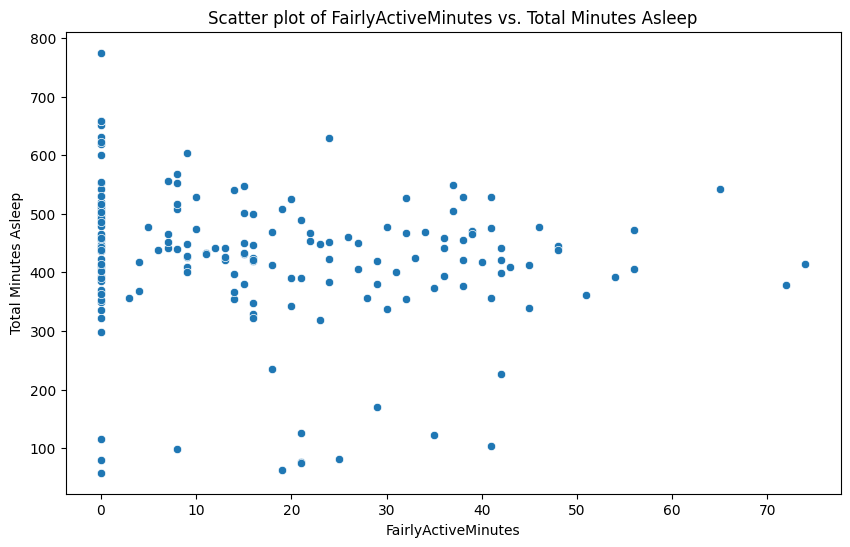


Correlation matrix for LightlyActiveMinutes:
                      LightlyActiveMinutes  TotalMinutesAsleep
LightlyActiveMinutes              1.000000            0.000961
TotalMinutesAsleep                0.000961            1.000000


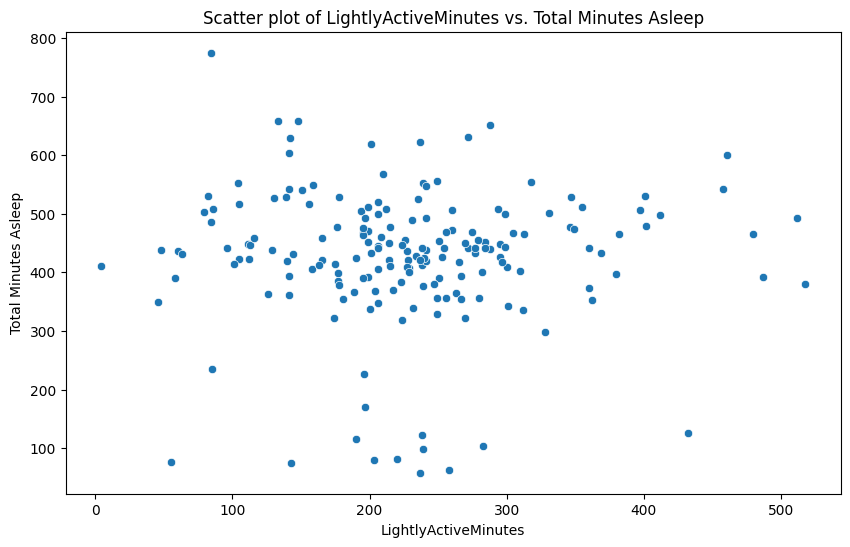


Correlation matrix for SedentaryMinutes:
                    SedentaryMinutes  TotalMinutesAsleep
SedentaryMinutes            1.000000           -0.617399
TotalMinutesAsleep         -0.617399            1.000000


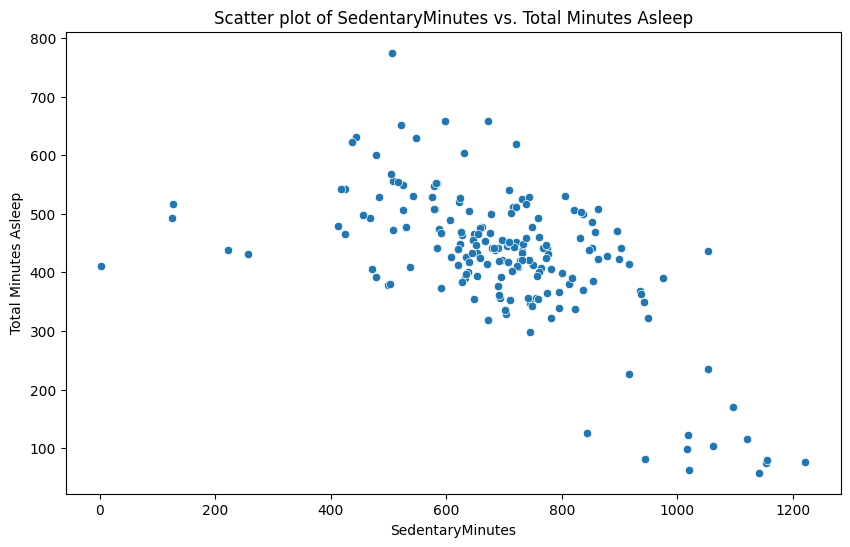


Correlation matrix for Calories:
                    Calories  TotalMinutesAsleep
Calories            1.000000           -0.125342
TotalMinutesAsleep -0.125342            1.000000


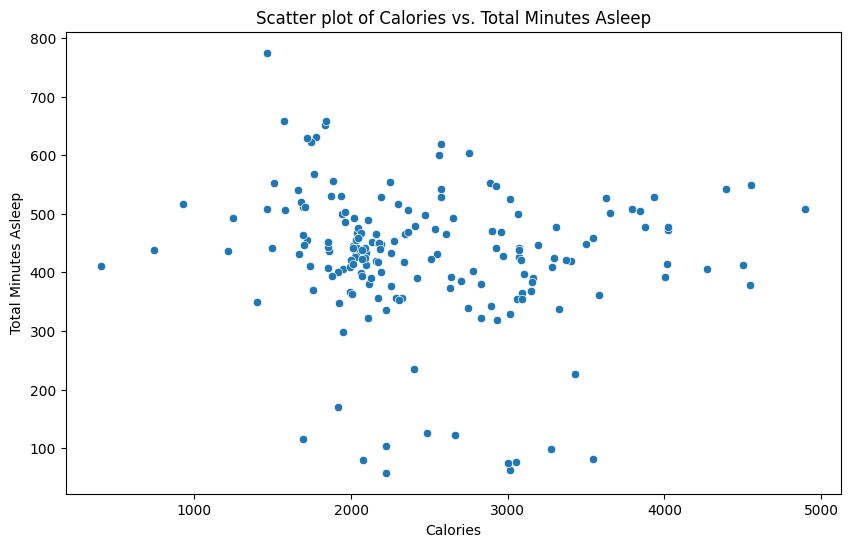

In [ ]:
# Calculate correlation for other activity metrics
activity_metrics = ['FairlyActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories']

for metric in activity_metrics:
    correlation_matrix = merged_with_sleep_df[[metric, 'TotalMinutesAsleep']].corr()
    print(f"\nCorrelation matrix for {metric}:")
    print(correlation_matrix)

    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=merged_with_sleep_df, x=metric, y='TotalMinutesAsleep')
    plt.title(f'Scatter plot of {metric} vs. Total Minutes Asleep')
    plt.xlabel(metric)
    plt.ylabel('Total Minutes Asleep')
    plt.show()

Correlation matrix for CompositeActivityScore:
                        CompositeActivityScore  TotalMinutesAsleep
CompositeActivityScore                1.000000            0.467238
TotalMinutesAsleep                    0.467238            1.000000


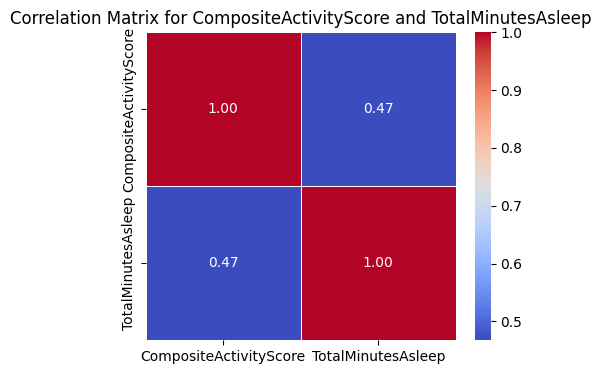

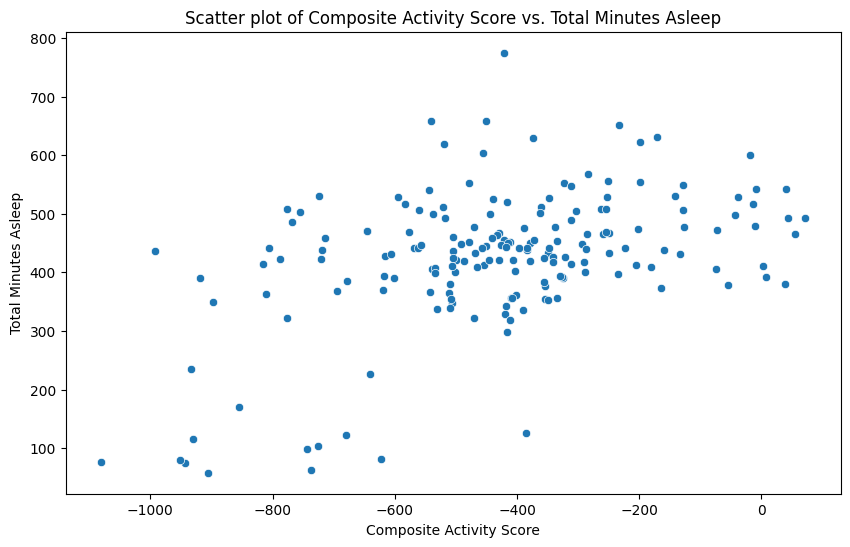

In [ ]:
# Create a composite activity score
merged_with_sleep_df['CompositeActivityScore'] = (
    merged_with_sleep_df['VeryActiveMinutes'] +
    merged_with_sleep_df['FairlyActiveMinutes'] +
    merged_with_sleep_df['LightlyActiveMinutes'] -
    merged_with_sleep_df['SedentaryMinutes']
)

# Calculate the correlation matrix
correlation_matrix = merged_with_sleep_df[['CompositeActivityScore', 'TotalMinutesAsleep']].corr()
print("Correlation matrix for CompositeActivityScore:")
print(correlation_matrix)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(5, 4))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix for CompositeActivityScore and TotalMinutesAsleep')
plt.show()

# Scatter plot for CompositeActivityScore vs sleep
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_with_sleep_df, x='CompositeActivityScore', y='TotalMinutesAsleep')
plt.title('Scatter plot of Composite Activity Score vs. Total Minutes Asleep')
plt.xlabel('Composite Activity Score')
plt.ylabel('Total Minutes Asleep')
plt.show()

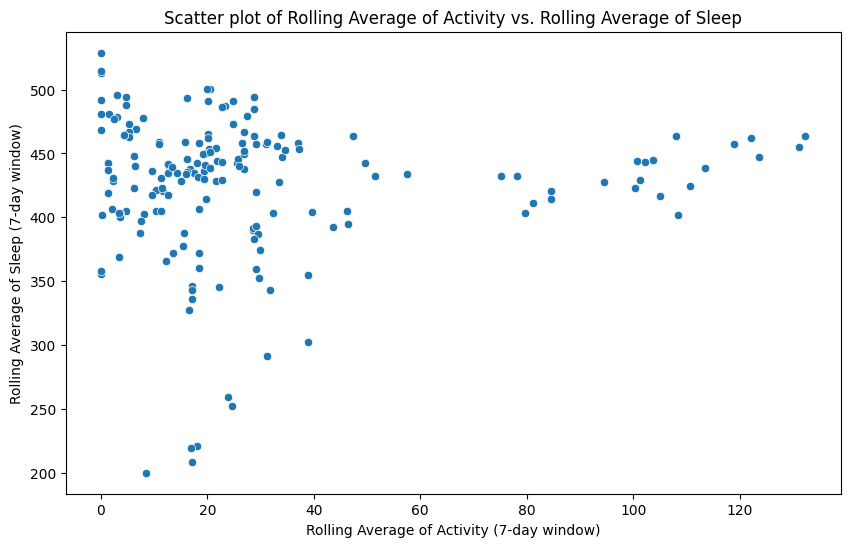

In [ ]:
# Calculate rolling average of activity metrics
merged_with_sleep_df['RollingAvgActivity'] = merged_with_sleep_df['VeryActiveMinutes'].rolling(window=7).mean()
merged_with_sleep_df['RollingAvgSleep'] = merged_with_sleep_df['TotalMinutesAsleep'].rolling(window=7).mean()

# Scatter plot for rolling averages
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_with_sleep_df, x='RollingAvgActivity', y='RollingAvgSleep')
plt.title('Scatter plot of Rolling Average of Activity vs. Rolling Average of Sleep')
plt.xlabel('Rolling Average of Activity (7-day window)')
plt.ylabel('Rolling Average of Sleep (7-day window)')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


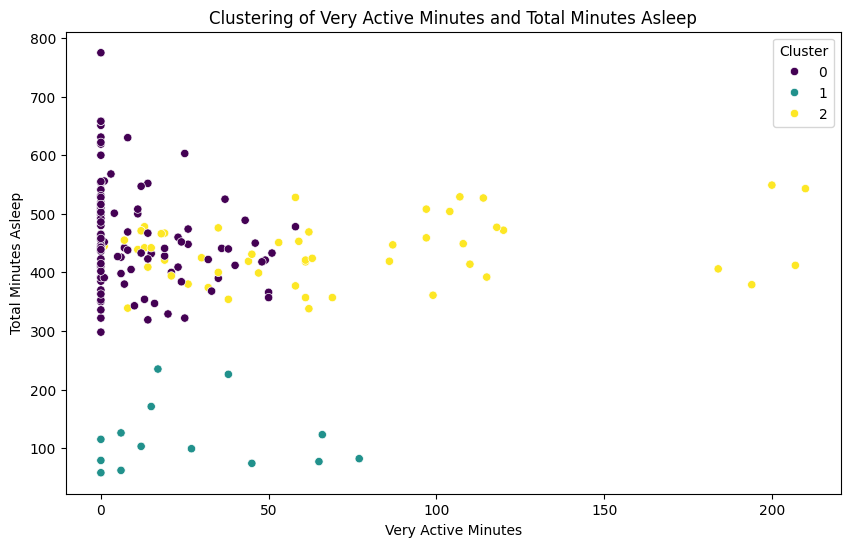

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Select features for clustering
features = merged_with_sleep_df[['VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'TotalMinutesAsleep']]

# Standardize features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
merged_with_sleep_df['Cluster'] = kmeans.fit_predict(scaled_features)

# Plot clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_with_sleep_df, x='VeryActiveMinutes', y='TotalMinutesAsleep', hue='Cluster', palette='viridis')
plt.title('Clustering of Very Active Minutes and Total Minutes Asleep')
plt.xlabel('Very Active Minutes')
plt.ylabel('Total Minutes Asleep')
plt.show()

Correlation matrix:
                      VeryActiveMinutes  LightlyActiveMinutes  \
VeryActiveMinutes              1.000000             -0.200357   
LightlyActiveMinutes          -0.200357              1.000000   
SedentaryMinutes              -0.107318             -0.249404   
Calories                       0.670545              0.119518   
TotalMinutesAsleep            -0.050421              0.000961   

                      SedentaryMinutes  Calories  TotalMinutesAsleep  
VeryActiveMinutes            -0.107318  0.670545           -0.050421  
LightlyActiveMinutes         -0.249404  0.119518            0.000961  
SedentaryMinutes              1.000000  0.056387           -0.617399  
Calories                      0.056387  1.000000           -0.125342  
TotalMinutesAsleep           -0.617399 -0.125342            1.000000  


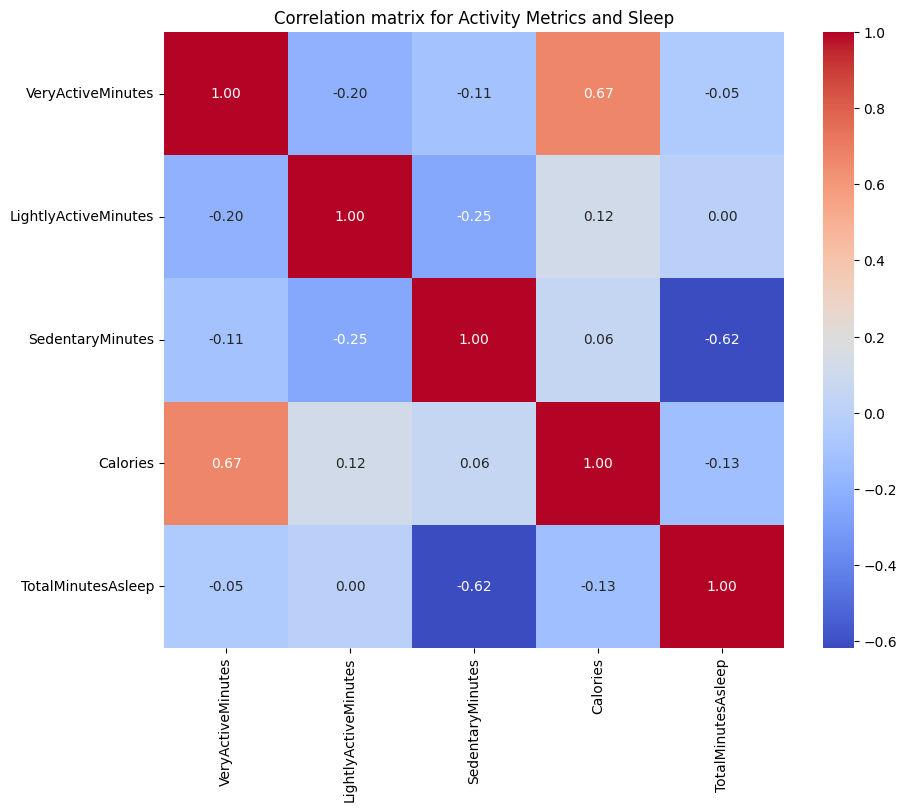

In [ ]:
# Calculate the correlation matrix for all relevant metrics
correlation_matrix = merged_with_sleep_df[['VeryActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories', 'TotalMinutesAsleep']].corr()
print("Correlation matrix:")
print(correlation_matrix)

# Plot heatmap of correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation matrix for Activity Metrics and Sleep')
plt.show()

In [ ]:
# Calculate the Pearson correlation coefficient and p-value for VeryActiveMinutes and TotalMinutesAsleep
correlation_coefficient, p_value = pearsonr(merged_with_sleep_df['VeryActiveMinutes'], merged_with_sleep_df['TotalMinutesAsleep'])

print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")


Pearson correlation coefficient: -0.05042114177641696
P-value: 0.499064861181327


In [ ]:
# Create new features
merged_with_sleep_df['ActiveMinutesRatio'] = merged_with_sleep_df['VeryActiveMinutes'] / (merged_with_sleep_df['SedentaryMinutes'] + 1)
merged_with_sleep_df['LightActiveToSedentaryRatio'] = merged_with_sleep_df['LightlyActiveMinutes'] / (merged_with_sleep_df['SedentaryMinutes'] + 1)

# Calculate rolling averages
merged_with_sleep_df['RollingAvgActivity'] = merged_with_sleep_df['CompositeActivityScore'].rolling(window=7).mean()
merged_with_sleep_df['RollingAvgSleep'] = merged_with_sleep_df['TotalMinutesAsleep'].rolling(window=7).mean()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


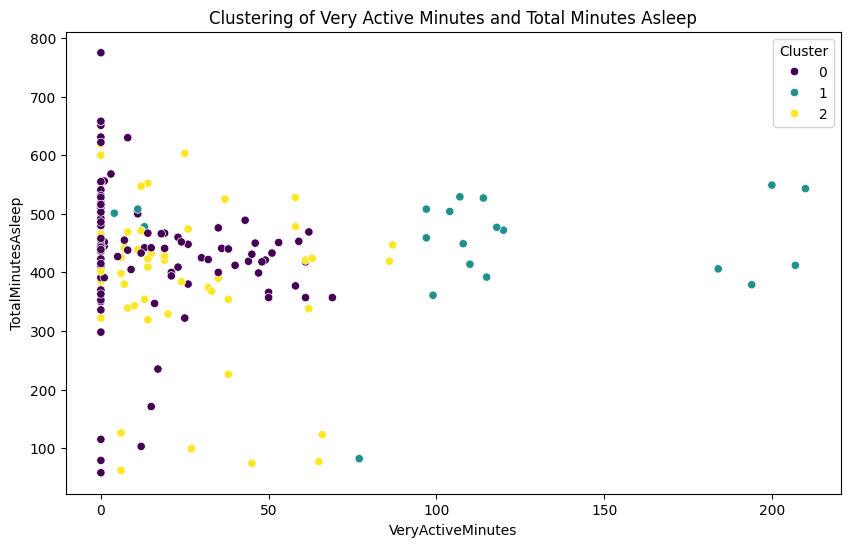

In [ ]:
from sklearn.cluster import KMeans

# Prepare data for clustering
activity_sleep_data = merged_with_sleep_df[['VeryActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories', 'TotalMinutesAsleep']].dropna()

# Perform KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
merged_with_sleep_df['Cluster'] = kmeans.fit_predict(activity_sleep_data)

# Plot clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_with_sleep_df, x='VeryActiveMinutes', y='TotalMinutesAsleep', hue='Cluster', palette='viridis')
plt.title('Clustering of Very Active Minutes and Total Minutes Asleep')
plt.show()

Mean Squared Error: 7492.971716216216


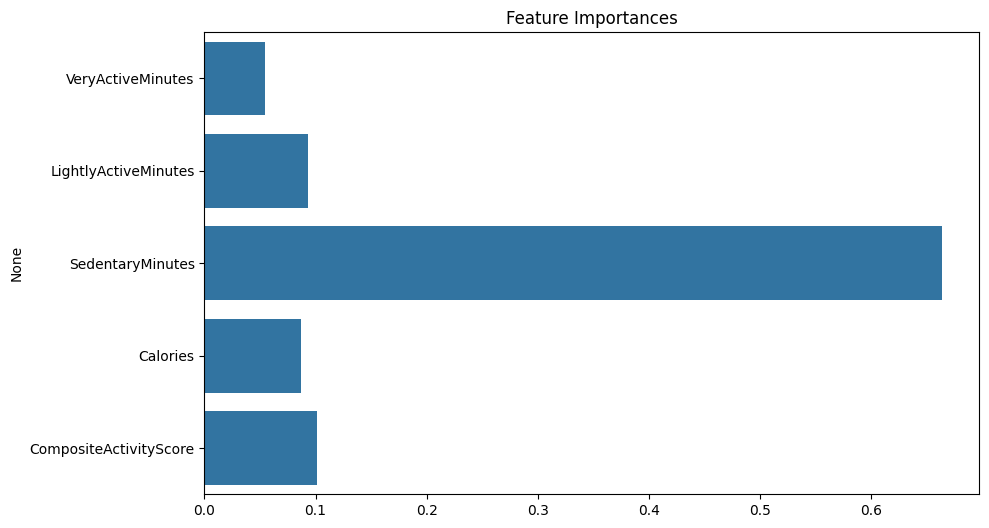

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Prepare data for modeling
X = merged_with_sleep_df[['VeryActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories', 'CompositeActivityScore']]
y = merged_with_sleep_df['TotalMinutesAsleep']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate model performance
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=model.feature_importances_, y=X.columns)
plt.title('Feature Importances')
plt.show()

<ipython-input-257-e4ad4bae2c7e>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_df['ActivityIntensity'] = (cleaned_df['VeryActiveMinutes'] + cleaned_df['FairlyActiveMinutes']) / cleaned_df['SedentaryMinutes']


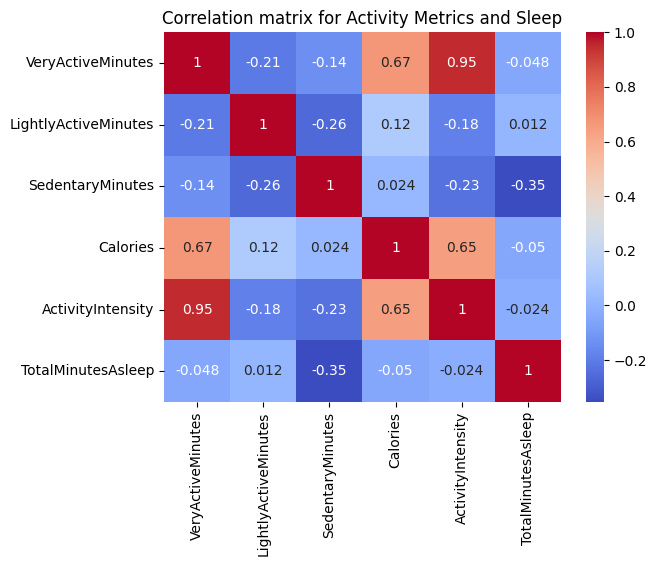

In [ ]:
# Removing outliers
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

cleaned_df = remove_outliers(merged_with_sleep_df, 'TotalMinutesAsleep')

# Creating composite features
cleaned_df['ActivityIntensity'] = (cleaned_df['VeryActiveMinutes'] + cleaned_df['FairlyActiveMinutes']) / cleaned_df['SedentaryMinutes']

# Check correlations again
correlation_matrix = cleaned_df[['VeryActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories', 'ActivityIntensity', 'TotalMinutesAsleep']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation matrix for Activity Metrics and Sleep')
plt.show()

In [ ]:
import pandas as pd

# Load your data
data = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/sleepDay_merged.csv')

# Calculate TimeToFallAsleep
data['TimeToFallAsleep'] = data['TotalTimeInBed'] - data['TotalMinutesAsleep']

# Save the updated dataframe if needed
data.to_csv('updated_sleepDay_merged.csv', index=False)

# Display the first few rows to verify the new column
data.head()

,Id,SleepDay,TotalSleepRecords,TotalMinutesAsleep,TotalTimeInBed,TimeToFallAsleep
0,1503960366,4/12/2016 12:00:00 AM,1,327,346,19
1,1503960366,4/13/2016 12:00:00 AM,2,384,407,23
2,1503960366,4/15/2016 12:00:00 AM,1,412,442,30
3,1503960366,4/16/2016 12:00:00 AM,2,340,367,27
4,1503960366,4/17/2016 12:00:00 AM,1,700,712,12


In [ ]:
# Load the updated dataset
data = pd.read_csv('updated_sleepDay_merged.csv')
heartrate_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/heartrate_seconds_merged.csv')
daily_activity_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/dailyActivity_merged.csv')


In [ ]:
# Merge datasets
merged_data = pd.merge(data, daily_activity_df, on='Id')

In [ ]:

# Check if 'CompositeActivityScore' exists, if not create it
if 'CompositeActivityScore' not in merged_data.columns:
    merged_data['CompositeActivityScore'] = (merged_data['VeryActiveMinutes'] + merged_data['FairlyActiveMinutes'] + merged_data['LightlyActiveMinutes']) / (merged_data['SedentaryMinutes'] + 1)  # Avoid division by zero


In [ ]:
# Create additional features
merged_data['ActivityIntensity'] = (merged_data['VeryActiveMinutes'] + merged_data['LightlyActiveMinutes']) / (merged_data['SedentaryMinutes'] + 1)
merged_data['SleepEfficiency'] = merged_data['TotalMinutesAsleep'] / merged_data['TotalTimeInBed']
merged_data['TimeInBedPerSleepRecord'] = merged_data['TotalTimeInBed'] / (merged_data['TotalSleepRecords'] + 1)


In [ ]:
# Replace infinity values with NaN
merged_data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [ ]:
# Drop rows with NaN values
merged_data.dropna(inplace=True)

In [ ]:
# Check for any extremely large values
for column in merged_data.columns:
    if merged_data[column].dtype in [np.float64, np.int64]:
        print(f"Checking {column}")
        if (merged_data[column].abs() > 1e10).any():
            print(f"Found extremely large values in {column}")
            merged_data = merged_data[merged_data[column].abs() <= 1e10]


Checking Id
Checking TotalSleepRecords
Checking TotalMinutesAsleep
Checking TotalTimeInBed
Checking TimeToFallAsleep
Checking TotalSteps
Checking TotalDistance
Checking TrackerDistance
Checking LoggedActivitiesDistance
Checking VeryActiveDistance
Checking ModeratelyActiveDistance
Checking LightActiveDistance
Checking SedentaryActiveDistance
Checking VeryActiveMinutes
Checking FairlyActiveMinutes
Checking LightlyActiveMinutes
Checking SedentaryMinutes
Checking Calories
Checking CompositeActivityScore
Checking ActivityIntensity
Checking SleepEfficiency
Checking TimeInBedPerSleepRecord


In [ ]:
# Define features and target
features = ['VeryActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories', 'CompositeActivityScore', 'TimeToFallAsleep', 'ActivityIntensity', 'SleepEfficiency', 'TimeInBedPerSleepRecord']
target = 'TotalMinutesAsleep'

In [ ]:
# Prepare data for modeling
X = merged_data[features]
y = merged_data[target]

In [ ]:
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:

# Split data into training, validation, and testing sets
X_train, X_temp, y_train, y_temp = train_test_split(X_scaled, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


In [ ]:

# Initialize and train a Gradient Boosting model
model = GradientBoostingRegressor(random_state=42)

In [ ]:

# Hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6],
    'min_samples_split': [2, 5, 10]
}

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

KeyboardInterrupt: 

In [ ]:
# Best model
best_model = grid_search.best_estimator_

In [ ]:
# Evaluate the model on the validation set
y_val_pred = best_model.predict(X_val)
val_mse = mean_squared_error(y_val, y_val_pred)
val_r2 = r2_score(y_val, y_val_pred)
print(f'Validation Mean Squared Error: {val_mse}')
print(f'Validation R^2 Score: {val_r2}')


In [ ]:
# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)
print(f'Test Mean Squared Error: {test_mse}')
print(f'Test R^2 Score: {test_r2}')

In [ ]:
# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=best_model.feature_importances_, y=features)
plt.title('Feature Importances')
plt.show()

In [ ]:
# Check correlations again
correlation_matrix = merged_data[features + [target]].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation matrix for Activity Metrics and Sleep')
plt.show()

In [ ]:
import joblib

# Save the best model to disk
joblib.dump(best_model, 'best_gradient_boosting_model.pkl')

In [ ]:
# Plot predicted vs actual values for the test set
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, alpha=0.3)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')
plt.xlabel('Actual Total Minutes Asleep')
plt.ylabel('Predicted Total Minutes Asleep')
plt.title('Actual vs Predicted Total Minutes Asleep')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Get feature importances and their standard deviation
importances = best_model.feature_importances_
std = np.std([tree.feature_importances_ for tree in best_model.estimators_[-1]], axis=0)

# Sort the features by importance
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")
for f in range(X.shape[1]):
    print(f"{f + 1}. Feature {indices[f]} ({importances[indices[f]]})")

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(range(X.shape[1]), importances[indices], color="r", yerr=std, align="center")
plt.xticks(range(X.shape[1]), np.array(features)[indices], rotation=45)
plt.xlim([-1, X.shape[1]])
plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation
cv_scores = cross_val_score(best_model, X_scaled, y, cv=10, scoring='neg_mean_squared_error')

# Print cross-validation results
print(f"Cross-Validation MSE Scores: {-cv_scores}")
print(f"Mean Cross-Validation MSE: {-cv_scores.mean()}")
print(f"Standard Deviation of Cross-Validation MSE: {cv_scores.std()}")

In [ ]:
# Calculate residuals
residuals = y_test - y_test_pred

# Plot residuals
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5)
plt.hlines(0, min(y_test), max(y_test), colors='r', linestyles='dashed')
plt.xlabel('Actual Total Minutes Asleep')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.show()

# Plot distribution of residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.xlabel('Residuals')
plt.title('Distribution of Residuals')
plt.show()

In [ ]:
# Define a function to remove outliers based on IQR
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply the function to remove outliers in the target variable
cleaned_data = remove_outliers(merged_data, 'TotalMinutesAsleep')

# Redefine features and target with cleaned data
X_cleaned = cleaned_data[features]
y_cleaned = cleaned_data[target]

# Scale the features
X_scaled_cleaned = scaler.fit_transform(X_cleaned)

# Split data into training, validation, and testing sets
X_train_cleaned, X_temp_cleaned, y_train_cleaned, y_temp_cleaned = train_test_split(X_scaled_cleaned, y_cleaned, test_size=0.3, random_state=42)
X_val_cleaned, X_test_cleaned, y_val_cleaned, y_test_cleaned = train_test_split(X_temp_cleaned, y_temp_cleaned, test_size=0.5, random_state=42)

In [ ]:
# Initialize different models
models = {
    'RandomForest': RandomForestRegressor(random_state=42),
    'GradientBoosting': GradientBoostingRegressor(random_state=42),
    'AdaBoost': AdaBoostRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42)
}


In [ ]:
# Hyperparameter grid for each model
param_grids = {
    'RandomForest': {
        'n_estimators': [100, 200, 300],
        'max_depth': [3, 4, 5, 6],
        'min_samples_split': [2, 5, 10]
    },
    'GradientBoosting': {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 4, 5, 6],
        'min_samples_split': [2, 5, 10]
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.05, 0.1, 0.2]
    },
    'XGBoost': {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 4, 5, 6],
        'min_child_weight': [1, 3, 5]
    }
}


In [ ]:
# Perform grid search for each model
best_models = {}
for model_name in models:
    grid_search = GridSearchCV(estimator=models[model_name], param_grid=param_grids[model_name], cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
    grid_search.fit(X_train_cleaned, y_train_cleaned)
    best_models[model_name] = grid_search.best_estimator_
    print(f"Best {model_name} model: {grid_search.best_estimator_}")

In [ ]:
for model_name, model in best_models.items():
    # Validate on the validation set
    y_val_pred_cleaned = model.predict(X_val_cleaned)
    val_mse_cleaned = mean_squared_error(y_val_cleaned, y_val_pred_cleaned)
    val_r2_cleaned = r2_score(y_val_cleaned, y_val_pred_cleaned)
    print(f"{model_name} Validation MSE: {val_mse_cleaned}")
    print(f"{model_name} Validation R^2 Score: {val_r2_cleaned}")

    # Test on the test set
    y_test_pred_cleaned = model.predict(X_test_cleaned)
    test_mse_cleaned = mean_squared_error(y_test_cleaned, y_test_pred_cleaned)
    test_r2_cleaned = r2_score(y_test_cleaned, y_test_pred_cleaned)
    print(f"{model_name} Test MSE: {test_mse_cleaned}")
    print(f"{model_name} Test R^2 Score: {test_r2_cleaned}")

    # Plot predicted vs actual values for the test set
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test_cleaned, y_test_pred_cleaned, alpha=0.3)
    plt.plot([min(y_test_cleaned), max(y_test_cleaned)], [min(y_test_cleaned), max(y_test_cleaned)], 'r--')
    plt.xlabel('Actual Total Minutes Asleep')
    plt.ylabel('Predicted Total Minutes Asleep')
    plt.title(f'Actual vs Predicted Total Minutes Asleep - {model_name}')
    plt.show()

In [ ]:
# Feature Importance Analysis for Gradient Boosting
importances = best_models['GradientBoosting'].feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking for Gradient Boosting:")
for f in range(X.shape[1]):
    print(f"{f + 1}. Feature {indices[f]} ({importances[indices[f]]})")

In [ ]:

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importances for Gradient Boosting")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), np.array(features)[indices], rotation=45)
plt.xlim([-1, X.shape[1]])
plt.show()

# Feature Importance Analysis for XGBoost
importances = best_models['XGBoost'].feature_importances_
indices = np.argsort(importances)[::-1]


In [ ]:
# Print the feature ranking
print("Feature ranking for XGBoost:")
for f in range(X.shape[1]):
    print(f"{f + 1}. Feature {indices[f]} ({importances[indices[f]]})")


In [ ]:
# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importances for XGBoost")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), np.array(features)[indices], rotation=45)
plt.xlim([-1, X.shape[1]])
plt.show()

In [ ]:

# Save the Gradient Boosting model
joblib.dump(best_models['GradientBoosting'], 'best_gradient_boosting_model.pkl')

# Save the XGBoost model
joblib.dump(best_models['XGBoost'], 'best_xgboost_model.pkl')

In [ ]:
# Cross-validation for Gradient Boosting
cv_scores_gb = cross_val_score(best_models['GradientBoosting'], X_scaled_cleaned, y_cleaned, cv=10, scoring='neg_mean_squared_error')
print(f"Gradient Boosting Cross-Validation MSE Scores: {-cv_scores_gb}")
print(f"Mean Gradient Boosting Cross-Validation MSE: {-cv_scores_gb.mean()}")
print(f"Standard Deviation of Gradient Boosting Cross-Validation MSE: {cv_scores_gb.std()}")

# Cross-validation for XGBoost
cv_scores_xgb = cross_val_score(best_models['XGBoost'], X_scaled_cleaned, y_cleaned, cv=10, scoring='neg_mean_squared_error')
print(f"XGBoost Cross-Validation MSE Scores: {-cv_scores_xgb}")
print(f"Mean XGBoost Cross-Validation MSE: {-cv_scores_xgb.mean()}")
print(f"Standard Deviation of XGBoost Cross-Validation MSE: {cv_scores_xgb.std()}")

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

In [ ]:
# Load the updated dataset
data = pd.read_csv('updated_sleepDay_merged.csv')
heartrate_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/heartrate_seconds_merged.csv')
daily_activity_df = pd.read_csv('/content/drive/MyDrive/Fithelth/Fitbit/dailyActivity_merged.csv')


In [ ]:
# Merge datasets
merged_data = pd.merge(data, daily_activity_df, on='Id')

In [ ]:

# Check column names
print(merged_data.columns)

In [ ]:
# Ensure necessary columns are present
required_columns = ['TotalMinutesAsleep', 'VeryActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories']
if not all(col in merged_data.columns for col in required_columns):
    raise ValueError("Missing one or more required columns in the dataset.")

In [ ]:
# Apply logarithmic transformation to relevant variables
merged_data['log_TotalMinutesAsleep'] = np.log1p(merged_data['TotalMinutesAsleep'])
merged_data['log_VeryActiveMinutes'] = np.log1p(merged_data['VeryActiveMinutes'])
merged_data['log_LightlyActiveMinutes'] = np.log1p(merged_data['LightlyActiveMinutes'])
merged_data['log_SedentaryMinutes'] = np.log1p(merged_data['SedentaryMinutes'])
merged_data['log_Calories'] = np.log1p(merged_data['Calories'])

In [ ]:
# Define log-transformed features and target
log_features = ['log_VeryActiveMinutes', 'log_LightlyActiveMinutes', 'log_SedentaryMinutes', 'log_Calories']
log_target = 'log_TotalMinutesAsleep'


In [ ]:
# Prepare data for modeling
X_log = merged_data[log_features]
y_log = merged_data[log_target]


In [ ]:
# Scale the features
scaler_log = StandardScaler()
X_scaled_log = scaler_log.fit_transform(X_log)


In [ ]:
# Split data into training, validation, and testing sets
X_train_log, X_temp_log, y_train_log, y_temp_log = train_test_split(X_scaled_log, y_log, test_size=0.3, random_state=42)
X_val_log, X_test_log, y_val_log, y_test_log = train_test_split(X_temp_log, y_temp_log, test_size=0.5, random_state=42)

In [ ]:
# Import the necessary library for SVM
from sklearn.svm import SVR

In [ ]:
# Initialize the SVR model
svm_model = SVR()

# Define hyperparameter grid for grid search
param_grid_svm = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto'],
    'epsilon': [0.01, 0.1, 0.5, 1]
}

# Perform grid search for SVR
grid_search_svm = GridSearchCV(estimator=svm_model, param_grid=param_grid_svm, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_svm.fit(X_train_log, y_train_log)


In [ ]:
# Best model
best_svm_model = grid_search_svm.best_estimator_
print(f"Best SVM model: {grid_search_svm.best_estimator_}")


In [ ]:
# Evaluate the SVM model on the validation set
y_val_pred_log = best_svm_model.predict(X_val_log)
val_mse_log = mean_squared_error(y_val_log, y_val_pred_log)
val_r2_log = r2_score(y_val_log, y_val_pred_log)
print(f"SVM Validation MSE: {val_mse_log}")
print(f"SVM Validation R^2 Score: {val_r2_log}")


In [ ]:
# Evaluate the SVM model on the test set
y_test_pred_log = best_svm_model.predict(X_test_log)
test_mse_log = mean_squared_error(y_test_log, y_test_pred_log)
test_r2_log = r2_score(y_test_log, y_test_pred_log)
print(f"SVM Test MSE: {test_mse_log}")
print(f"SVM Test R^2 Score: {test_r2_log}")

In [ ]:
# Plot predicted vs actual values for the test set
plt.figure(figsize=(10, 6))
plt.scatter(np.expm1(y_test_log), np.expm1(y_test_pred_log), alpha=0.3)  # Use expm1 to inverse log transformation
plt.plot([min(np.expm1(y_test_log)), max(np.expm1(y_test_log))], [min(np.expm1(y_test_log)), max(np.expm1(y_test_log))], 'r--')
plt.xlabel('Actual Total Minutes Asleep')
plt.ylabel('Predicted Total Minutes Asleep')
plt.title('Actual vs Predicted Total Minutes Asleep - SVM')
plt.show()